# WTFAE: Flo's data

**Goal:** In WTFAE-2 I _sanity checked_ that I could reproduce the training of the nb Lukas gave me.

**Next:** Pop in Flo's generation function, and see if I can get similar results for the decoder with _his_ blobs.

**What will this diagnose?** I think mostly this will diagnose if I implemented the loss function correctly, although

**What next?** If this works, I _could_ take the pretrained encoder weights and slot representation, and then try to add a final semantic segmentation classifer?

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt

In [2]:
device='cuda:1'

In [3]:
nPixels = 32

xlow = -0.5
xhigh = 0.5
binWidth = (xhigh-xlow)/(nPixels+1)

bins = np.arange(xlow,xhigh,binWidth)


In [4]:
# args for rings
kwargs={'N_clusters':2,
        # 'isRing':False,
        # 'device':device, 
        # 'stdlow':0.001,
        # 'stdhigh':0.005
       }

In [5]:
def my_gen_data(
    bins=np.arange(xlow,xhigh,binWidth),
    N_events = 100000,
    N_clusters = 1,
    mean_var_cluster = np.log(0.001),
    sigma_var_cluster = 0.1,
    mean_lam_cluster = np.log(200.),
    sigma_lam_cluster = 1.,
    isRing=True,
    blurImage=False,
    xlow=-.5,
    xhigh=0.5,
    stdlow=0.01,
    stdhigh=0.05,
    device='cpu'
):
    '''
    Starts from Florian's `gen_events` function
    https://gitlab.lrz.de/neural_network_clustering/permutation_invariant_loss/-/blob/main/test_blur.ipynb
    
    But I wanted to return the occupancy maps that you multiply the OG image by to output partitioning
    of the image into the OG ring signals.
    '''

    eventHistograms = np.zeros(shape=(N_events, len(bins)-1, len(bins)-1,1) ) 
    
    eventMasks = np.zeros(shape=(N_events, N_clusters, len(bins)-1, len(bins)-1) ) 
    
    eventNumbers = np.zeros(N_events)

    nMaxClusters = N_clusters   
    
    eventInfo = np.zeros(shape=(N_events, nMaxClusters, 3))
    
    for iEvent in range(N_events):
        
        image = np.zeros_like(eventHistograms[iEvent,:,:,0])
        
        n_clusters = nMaxClusters

        eventNumbers[iEvent] += n_clusters
        eI = []
        
        for iCluster in range(min(n_clusters,nMaxClusters)):
            
            # how many events in this cluster
            lam_N_events_in_cluster = 1e3 
            
            N_events_in_cluster = np.random.poisson(lam_N_events_in_cluster)

            # where is the cluster center
            cluster_center = np.random.uniform(low=xlow, high=xhigh, size=2)

            # what is the cluster spread
            var_cluster = np.random.uniform(stdlow,stdhigh) 
            
            cluster_events_x0 = np.random.normal(loc=0., scale=1., size=N_events_in_cluster)
            cluster_events_y0 = np.random.normal(loc=0., scale=1., size=N_events_in_cluster)

            if isRing:
                fact = np.sqrt(var_cluster/(cluster_events_x0**2+cluster_events_y0**2))
            else:
                fact = np.sqrt(var_cluster)

            cluster_events_x = cluster_events_x0*fact + cluster_center[0]
            cluster_events_y = cluster_events_y0*fact + cluster_center[1]
            
            # bin the events
            H, _, _ = np.histogram2d(cluster_events_x, cluster_events_y, bins=[bins,bins])

            eventMasks[iEvent,iCluster] = H.T
            image += H.T
                        
            eI.append(np.concatenate([cluster_center, [var_cluster]]))

        eventHistograms[iEvent,:,:,0] = np.copy(image)

        eventInfo[iEvent] = np.array(eI)
    
    # reshape eventHistograms
    eventHistograms = eventHistograms[:,None,:,:,0] # shape (bs, 1, nPixels, nPixels)
    
    eventMasks = np.where(eventHistograms>0,eventMasks/eventHistograms,eventMasks)
    
    return eventHistograms, eventInfo, eventMasks

In [6]:
out = my_gen_data(N_events=123,N_clusters=2)

<ipython-input-5-cf5e58822e6e>:83: RuntimeWarning: invalid value encountered in true_divide
  eventMasks = np.where(eventHistograms>0,eventMasks/eventHistograms,eventMasks)


In [7]:
[oi.shape for oi in out]

[(123, 1, 32, 32), (123, 2, 3), (123, 2, 32, 32)]

In [8]:
def make_batch(
        Nbatch = 34,
        data_mean = torch.FloatTensor([0,0,0,0,3]),
        data_std = torch.FloatTensor([1,1,1,1,1])
    ):
    
    # Get the energies from Flo's scrip
    E, trgt, masks = my_gen_data(N_events=Nbatch,**kwargs)
    
    # Calc the grid w/ LH's calc
    bins = [np.linspace(0,1,nPixels+1)]*2
    _ed = np.linspace(0,1,nPixels+1)
    _ct = _ed[:-1] + np.diff(_ed)/2
    grid = np.meshgrid(*[_ct]*2, indexing='ij')
    
    grid = [np.tile(gi,(Nbatch,1,1))[:,None] for gi in grid]
    
    # log the energies and concatenate them
    logE = np.log(E + 1e-2)
    
    c = np.hstack([grid[0],grid[1], 1-grid[0],1-grid[1],logE])

    # Convert to Tensors
    data = torch.FloatTensor(c)
    trgt = torch.FloatTensor(trgt)
    
    return data.to(device), trgt.to(device)
make_batch(123)[0].shape, make_batch(123)[1].shape

<ipython-input-5-cf5e58822e6e>:83: RuntimeWarning: invalid value encountered in true_divide
  eventMasks = np.where(eventHistograms>0,eventMasks/eventHistograms,eventMasks)


(torch.Size([123, 5, 32, 32]), torch.Size([123, 2, 3]))

In [9]:
class TrivialSlotEncoder(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.latent_dim = 2
                
        self.hidden_dim = 4
        self.encoder1 = torch.nn.Sequential(
            torch.nn.Conv2d(5,self.hidden_dim,5, padding = 2),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(self.hidden_dim,self.hidden_dim,5, padding = 2),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(self.hidden_dim,self.hidden_dim,5, padding = 2),
        )
        self.encoder2 = torch.nn.Sequential(
            torch.nn.Flatten(),
            torch.nn.Linear((nPixels**2)*self.hidden_dim,128),
            torch.nn.ReLU(),
            torch.nn.Linear(128,self.latent_dim)
        )   
        
    def forward(self, data):
        encoded_data = self.encoder1(data)
        positions = self.encoder2(encoded_data)
        positions = positions.unsqueeze(1)
        return positions

In [10]:
class SlotAttentionEncoder(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.k_slots = 3
        self.latent_dim = 32
        self.hidden_dim = 32
        self.query_dim = 32
        self.slot_dim = 32
        self.n_iter = 1

        self.queryN = torch.nn.LayerNorm(self.query_dim)
        self.dataN = torch.nn.LayerNorm(self.hidden_dim)
        self.updateN = torch.nn.LayerNorm(self.query_dim)

        self.toK = torch.nn.Linear(self.hidden_dim,self.query_dim)
        self.toV = torch.nn.Linear(self.hidden_dim,self.query_dim)
        self.gru = torch.nn.GRUCell(self.query_dim, self.query_dim)

        self.encoder = torch.nn.Sequential(
            torch.nn.Conv2d(5,self.hidden_dim,5, padding = 2),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(self.hidden_dim,self.hidden_dim,5, padding = 2),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(self.hidden_dim,self.hidden_dim,5, padding = 2),
        )   
        
        self.final = torch.nn.Sequential(
            torch.nn.Linear(self.query_dim, 16),
            torch.nn.ReLU(),
            torch.nn.Linear(16,self.slot_dim)
        )

        self.updateff = torch.nn.Sequential(
            torch.nn.Linear(self.query_dim, 16),
            torch.nn.ReLU(),
            torch.nn.Linear(16,self.query_dim)
        )
        
    def init_slots(self, Nbatch):
        noise = torch.randn(Nbatch, self.k_slots, self.query_dim).to(device)
        
        mu = torch.zeros(1,1,self.query_dim).to(device)
        logsigma = torch.zeros(1,1,self.query_dim).to(device)
        
        return mu + noise*logsigma.exp()


    def attention_and_weights(self,queries,encoded_data):
        keys = self.toK(encoded_data)
        att = torch.einsum('bse,bde->bsd',queries,keys) * (self.query_dim ** (-0.5)) * 10
        att = torch.nn.functional.softmax(att, dim = 1)

        div = torch.sum(att, dim = -1, keepdims = True)
        wts = att/div + 1e-8
        return att,wts

    def iterate(self, queries, encoded_data):
        encoded_data = torch.permute(encoded_data,(0,2,3,1))
        encoded_data = torch.flatten(encoded_data,1,2)
        encoded_data = self.dataN(encoded_data)
        
        att,wts = self.attention_and_weights(self.queryN(queries),encoded_data)        
        vals = self.toV(encoded_data)
        extracted = torch.einsum('bsd,bde->bse',wts,vals)
        
        extracted = self.gru(
            extracted.reshape(-1,self.query_dim),
            queries.reshape(-1,self.query_dim),
        )

        return extracted.reshape(queries.shape)
        
    def forward(self, data):
        Nbatch = data.shape[0]
        queries = self.init_slots(Nbatch)
        encoded_data = self.encoder(data)
        queries = self.iterate(queries, encoded_data)
        queries = self.iterate(queries, encoded_data)
        positions = self.final(queries)
        return positions,queries
        
SlotAttentionEncoder().to(device)(torch.randn(123,5,nPixels,nPixels,device=device))[0].shape

torch.Size([123, 3, 32])

In [11]:
TrivialSlotEncoder().to(device)(torch.randn(123,5,nPixels,nPixels,device=device)).shape

torch.Size([123, 1, 2])

In [12]:
class AttModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.latent_dim = 32

        self.encoder = SlotAttentionEncoder()
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.latent_dim,128),
            torch.nn.ReLU(),
            torch.nn.Linear(128,256),
            torch.nn.ReLU(),
            torch.nn.Linear(256,nPixels**2),
            torch.nn.Unflatten(-1,(nPixels,nPixels))
        )
        

    def forward(self, data):
        Nbatch, *_ = data.shape
        positions,queries = self.encoder(data)
        decoded = self.decoder(positions)
        reco = decoded.sum(dim = 1)
        return reco,queries,decoded

AttModel().to(device).encoder(make_batch(123)[0])[0].shape

<ipython-input-5-cf5e58822e6e>:83: RuntimeWarning: invalid value encountered in true_divide
  eventMasks = np.where(eventHistograms>0,eventMasks/eventHistograms,eventMasks)


torch.Size([123, 3, 32])

In [13]:
def plotit(batchidx, model, data, losses):
    with torch.no_grad():
        model.eval()
        pred,queries,decoded = model(data)
        encoded_data = model.encoder.encoder(data)
        encoded_data = torch.permute(encoded_data,(0,2,3,1))
        encoded_data = torch.flatten(encoded_data,1,2)
        encoded_data = model.encoder.dataN(encoded_data)
        att,wts = model.encoder.attention_and_weights(queries,encoded_data)
#         print(wts.sum(dim=-1).max(),'max')
        att = att.reshape(len(att),3,nPixels,nPixels)
        wts = wts.reshape(len(att),3,nPixels,nPixels)
        
        crap = model.decoder(torch.randn(2,model.encoder.k_slots,model.encoder.slot_dim,device=device))
        
    f,axarr = plt.subplots(3,6)
    ax = axarr[0,0]
    ax.plot(losses)
    ax.set_yscale('log')
    ax.axis('off')
    ax = axarr[0,1]
    ax.pcolormesh(data[batchidx,-1].cpu(), vmin = -3, vmax = 3)
    ax.axis('off')
    ax = axarr[0,2]
    ax.pcolormesh(pred[batchidx].cpu(), vmin = -3, vmax = 3)
    ax.axis('off')
    for i in range(3):
        ax = axarr[0,3+i]
        ax.pcolormesh(att[batchidx,i].cpu(), vmin = 0, vmax = 1)
        ax.axis('off')
    for i in range(3):
        ax = axarr[1,3+i]
        print(wts.min(),wts.max(),'>>><<')
        ax.pcolormesh(wts[batchidx,i].cpu(), vmin = 0, vmax = .001)
        ax.axis('off')
    for i in range(3):
        ax = axarr[1,i]
        ax.axis('off')
        ax = axarr[2,i]
        ax.axis('off')
    ax = axarr[1,0]
    ax.pcolormesh(crap[batchidx,0].cpu())

    ax = axarr[1,2]
    ax.pcolormesh(decoded.sum(dim=1)[batchidx].cpu(), vmin = -3, vmax = 3)
    for i in range(3):
        ax = axarr[2,3+i]
        ax.pcolormesh(decoded[batchidx,i].cpu(), vmin = -3, vmax = 3)
        ax.axis('off')
    f.set_size_inches(6,3)
    plt.show()    

def train(model, Ntrain = 5000):
    opt = torch.optim.Adam(model.parameters(), 3e-4)
    model.train()
    losses = []
    for i in range(Ntrain):
        
        warmup_steps = 5000
        learning_rate = 3e-4
        if i < warmup_steps:
            learning_rate = learning_rate * (i / warmup_steps)
        else:
            learning_rate = learning_rate
        opt.param_groups[0]['lr'] = learning_rate

        
        data, trgt = make_batch(4)
        pred,*_ = model(data)
        loss = torch.nn.functional.mse_loss(
            data[:,-1,...],
            pred
        )
        loss.backward()
        opt.step()
        opt.zero_grad()
        
        losses.append(float(loss))
        if i % 250 == 0:
            print('loss',i,loss,opt.param_groups[0]['lr'])
            plotit(0,model,data,losses)
            plotit(1,model,data,losses)

    model.eval()
    return model,losses

In [15]:
# with torch.no_grad():
#     data, trgt = make_batch(4)
#     pred,*_ = model(data)

<ipython-input-5-cf5e58822e6e>:83: RuntimeWarning: invalid value encountered in true_divide
  eventMasks = np.where(eventHistograms>0,eventMasks/eventHistograms,eventMasks)


loss 0 tensor(20.4554, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0
tensor(2.6083e-07, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(2.6083e-07, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(2.6083e-07, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<


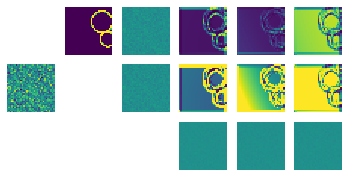

tensor(3.7813e-06, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<
tensor(3.7813e-06, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<
tensor(3.7813e-06, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<


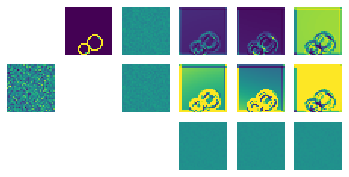

loss 250 tensor(19.8552, device='cuda:1', grad_fn=<MseLossBackward0>) 1.4999999999999999e-05
tensor(3.2873e-06, device='cuda:1') tensor(0.0306, device='cuda:1') >>><<
tensor(3.2873e-06, device='cuda:1') tensor(0.0306, device='cuda:1') >>><<
tensor(3.2873e-06, device='cuda:1') tensor(0.0306, device='cuda:1') >>><<


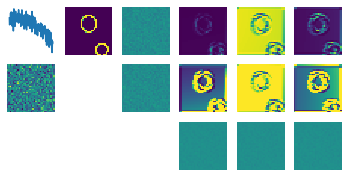

tensor(4.5632e-08, device='cuda:1') tensor(0.0329, device='cuda:1') >>><<
tensor(4.5632e-08, device='cuda:1') tensor(0.0329, device='cuda:1') >>><<
tensor(4.5632e-08, device='cuda:1') tensor(0.0329, device='cuda:1') >>><<


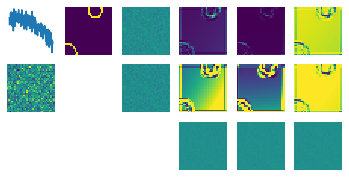

loss 500 tensor(4.3970, device='cuda:1', grad_fn=<MseLossBackward0>) 2.9999999999999997e-05
tensor(6.1369e-06, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(6.1369e-06, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(6.1369e-06, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<


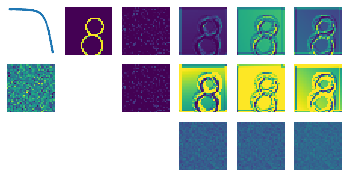

tensor(5.6389e-05, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<
tensor(5.6389e-05, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<
tensor(5.6389e-05, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<


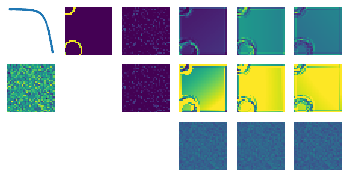

loss 750 tensor(3.8922, device='cuda:1', grad_fn=<MseLossBackward0>) 4.4999999999999996e-05
tensor(6.4531e-06, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<
tensor(6.4531e-06, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<
tensor(6.4531e-06, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<


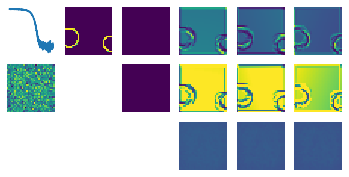

tensor(1.4151e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(1.4151e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(1.4151e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<


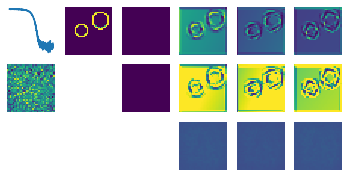

loss 1000 tensor(3.1323, device='cuda:1', grad_fn=<MseLossBackward0>) 5.9999999999999995e-05
tensor(2.8408e-05, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(2.8408e-05, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(2.8408e-05, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<


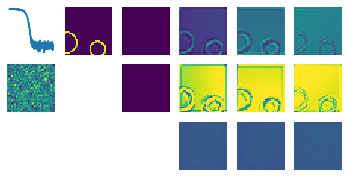

tensor(1.0124e-05, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0124e-05, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0124e-05, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<


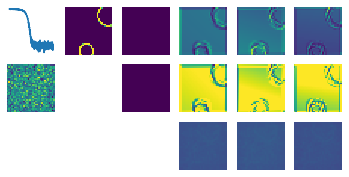

loss 1250 tensor(3.3745, device='cuda:1', grad_fn=<MseLossBackward0>) 7.5e-05
tensor(2.3051e-05, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<
tensor(2.3051e-05, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<
tensor(2.3051e-05, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<


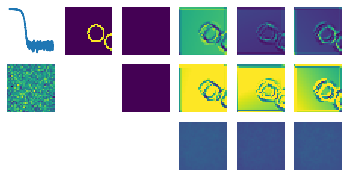

tensor(2.2744e-05, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(2.2744e-05, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(2.2744e-05, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<


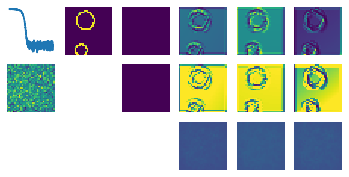

loss 1500 tensor(3.0875, device='cuda:1', grad_fn=<MseLossBackward0>) 8.999999999999999e-05
tensor(1.3087e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(1.3087e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(1.3087e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<


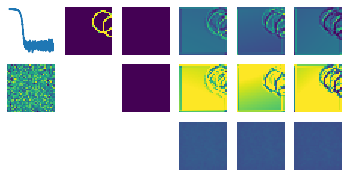

tensor(6.5606e-07, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<
tensor(6.5606e-07, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<
tensor(6.5606e-07, device='cuda:1') tensor(0.0042, device='cuda:1') >>><<


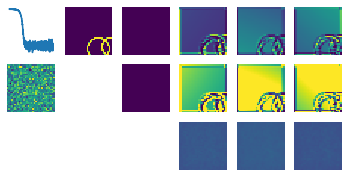

loss 1750 tensor(3.9932, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00010499999999999999
tensor(4.3093e-05, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(4.3093e-05, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(4.3093e-05, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


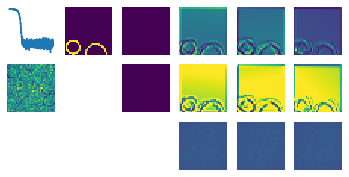

tensor(1.2624e-05, device='cuda:1') tensor(0.0054, device='cuda:1') >>><<
tensor(1.2624e-05, device='cuda:1') tensor(0.0054, device='cuda:1') >>><<
tensor(1.2624e-05, device='cuda:1') tensor(0.0054, device='cuda:1') >>><<


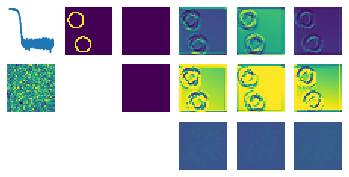

loss 2000 tensor(3.9090, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00011999999999999999
tensor(2.4685e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(2.4685e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(2.4685e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<


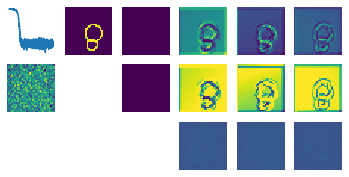

tensor(8.7914e-05, device='cuda:1') tensor(0.0051, device='cuda:1') >>><<
tensor(8.7914e-05, device='cuda:1') tensor(0.0051, device='cuda:1') >>><<
tensor(8.7914e-05, device='cuda:1') tensor(0.0051, device='cuda:1') >>><<


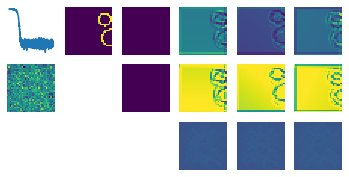

loss 2250 tensor(3.5818, device='cuda:1', grad_fn=<MseLossBackward0>) 0.000135
tensor(0.0001, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<


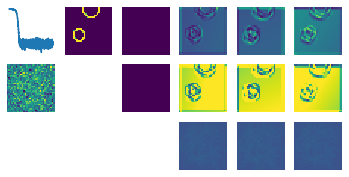

tensor(2.3283e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(2.3283e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(2.3283e-05, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<


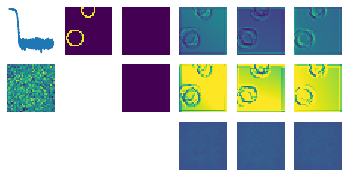

loss 2500 tensor(3.8257, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00015
tensor(3.0888e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(3.0888e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(3.0888e-05, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<


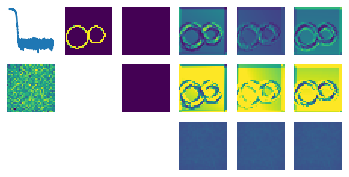

tensor(4.7271e-05, device='cuda:1') tensor(0.0034, device='cuda:1') >>><<
tensor(4.7271e-05, device='cuda:1') tensor(0.0034, device='cuda:1') >>><<
tensor(4.7271e-05, device='cuda:1') tensor(0.0034, device='cuda:1') >>><<


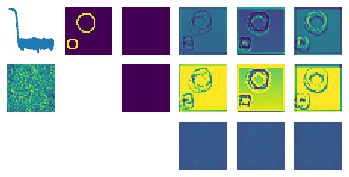

loss 2750 tensor(3.3798, device='cuda:1', grad_fn=<MseLossBackward0>) 0.000165
tensor(5.4162e-06, device='cuda:1') tensor(0.0070, device='cuda:1') >>><<
tensor(5.4162e-06, device='cuda:1') tensor(0.0070, device='cuda:1') >>><<
tensor(5.4162e-06, device='cuda:1') tensor(0.0070, device='cuda:1') >>><<


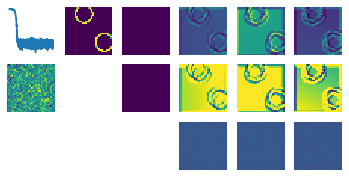

tensor(6.4733e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(6.4733e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(6.4733e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


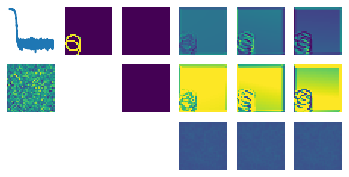

loss 3000 tensor(3.2933, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00017999999999999998
tensor(8.1011e-06, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(8.1011e-06, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(8.1011e-06, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<


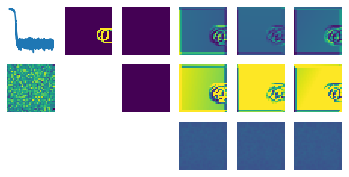

tensor(5.2430e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(5.2430e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(5.2430e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


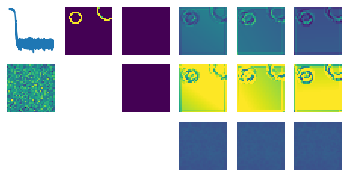

loss 3250 tensor(3.7973, device='cuda:1', grad_fn=<MseLossBackward0>) 0.000195
tensor(9.6311e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(9.6311e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(9.6311e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


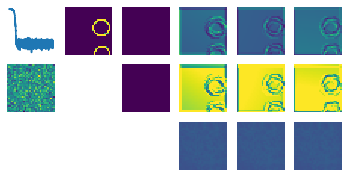

tensor(1.5610e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(1.5610e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(1.5610e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<


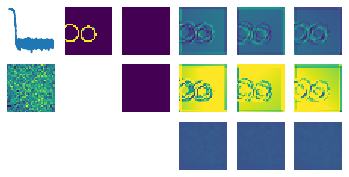

loss 3500 tensor(2.7028, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00020999999999999998
tensor(3.7885e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(3.7885e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(3.7885e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


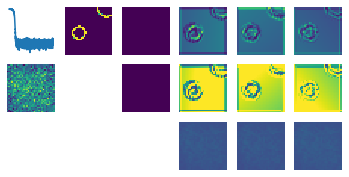

tensor(1.0583e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(1.0583e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(1.0583e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


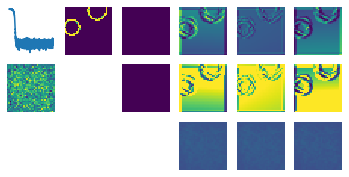

loss 3750 tensor(3.2156, device='cuda:1', grad_fn=<MseLossBackward0>) 0.000225
tensor(1.0050e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(1.0050e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(1.0050e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


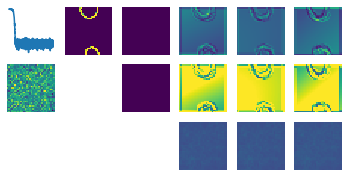

tensor(1.5253e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(1.5253e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(1.5253e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


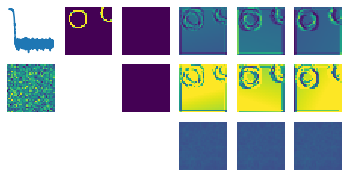

loss 4000 tensor(4.1803, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00023999999999999998
tensor(3.4700e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.4700e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.4700e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


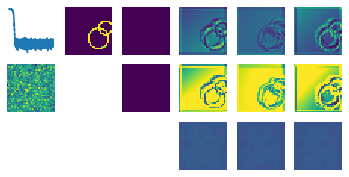

tensor(1.3463e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<
tensor(1.3463e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<
tensor(1.3463e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<


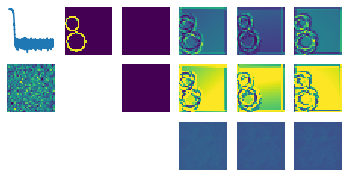

loss 4250 tensor(3.2661, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00025499999999999996
tensor(3.3993e-06, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.3993e-06, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.3993e-06, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


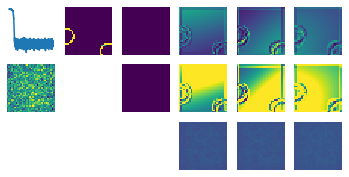

tensor(3.7222e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(3.7222e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(3.7222e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


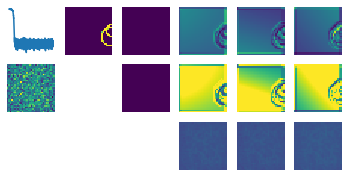

loss 4500 tensor(3.0500, device='cuda:1', grad_fn=<MseLossBackward0>) 0.00027
tensor(2.1858e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(2.1858e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(2.1858e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<


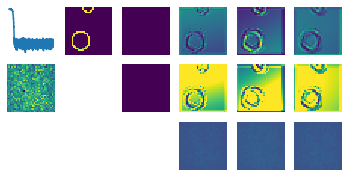

tensor(2.4524e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.4524e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.4524e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


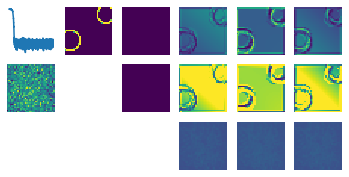

loss 4750 tensor(3.2647, device='cuda:1', grad_fn=<MseLossBackward0>) 0.000285
tensor(2.9357e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(2.9357e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(2.9357e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


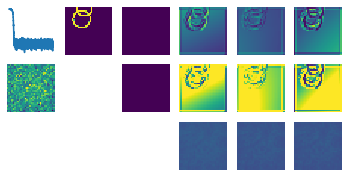

tensor(2.4454e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(2.4454e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(2.4454e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


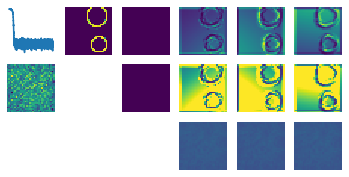

loss 5000 tensor(3.1224, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.2572e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(2.2572e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(2.2572e-05, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


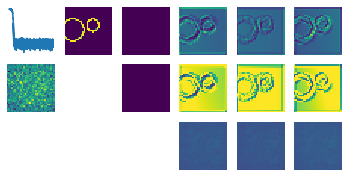

tensor(4.3125e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(4.3125e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(4.3125e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


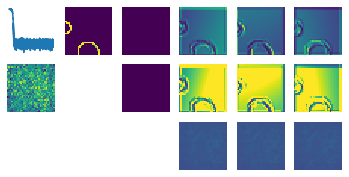

loss 5250 tensor(3.9266, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(4.5182e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(4.5182e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(4.5182e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


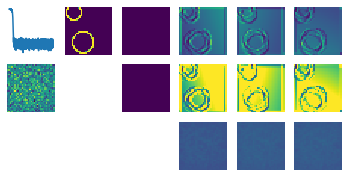

tensor(5.8846e-06, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.8846e-06, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.8846e-06, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


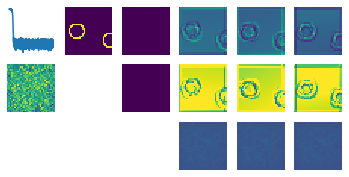

loss 5500 tensor(3.4804, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


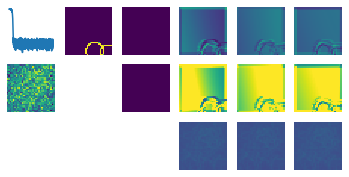

tensor(2.5296e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.5296e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.5296e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


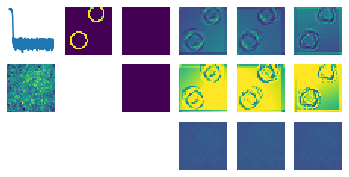

loss 5750 tensor(3.4064, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.8147e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.8147e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(2.8147e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


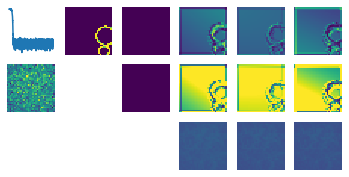

tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<


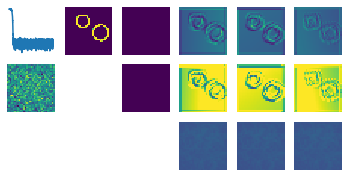

loss 6000 tensor(3.2359, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(3.9244e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.9244e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.9244e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


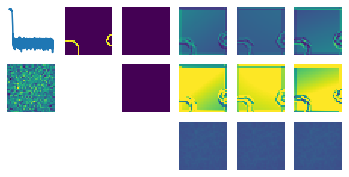

tensor(6.0387e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(6.0387e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(6.0387e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


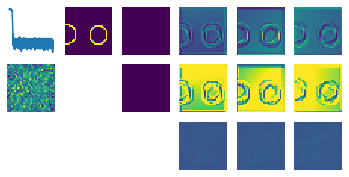

loss 6250 tensor(3.1533, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(8.7440e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(8.7440e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(8.7440e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


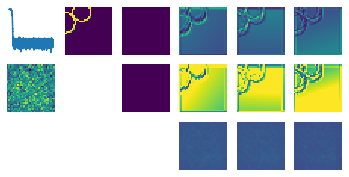

tensor(3.0425e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.0425e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(3.0425e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


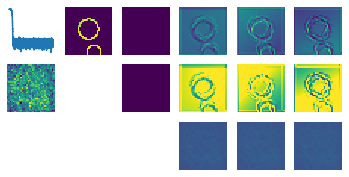

loss 6500 tensor(2.8100, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<


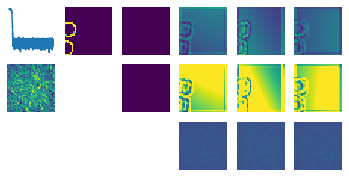

tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


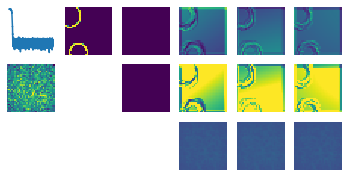

loss 6750 tensor(3.4617, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(5.6487e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.6487e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.6487e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


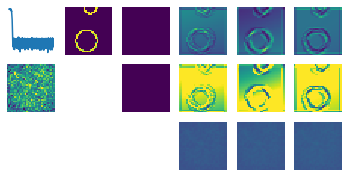

tensor(9.4083e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(9.4083e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(9.4083e-05, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


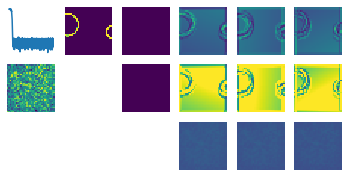

loss 7000 tensor(3.5712, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


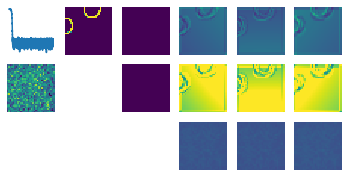

tensor(0.0001, device='cuda:1') tensor(0.0023, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0023, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0023, device='cuda:1') >>><<


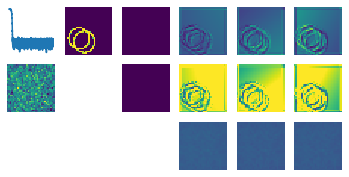

loss 7250 tensor(4.0179, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


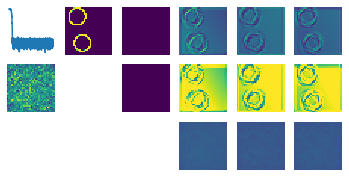

tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


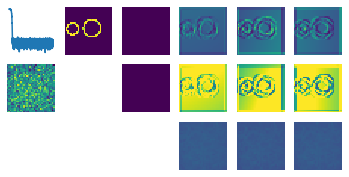

loss 7500 tensor(3.6649, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


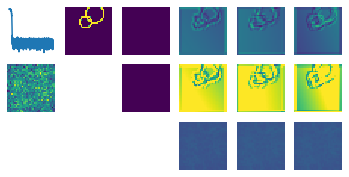

tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<


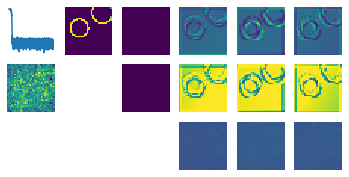

loss 7750 tensor(2.7690, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<


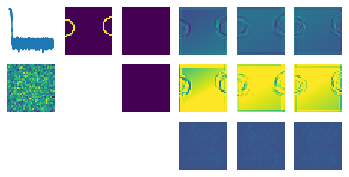

tensor(0.0002, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0027, device='cuda:1') >>><<


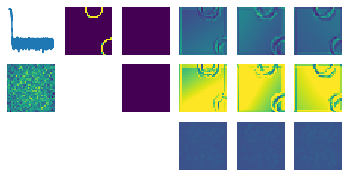

loss 8000 tensor(3.1910, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<


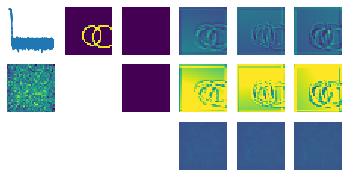

tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<


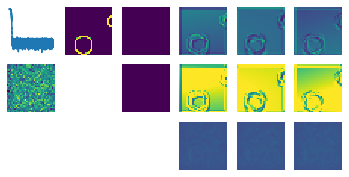

loss 8250 tensor(3.6767, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(0.0002, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<


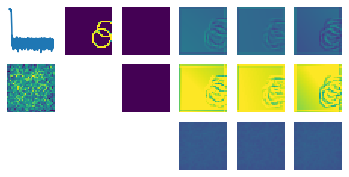

tensor(0.0001, device='cuda:1') tensor(0.0035, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0035, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0035, device='cuda:1') >>><<


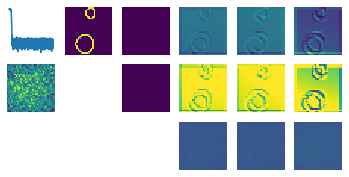

loss 8500 tensor(4.0586, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0024, device='cuda:1') >>><<


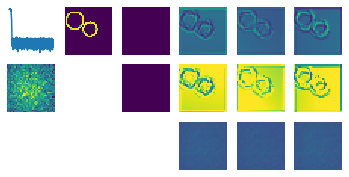

tensor(0.0001, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<
tensor(0.0001, device='cuda:1') tensor(0.0022, device='cuda:1') >>><<


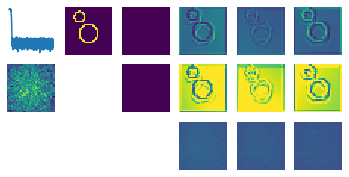

loss 8750 tensor(2.5139, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(0.0003, device='cuda:1') tensor(0.0021, device='cuda:1') >>><<
tensor(0.0003, device='cuda:1') tensor(0.0021, device='cuda:1') >>><<
tensor(0.0003, device='cuda:1') tensor(0.0021, device='cuda:1') >>><<


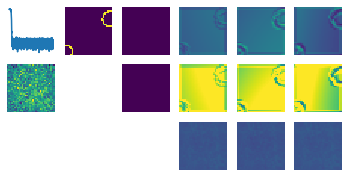

tensor(0.0003, device='cuda:1') tensor(0.0018, device='cuda:1') >>><<
tensor(0.0003, device='cuda:1') tensor(0.0018, device='cuda:1') >>><<
tensor(0.0003, device='cuda:1') tensor(0.0018, device='cuda:1') >>><<


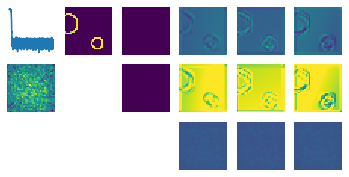

loss 9000 tensor(3.5939, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(8.3148e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<
tensor(8.3148e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<
tensor(8.3148e-05, device='cuda:1') tensor(0.0032, device='cuda:1') >>><<


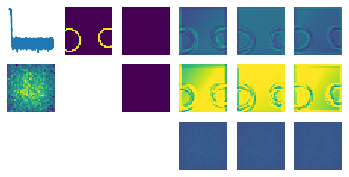

tensor(6.6069e-05, device='cuda:1') tensor(0.0031, device='cuda:1') >>><<
tensor(6.6069e-05, device='cuda:1') tensor(0.0031, device='cuda:1') >>><<
tensor(6.6069e-05, device='cuda:1') tensor(0.0031, device='cuda:1') >>><<


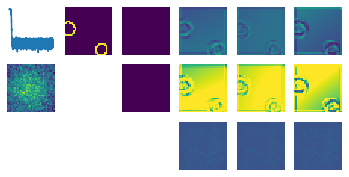

loss 9250 tensor(3.2042, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(4.3055e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(4.3055e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<
tensor(4.3055e-05, device='cuda:1') tensor(0.0026, device='cuda:1') >>><<


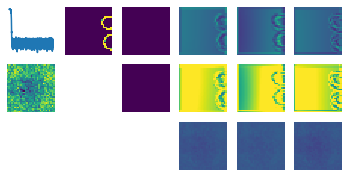

tensor(6.6166e-05, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(6.6166e-05, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<
tensor(6.6166e-05, device='cuda:1') tensor(0.0025, device='cuda:1') >>><<


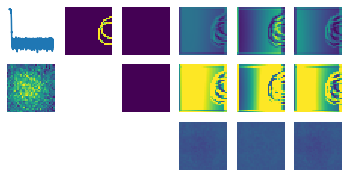

loss 9500 tensor(3.3979, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(5.8014e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.8014e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<
tensor(5.8014e-05, device='cuda:1') tensor(0.0028, device='cuda:1') >>><<


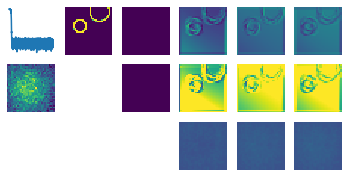

tensor(3.2244e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(3.2244e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<
tensor(3.2244e-05, device='cuda:1') tensor(0.0036, device='cuda:1') >>><<


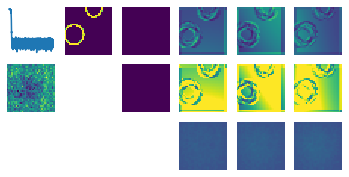

loss 9750 tensor(3.6425, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.7408e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(1.7408e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<
tensor(1.7408e-05, device='cuda:1') tensor(0.0029, device='cuda:1') >>><<


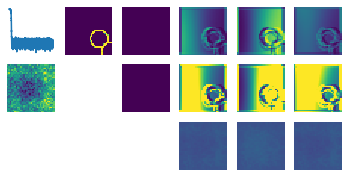

tensor(8.9955e-06, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(8.9955e-06, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<
tensor(8.9955e-06, device='cuda:1') tensor(0.0030, device='cuda:1') >>><<


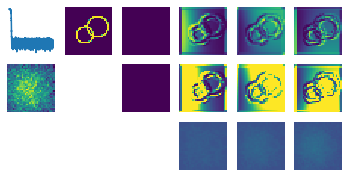

loss 10000 tensor(2.4966, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(3.2770e-05, device='cuda:1') tensor(0.0038, device='cuda:1') >>><<
tensor(3.2770e-05, device='cuda:1') tensor(0.0038, device='cuda:1') >>><<
tensor(3.2770e-05, device='cuda:1') tensor(0.0038, device='cuda:1') >>><<


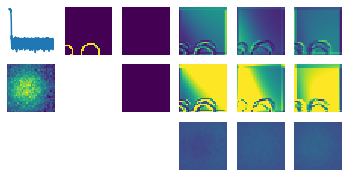

tensor(2.5422e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(2.5422e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<
tensor(2.5422e-05, device='cuda:1') tensor(0.0033, device='cuda:1') >>><<


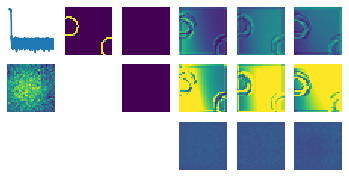

loss 10250 tensor(3.3859, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.3221e-07, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<
tensor(2.3221e-07, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<
tensor(2.3221e-07, device='cuda:1') tensor(0.0059, device='cuda:1') >>><<


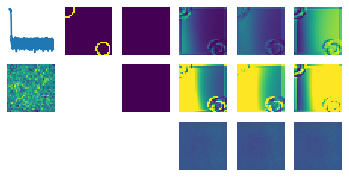

tensor(6.3844e-07, device='cuda:1') tensor(0.0052, device='cuda:1') >>><<
tensor(6.3844e-07, device='cuda:1') tensor(0.0052, device='cuda:1') >>><<
tensor(6.3844e-07, device='cuda:1') tensor(0.0052, device='cuda:1') >>><<


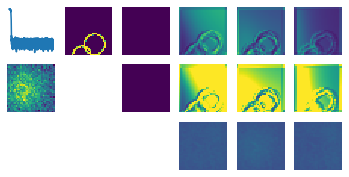

loss 10500 tensor(3.5661, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(3.3803e-07, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(3.3803e-07, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(3.3803e-07, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<


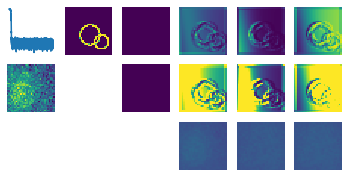

tensor(3.3862e-07, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<
tensor(3.3862e-07, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<
tensor(3.3862e-07, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<


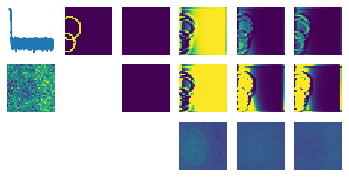

loss 10750 tensor(3.3833, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.3342e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<
tensor(2.3342e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<
tensor(2.3342e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<


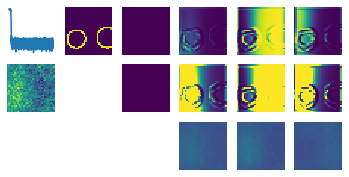

tensor(4.0620e-08, device='cuda:1') tensor(0.0048, device='cuda:1') >>><<
tensor(4.0620e-08, device='cuda:1') tensor(0.0048, device='cuda:1') >>><<
tensor(4.0620e-08, device='cuda:1') tensor(0.0048, device='cuda:1') >>><<


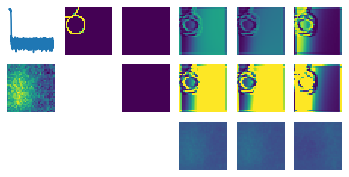

loss 11000 tensor(3.3292, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.9952e-07, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(2.9952e-07, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(2.9952e-07, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<


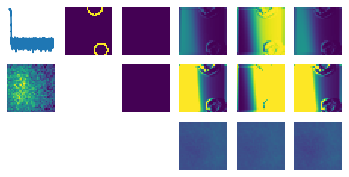

tensor(1.4273e-07, device='cuda:1') tensor(0.0058, device='cuda:1') >>><<
tensor(1.4273e-07, device='cuda:1') tensor(0.0058, device='cuda:1') >>><<
tensor(1.4273e-07, device='cuda:1') tensor(0.0058, device='cuda:1') >>><<


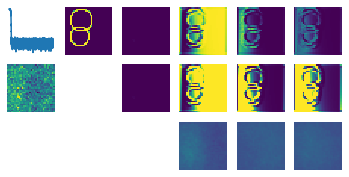

loss 11250 tensor(3.5429, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.1411e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(2.1411e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(2.1411e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<


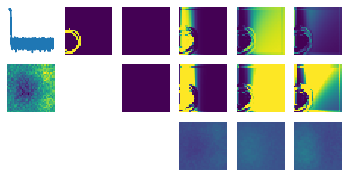

tensor(1.0276e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0276e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0276e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


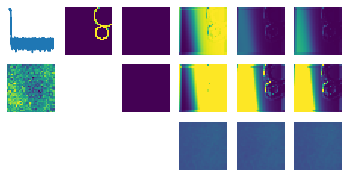

loss 11500 tensor(4.0135, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.5074e-08, device='cuda:1') tensor(0.0068, device='cuda:1') >>><<
tensor(1.5074e-08, device='cuda:1') tensor(0.0068, device='cuda:1') >>><<
tensor(1.5074e-08, device='cuda:1') tensor(0.0068, device='cuda:1') >>><<


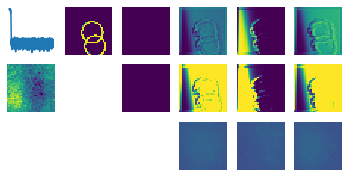

tensor(1.0009e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0009e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0009e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


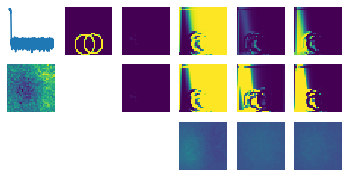

loss 11750 tensor(3.3664, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(2.6015e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(2.6015e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(2.6015e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<


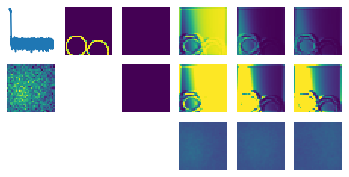

tensor(1.0362e-08, device='cuda:1') tensor(0.0076, device='cuda:1') >>><<
tensor(1.0362e-08, device='cuda:1') tensor(0.0076, device='cuda:1') >>><<
tensor(1.0362e-08, device='cuda:1') tensor(0.0076, device='cuda:1') >>><<


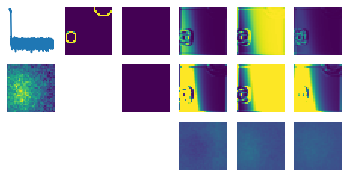

loss 12000 tensor(3.3443, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.4631e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.4631e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.4631e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<


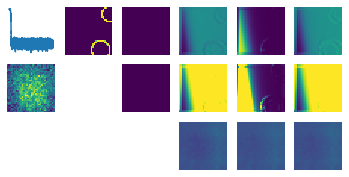

tensor(4.6766e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<
tensor(4.6766e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<
tensor(4.6766e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<


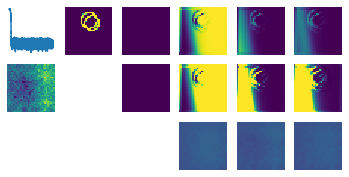

loss 12250 tensor(3.3282, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(8.1419e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<
tensor(8.1419e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<
tensor(8.1419e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<


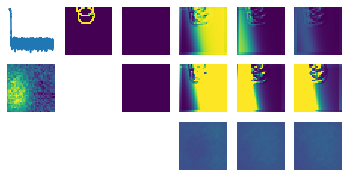

tensor(1.2716e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(1.2716e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(1.2716e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<


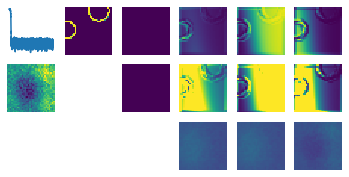

loss 12500 tensor(2.6823, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0009e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<
tensor(1.0009e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<
tensor(1.0009e-08, device='cuda:1') tensor(0.0078, device='cuda:1') >>><<


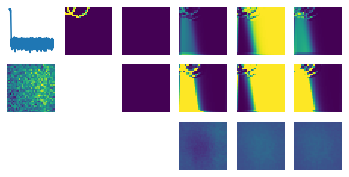

tensor(1.0339e-08, device='cuda:1') tensor(0.0064, device='cuda:1') >>><<
tensor(1.0339e-08, device='cuda:1') tensor(0.0064, device='cuda:1') >>><<
tensor(1.0339e-08, device='cuda:1') tensor(0.0064, device='cuda:1') >>><<


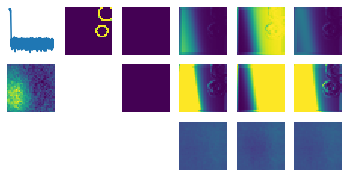

loss 12750 tensor(3.5150, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(6.8682e-07, device='cuda:1') tensor(0.0046, device='cuda:1') >>><<
tensor(6.8682e-07, device='cuda:1') tensor(0.0046, device='cuda:1') >>><<
tensor(6.8682e-07, device='cuda:1') tensor(0.0046, device='cuda:1') >>><<


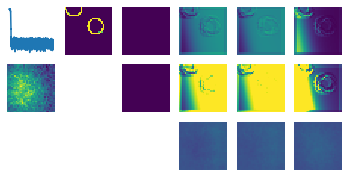

tensor(1.8700e-07, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.8700e-07, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.8700e-07, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<


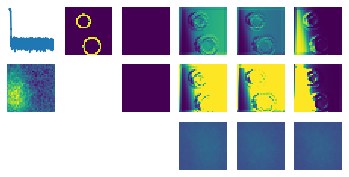

loss 13000 tensor(3.2160, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(5.6787e-08, device='cuda:1') tensor(0.0072, device='cuda:1') >>><<
tensor(5.6787e-08, device='cuda:1') tensor(0.0072, device='cuda:1') >>><<
tensor(5.6787e-08, device='cuda:1') tensor(0.0072, device='cuda:1') >>><<


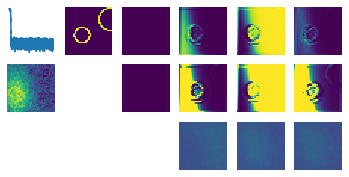

tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<


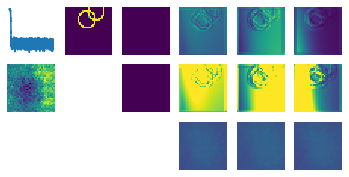

loss 13250 tensor(3.5684, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(4.7635e-07, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(4.7635e-07, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(4.7635e-07, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<


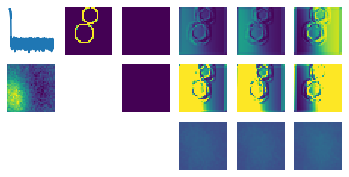

tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<


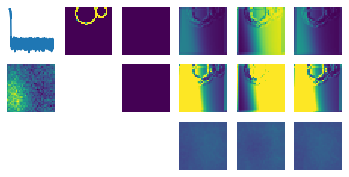

loss 13500 tensor(3.1620, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0015e-08, device='cuda:1') tensor(0.0069, device='cuda:1') >>><<
tensor(1.0015e-08, device='cuda:1') tensor(0.0069, device='cuda:1') >>><<
tensor(1.0015e-08, device='cuda:1') tensor(0.0069, device='cuda:1') >>><<


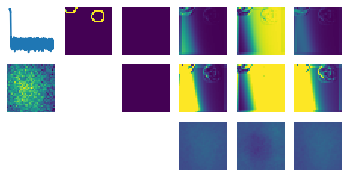

tensor(1.0341e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<
tensor(1.0341e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<
tensor(1.0341e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<


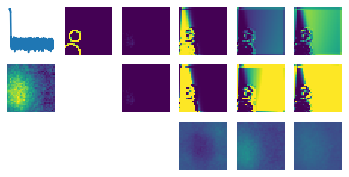

loss 13750 tensor(3.8352, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.3307e-08, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(1.3307e-08, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<
tensor(1.3307e-08, device='cuda:1') tensor(0.0053, device='cuda:1') >>><<


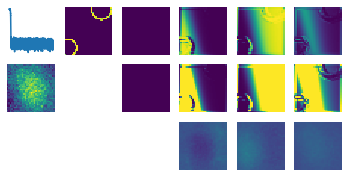

tensor(1.0693e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(1.0693e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(1.0693e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<


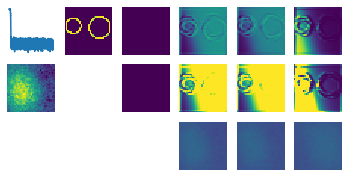

loss 14000 tensor(2.5963, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0005e-08, device='cuda:1') tensor(0.0106, device='cuda:1') >>><<
tensor(1.0005e-08, device='cuda:1') tensor(0.0106, device='cuda:1') >>><<
tensor(1.0005e-08, device='cuda:1') tensor(0.0106, device='cuda:1') >>><<


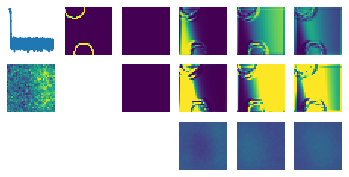

tensor(1.0002e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0002e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0002e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<


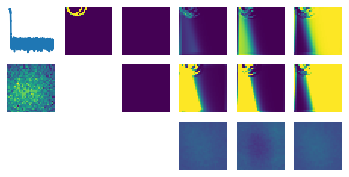

loss 14250 tensor(4.0586, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0091, device='cuda:1') >>><<


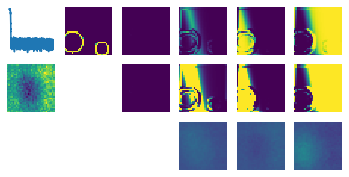

tensor(1.0039e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.0039e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.0039e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<


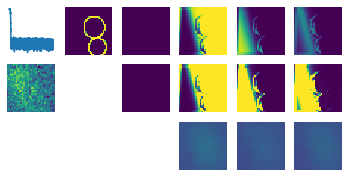

loss 14500 tensor(3.7662, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0151e-08, device='cuda:1') tensor(0.0099, device='cuda:1') >>><<
tensor(1.0151e-08, device='cuda:1') tensor(0.0099, device='cuda:1') >>><<
tensor(1.0151e-08, device='cuda:1') tensor(0.0099, device='cuda:1') >>><<


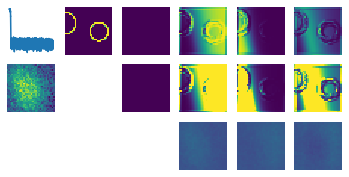

tensor(1.0045e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<
tensor(1.0045e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<
tensor(1.0045e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<


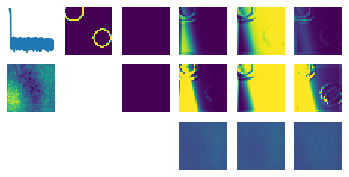

loss 14750 tensor(3.4222, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0056, device='cuda:1') >>><<


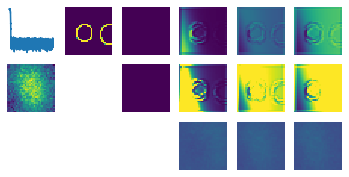

tensor(1.0000e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0077, device='cuda:1') >>><<


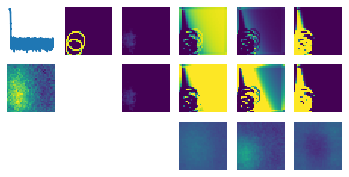

loss 15000 tensor(3.4328, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0003e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(1.0003e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<
tensor(1.0003e-08, device='cuda:1') tensor(0.0063, device='cuda:1') >>><<


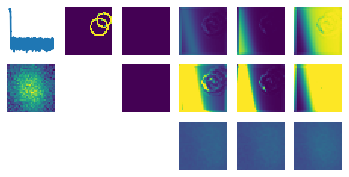

tensor(1.0001e-08, device='cuda:1') tensor(0.0079, device='cuda:1') >>><<
tensor(1.0001e-08, device='cuda:1') tensor(0.0079, device='cuda:1') >>><<
tensor(1.0001e-08, device='cuda:1') tensor(0.0079, device='cuda:1') >>><<


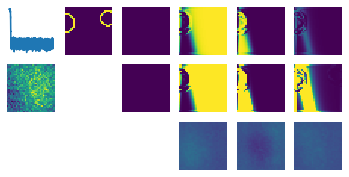

loss 15250 tensor(3.1731, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


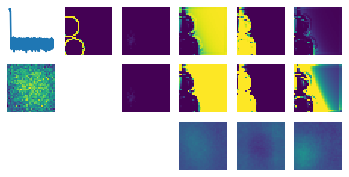

tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<


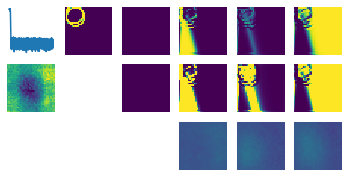

loss 15500 tensor(2.9921, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<


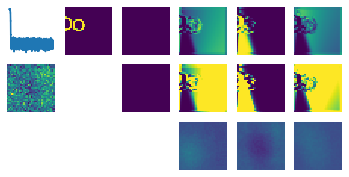

tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<


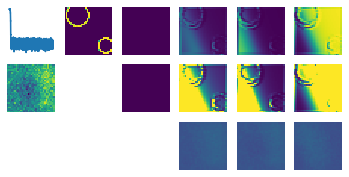

loss 15750 tensor(3.8631, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(3.1738e-06, device='cuda:1') tensor(0.0039, device='cuda:1') >>><<
tensor(3.1738e-06, device='cuda:1') tensor(0.0039, device='cuda:1') >>><<
tensor(3.1738e-06, device='cuda:1') tensor(0.0039, device='cuda:1') >>><<


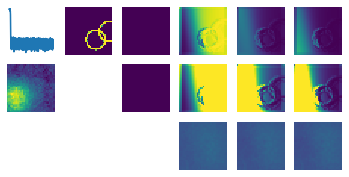

tensor(3.2889e-06, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(3.2889e-06, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<
tensor(3.2889e-06, device='cuda:1') tensor(0.0045, device='cuda:1') >>><<


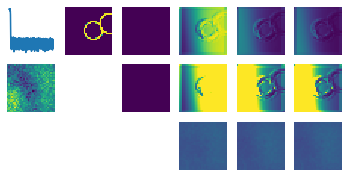

loss 16000 tensor(3.2400, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<


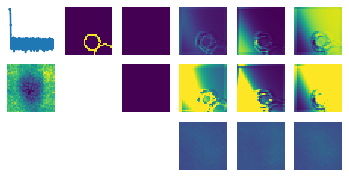

tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<


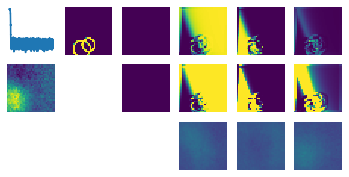

loss 16250 tensor(3.0179, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


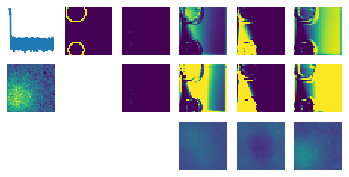

tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<


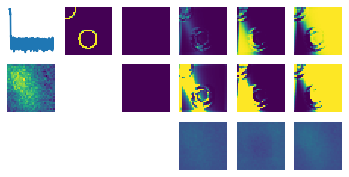

loss 16500 tensor(3.1507, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<


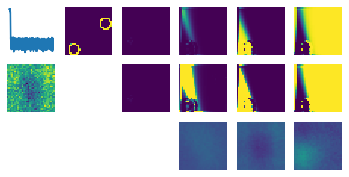

tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


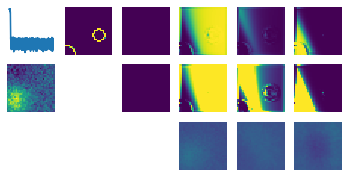

loss 16750 tensor(3.2713, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<


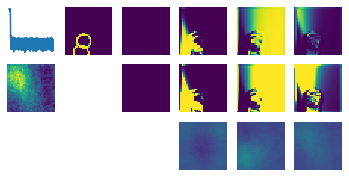

tensor(1.0000e-08, device='cuda:1') tensor(0.0126, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0126, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0126, device='cuda:1') >>><<


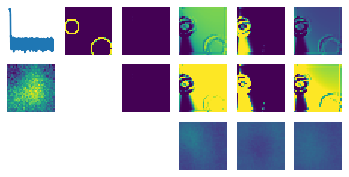

loss 17000 tensor(3.0503, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<


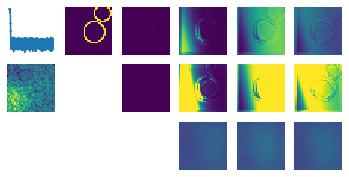

tensor(1.0000e-08, device='cuda:1') tensor(0.0057, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0057, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0057, device='cuda:1') >>><<


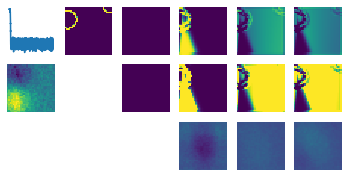

loss 17250 tensor(2.9134, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<


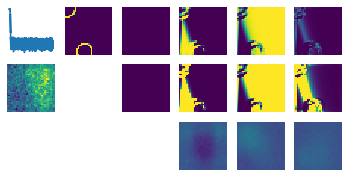

tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<


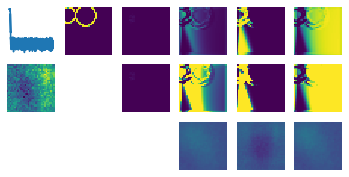

loss 17500 tensor(2.7709, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0090, device='cuda:1') >>><<


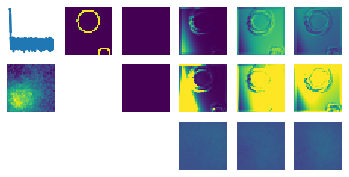

tensor(1.0000e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0085, device='cuda:1') >>><<


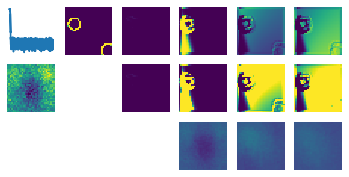

loss 17750 tensor(3.0458, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<


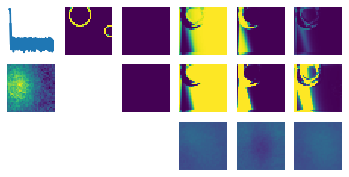

tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<


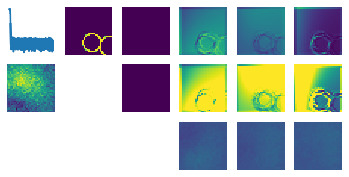

loss 18000 tensor(2.9615, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<


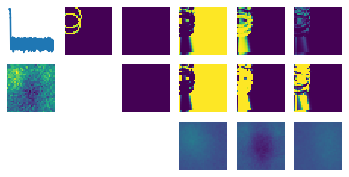

tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<


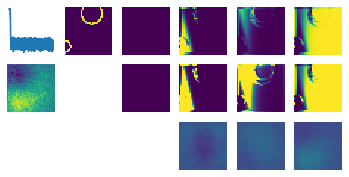

loss 18250 tensor(2.8260, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<


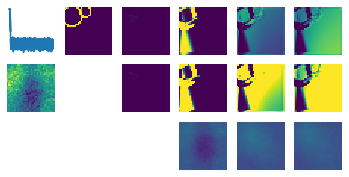

tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<


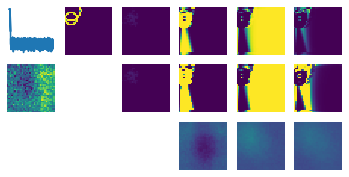

loss 18500 tensor(2.9112, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<


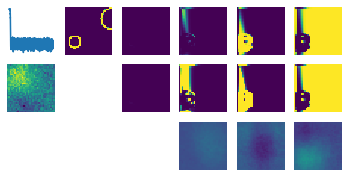

tensor(1.0000e-08, device='cuda:1') tensor(0.0286, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0286, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0286, device='cuda:1') >>><<


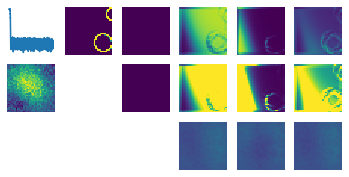

loss 18750 tensor(3.6611, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


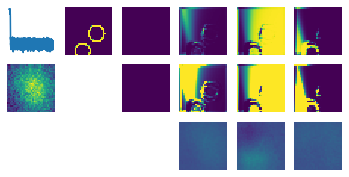

tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<


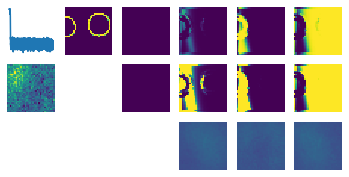

loss 19000 tensor(3.3423, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0087, device='cuda:1') >>><<


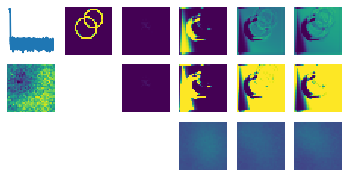

tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<


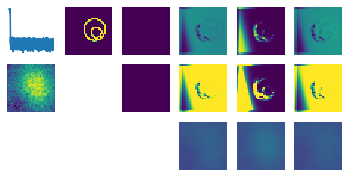

loss 19250 tensor(2.9757, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<


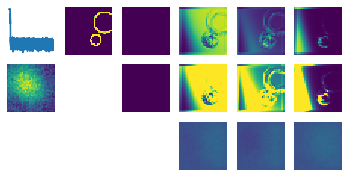

tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<


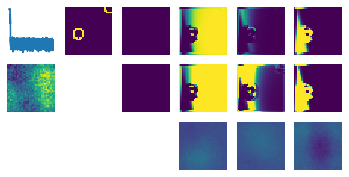

loss 19500 tensor(2.8546, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<


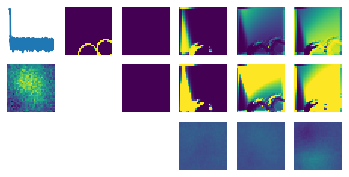

tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<


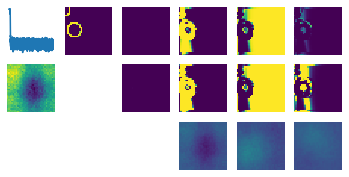

loss 19750 tensor(3.1668, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<


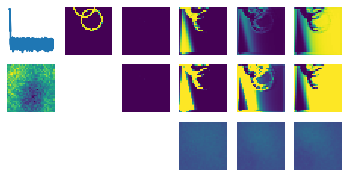

tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<


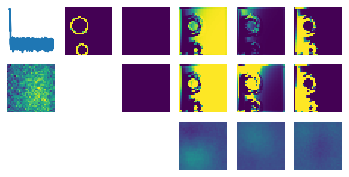

loss 20000 tensor(3.5176, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<


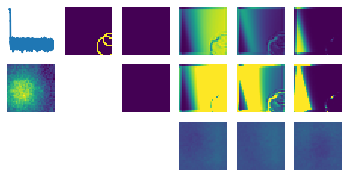

tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<


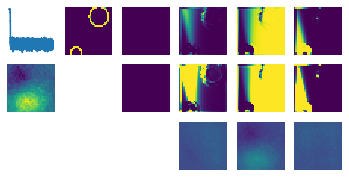

loss 20250 tensor(2.9991, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<


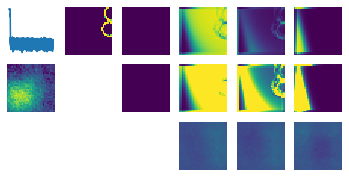

tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


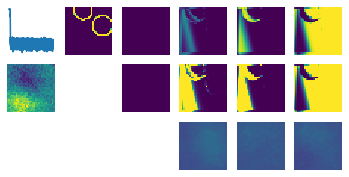

loss 20500 tensor(2.8358, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<


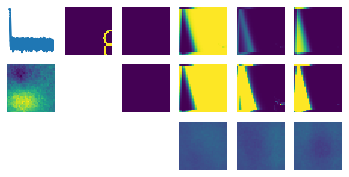

tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<


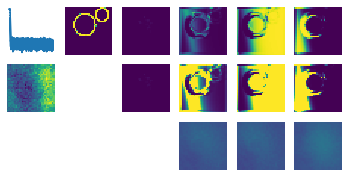

loss 20750 tensor(2.8891, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<


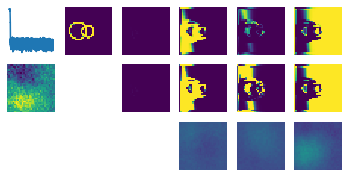

tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<


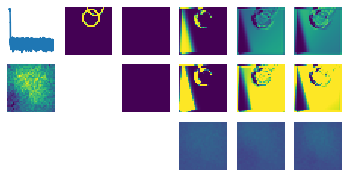

loss 21000 tensor(3.0532, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<


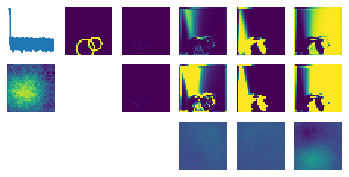

tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


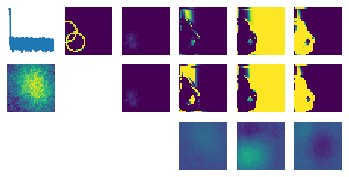

loss 21250 tensor(3.1771, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<


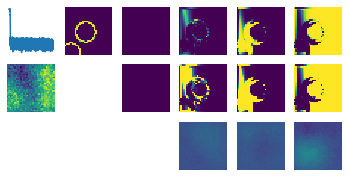

tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<


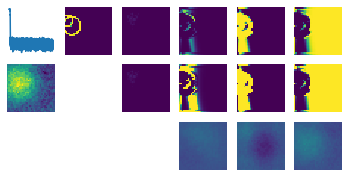

loss 21500 tensor(2.9917, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0170, device='cuda:1') >>><<


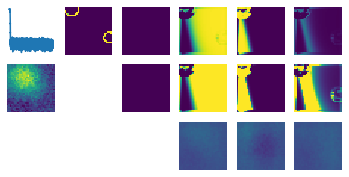

tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<


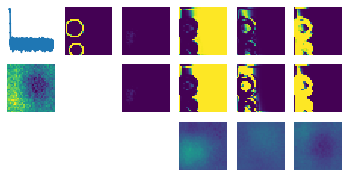

loss 21750 tensor(3.7506, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0096, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0096, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0096, device='cuda:1') >>><<


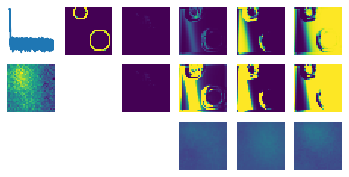

tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<


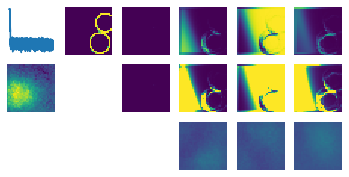

loss 22000 tensor(2.8327, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0081, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0081, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0081, device='cuda:1') >>><<


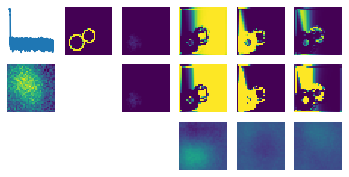

tensor(1.0000e-08, device='cuda:1') tensor(0.0083, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0083, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0083, device='cuda:1') >>><<


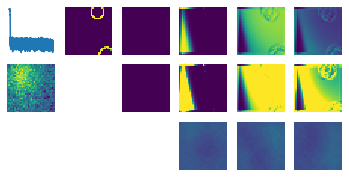

loss 22250 tensor(2.8897, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<


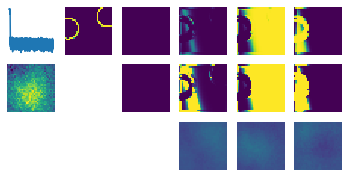

tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<


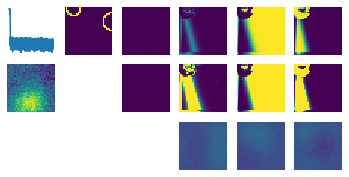

loss 22500 tensor(3.2045, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<


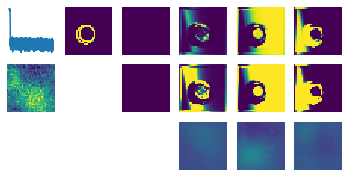

tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0110, device='cuda:1') >>><<


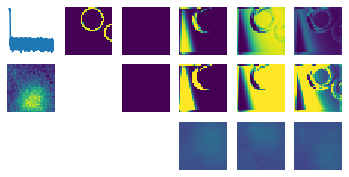

loss 22750 tensor(2.8733, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


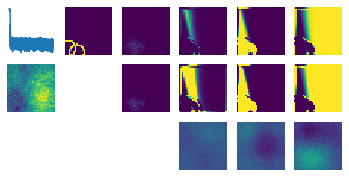

tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<


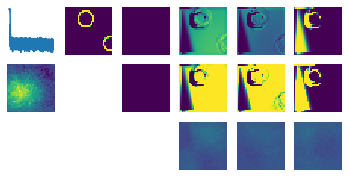

loss 23000 tensor(3.5015, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<


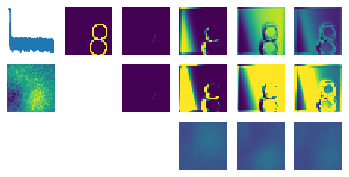

tensor(1.0000e-08, device='cuda:1') tensor(0.0116, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0116, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0116, device='cuda:1') >>><<


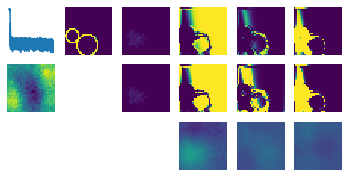

loss 23250 tensor(2.7231, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


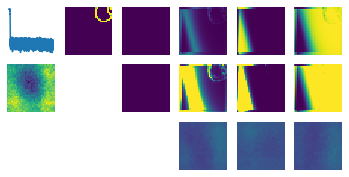

tensor(1.0000e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0066, device='cuda:1') >>><<


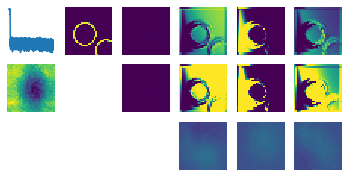

loss 23500 tensor(2.7855, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0097, device='cuda:1') >>><<


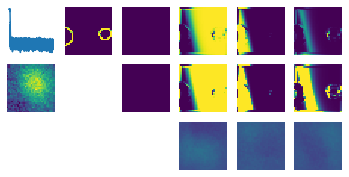

tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<


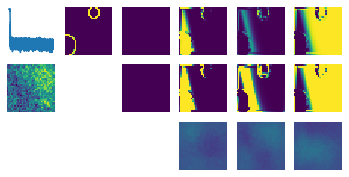

loss 23750 tensor(2.8790, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0102, device='cuda:1') >>><<


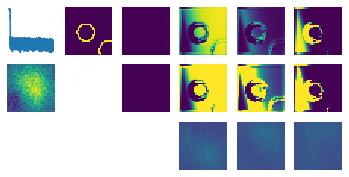

tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<


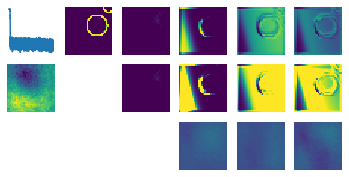

loss 24000 tensor(2.4827, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0095, device='cuda:1') >>><<


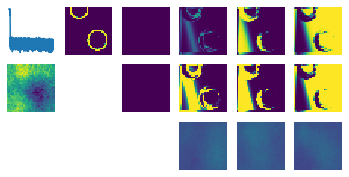

tensor(1.0000e-08, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0088, device='cuda:1') >>><<


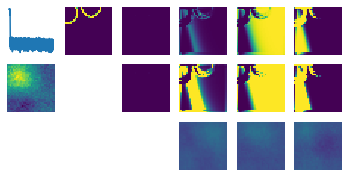

loss 24250 tensor(2.4572, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0094, device='cuda:1') >>><<


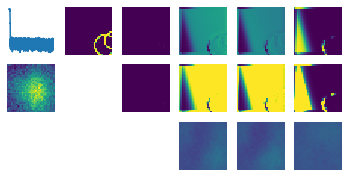

tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0109, device='cuda:1') >>><<


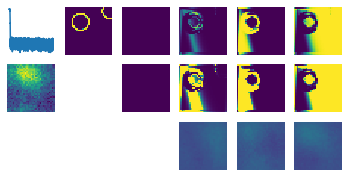

loss 24500 tensor(2.9882, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<


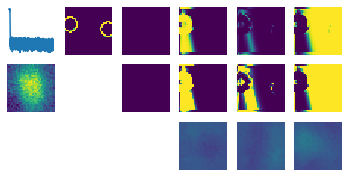

tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<


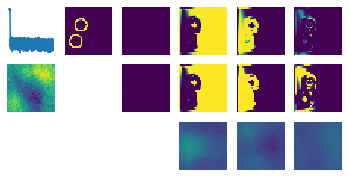

loss 24750 tensor(3.4575, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0113, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0113, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0113, device='cuda:1') >>><<


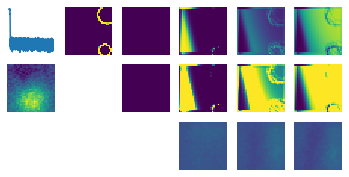

tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<


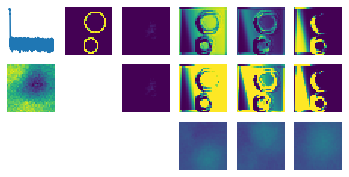

loss 25000 tensor(3.9194, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


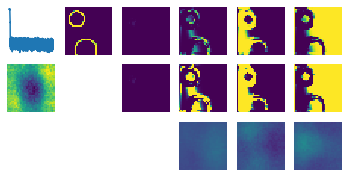

tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<


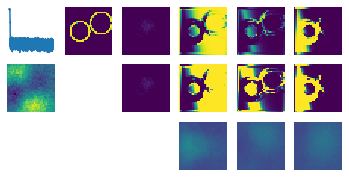

loss 25250 tensor(3.2028, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<


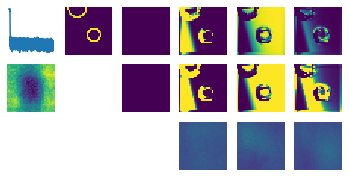

tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0092, device='cuda:1') >>><<


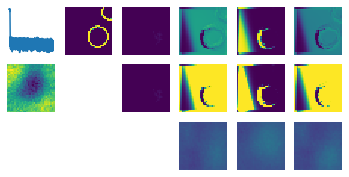

loss 25500 tensor(2.8620, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<


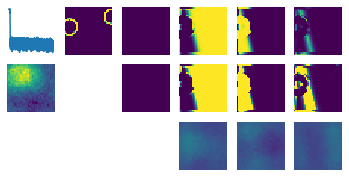

tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<


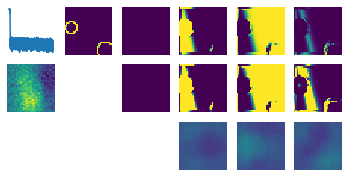

loss 25750 tensor(3.5289, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0062, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0062, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0062, device='cuda:1') >>><<


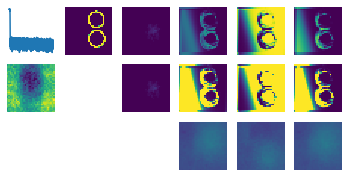

tensor(1.0000e-08, device='cuda:1') tensor(0.0086, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0086, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0086, device='cuda:1') >>><<


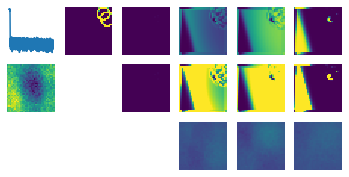

loss 26000 tensor(3.2584, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<


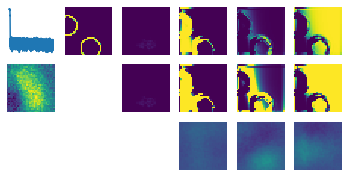

tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0104, device='cuda:1') >>><<


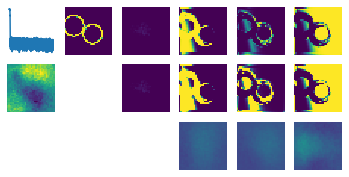

loss 26250 tensor(3.6896, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<


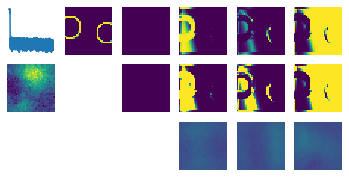

tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<


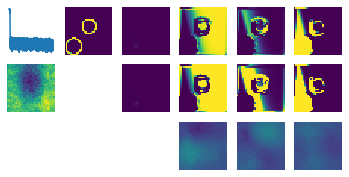

loss 26500 tensor(3.5352, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0074, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0074, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0074, device='cuda:1') >>><<


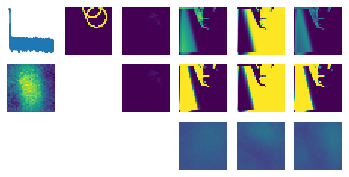

tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0073, device='cuda:1') >>><<


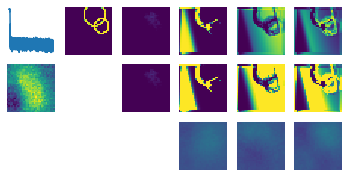

loss 26750 tensor(3.1365, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0112, device='cuda:1') >>><<


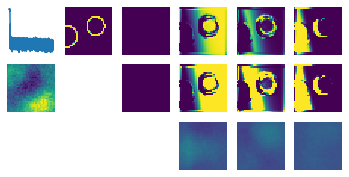

tensor(1.0000e-08, device='cuda:1') tensor(0.0080, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0080, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0080, device='cuda:1') >>><<


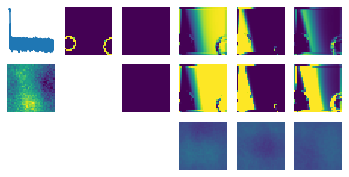

loss 27000 tensor(3.2845, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<


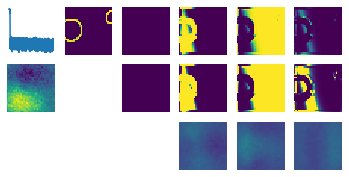

tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<


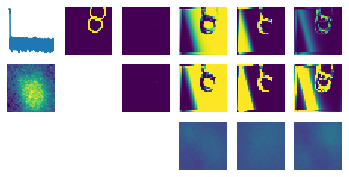

loss 27250 tensor(3.0266, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<


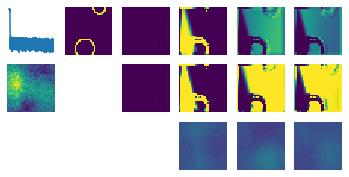

tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0075, device='cuda:1') >>><<


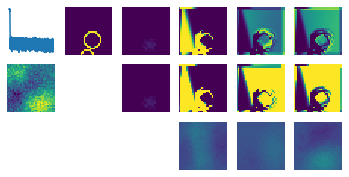

loss 27500 tensor(3.0498, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


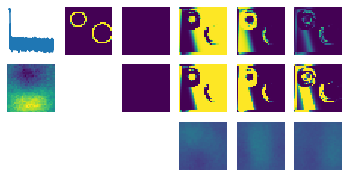

tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<


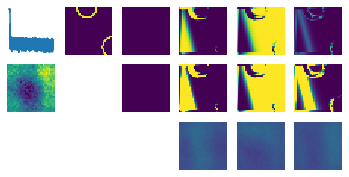

loss 27750 tensor(3.2675, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<


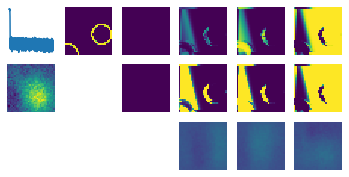

tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<


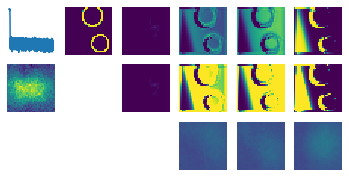

loss 28000 tensor(3.5297, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


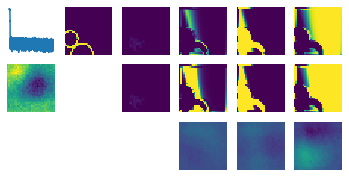

tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<


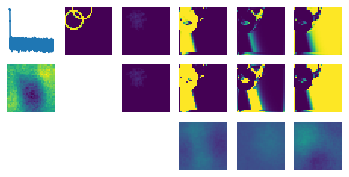

loss 28250 tensor(3.5987, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<


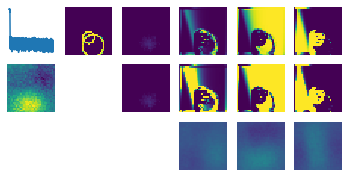

tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<


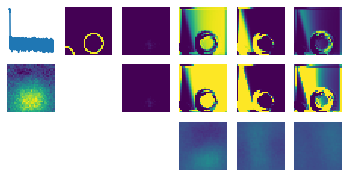

loss 28500 tensor(2.9749, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<


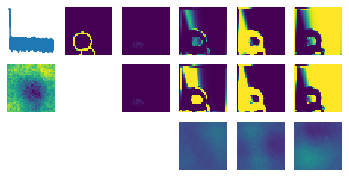

tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<


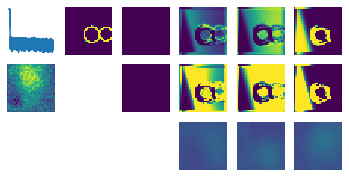

loss 28750 tensor(3.3238, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0060, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0060, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0060, device='cuda:1') >>><<


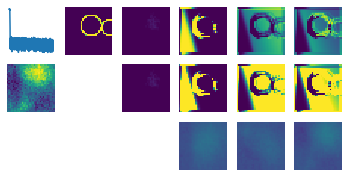

tensor(1.0000e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0050, device='cuda:1') >>><<


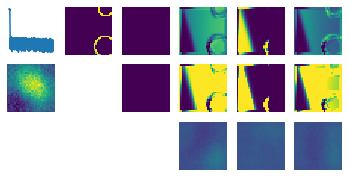

loss 29000 tensor(2.8198, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<


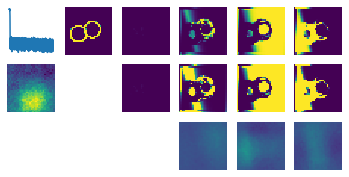

tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<


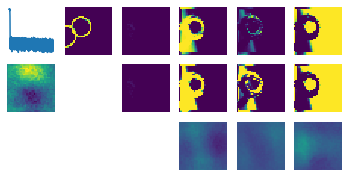

loss 29250 tensor(3.1956, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<


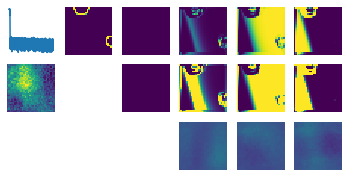

tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<


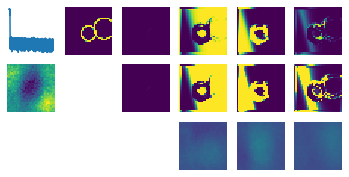

loss 29500 tensor(2.9324, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<


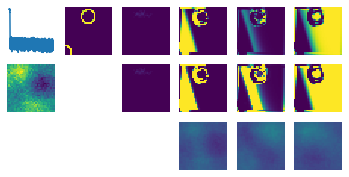

tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


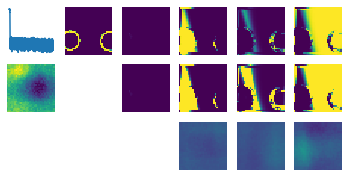

loss 29750 tensor(3.3159, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<


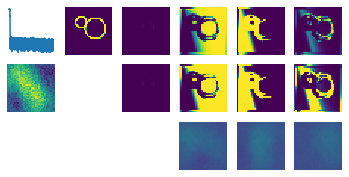

tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<


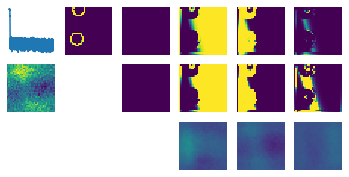

loss 30000 tensor(3.4673, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<


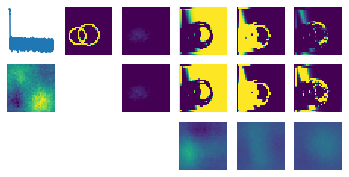

tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<


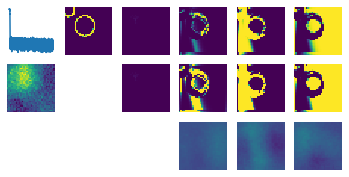

loss 30250 tensor(2.7383, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<


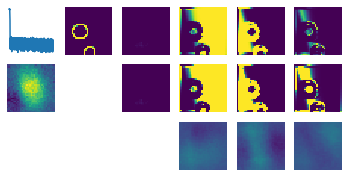

tensor(1.0000e-08, device='cuda:1') tensor(0.0120, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0120, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0120, device='cuda:1') >>><<


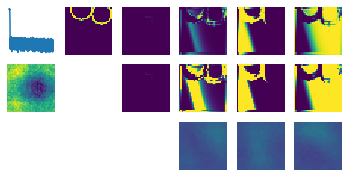

loss 30500 tensor(2.6417, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<


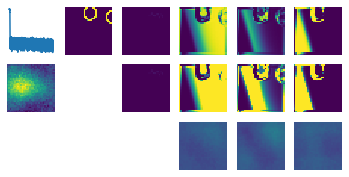

tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


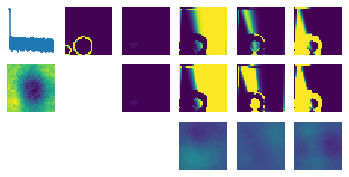

loss 30750 tensor(3.1136, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


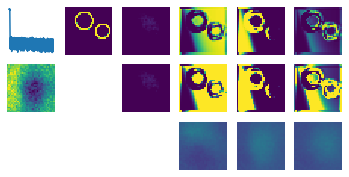

tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<


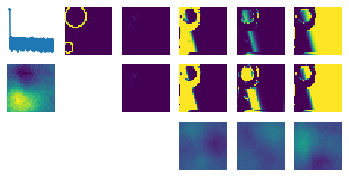

loss 31000 tensor(2.0982, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<


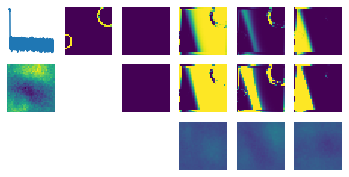

tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<


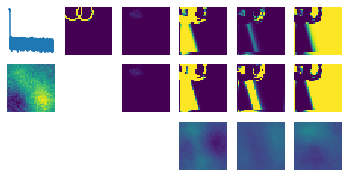

loss 31250 tensor(2.8526, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<


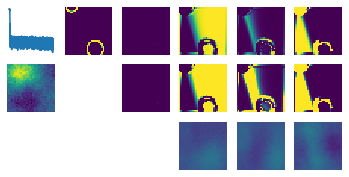

tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<


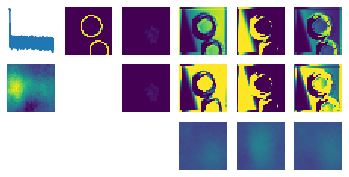

loss 31500 tensor(2.9451, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<


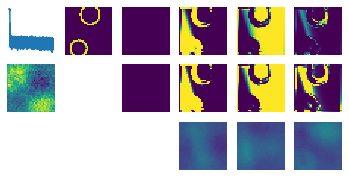

tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<


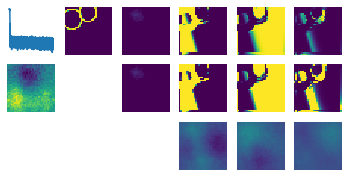

loss 31750 tensor(3.5166, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<


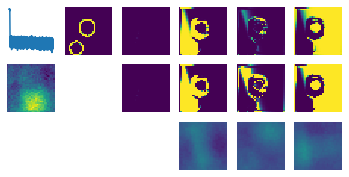

tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<


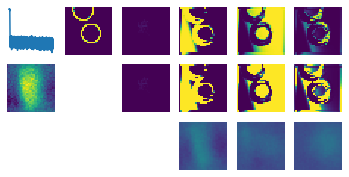

loss 32000 tensor(3.2325, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<


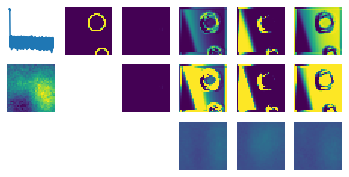

tensor(1.0000e-08, device='cuda:1') tensor(0.0228, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0228, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0228, device='cuda:1') >>><<


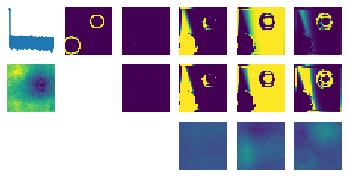

loss 32250 tensor(2.8804, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<


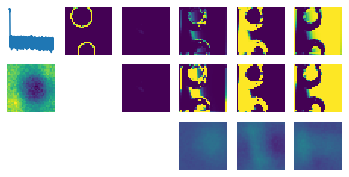

tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


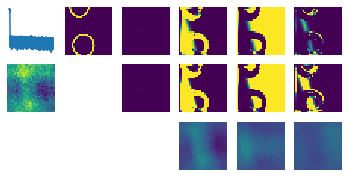

loss 32500 tensor(2.8153, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<


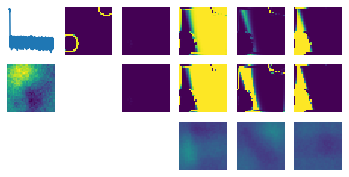

tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<


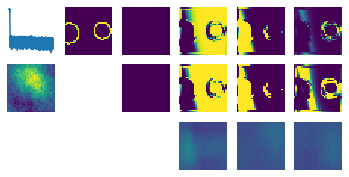

loss 32750 tensor(3.2520, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<


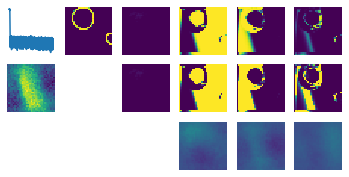

tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0093, device='cuda:1') >>><<


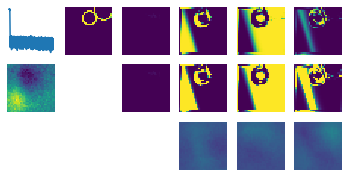

loss 33000 tensor(2.9550, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0348, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0348, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0348, device='cuda:1') >>><<


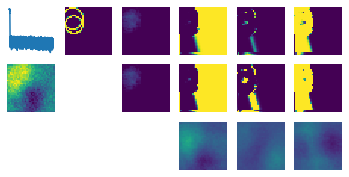

tensor(1.0000e-08, device='cuda:1') tensor(0.0353, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0353, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0353, device='cuda:1') >>><<


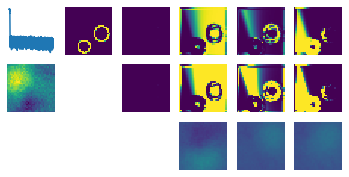

loss 33250 tensor(3.2059, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<


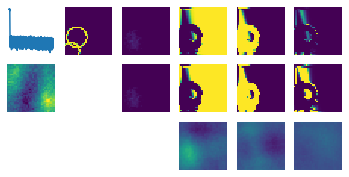

tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<


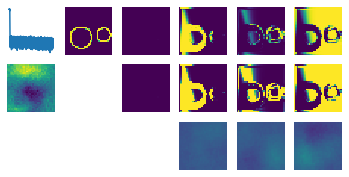

loss 33500 tensor(3.6359, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0290, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0290, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0290, device='cuda:1') >>><<


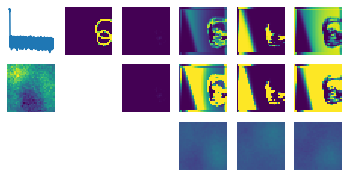

tensor(1.0000e-08, device='cuda:1') tensor(0.0284, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0284, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0284, device='cuda:1') >>><<


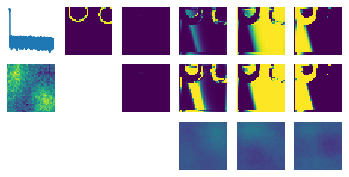

loss 33750 tensor(3.2006, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<


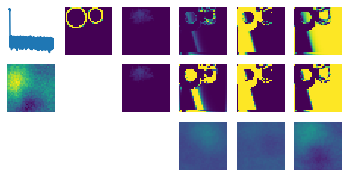

tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<


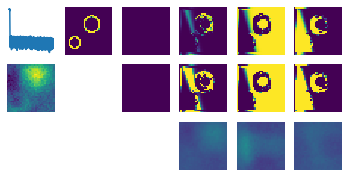

loss 34000 tensor(2.8180, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<


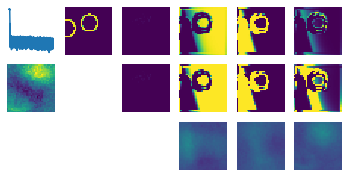

tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<


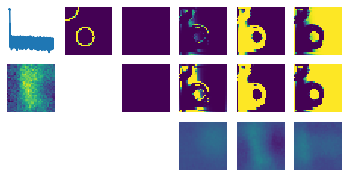

loss 34250 tensor(2.9803, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0236, device='cuda:1') >>><<


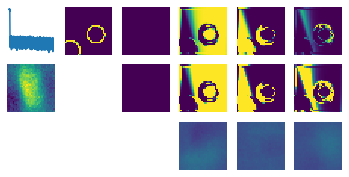

tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


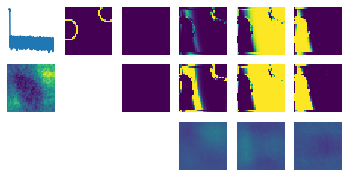

loss 34500 tensor(3.4976, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<


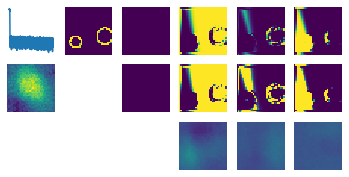

tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<


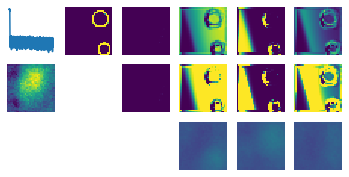

loss 34750 tensor(3.0165, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<


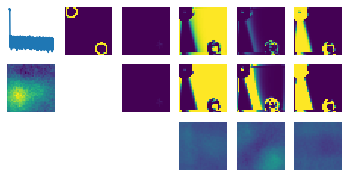

tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<


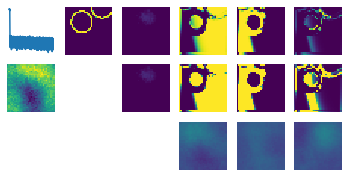

loss 35000 tensor(3.3903, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0309, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0309, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0309, device='cuda:1') >>><<


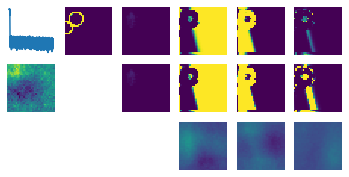

tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<


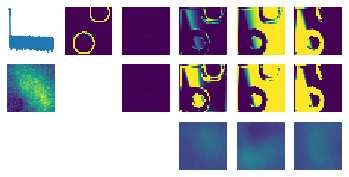

loss 35250 tensor(3.2493, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0375, device='cuda:1') >>><<


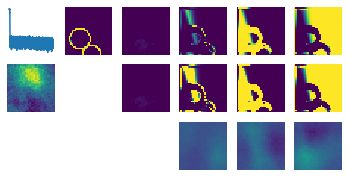

tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<


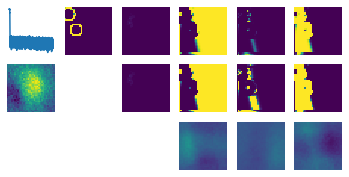

loss 35500 tensor(2.9839, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


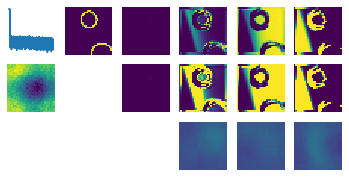

tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<


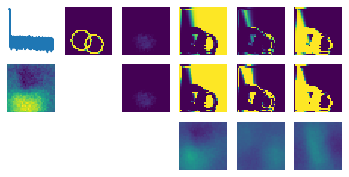

loss 35750 tensor(2.9514, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<


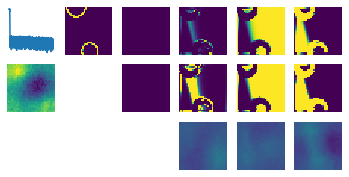

tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<


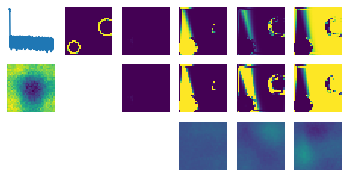

loss 36000 tensor(2.8184, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<


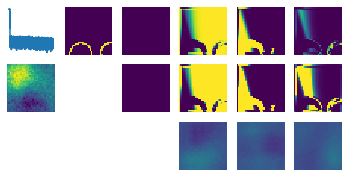

tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<


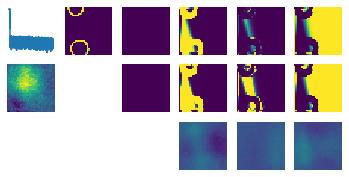

loss 36250 tensor(3.0224, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<


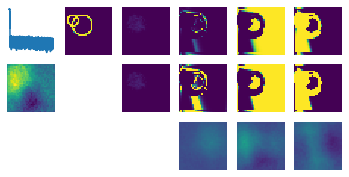

tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<


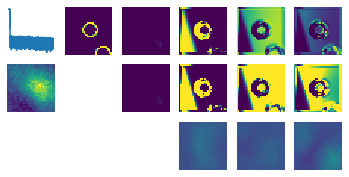

loss 36500 tensor(3.3266, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0147, device='cuda:1') >>><<


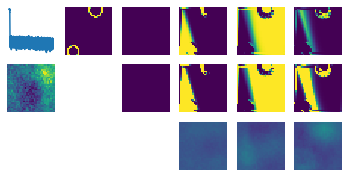

tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<


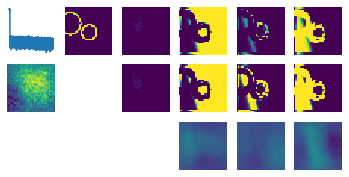

loss 36750 tensor(3.2203, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


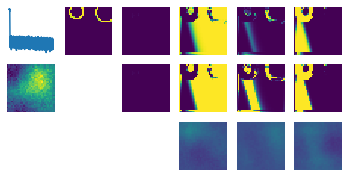

tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<


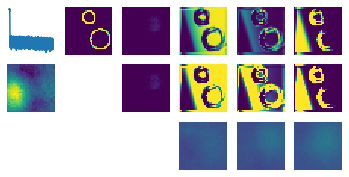

loss 37000 tensor(2.6910, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<


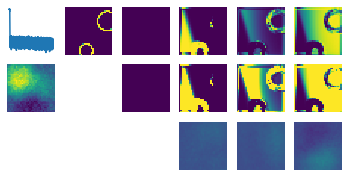

tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


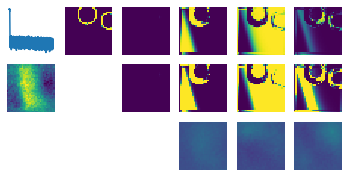

loss 37250 tensor(2.6959, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<


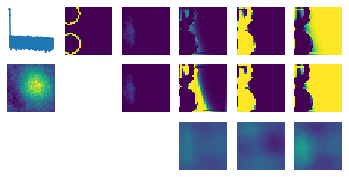

tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<


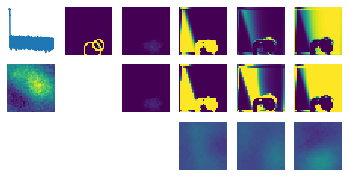

loss 37500 tensor(3.1580, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<


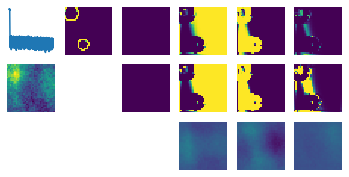

tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0224, device='cuda:1') >>><<


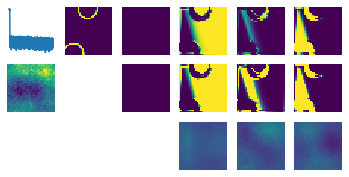

loss 37750 tensor(3.1613, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<


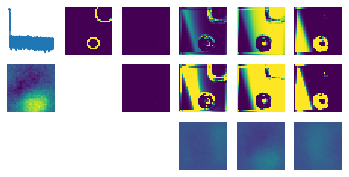

tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<


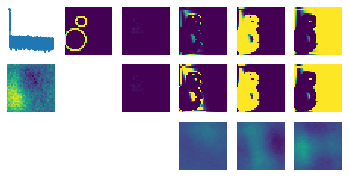

loss 38000 tensor(3.3139, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<


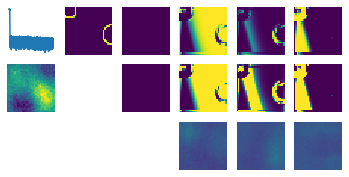

tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<


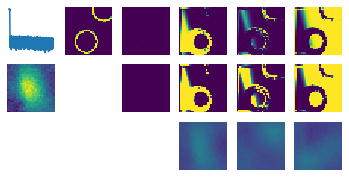

loss 38250 tensor(2.6665, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<


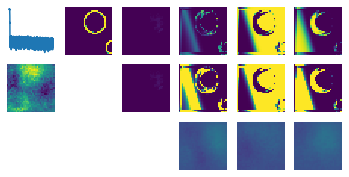

tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<


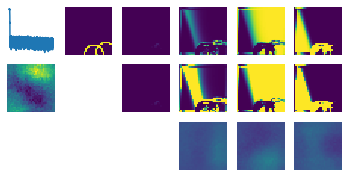

loss 38500 tensor(3.6291, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0400, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0400, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0400, device='cuda:1') >>><<


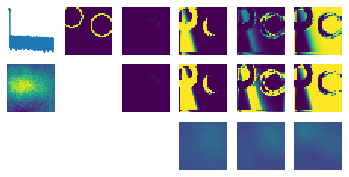

tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<


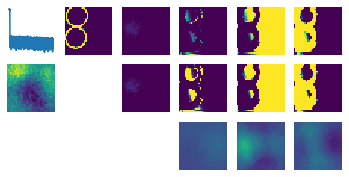

loss 38750 tensor(3.5636, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<


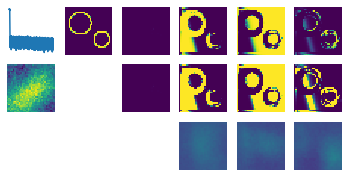

tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<


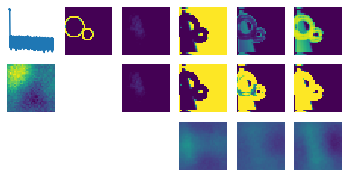

loss 39000 tensor(3.3576, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0222, device='cuda:1') >>><<


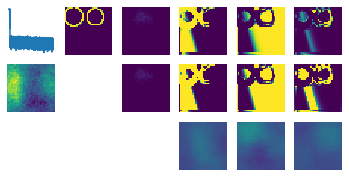

tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0217, device='cuda:1') >>><<


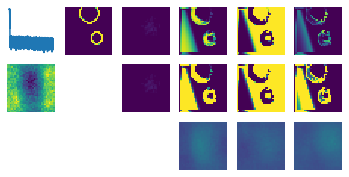

loss 39250 tensor(2.5744, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


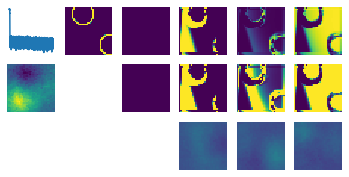

tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<


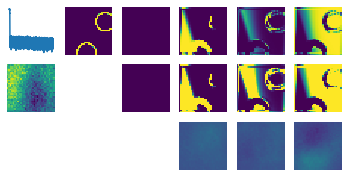

loss 39500 tensor(3.4585, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<


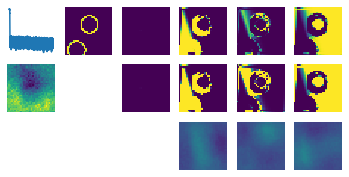

tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<


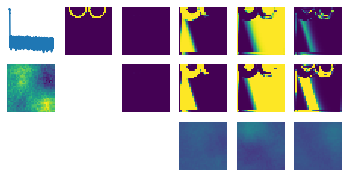

loss 39750 tensor(2.8628, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0333, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0333, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0333, device='cuda:1') >>><<


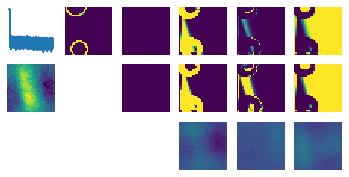

tensor(1.0000e-08, device='cuda:1') tensor(0.0262, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0262, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0262, device='cuda:1') >>><<


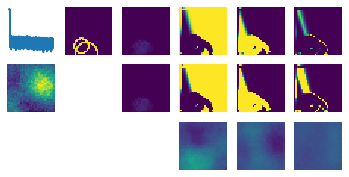

loss 40000 tensor(3.1403, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<


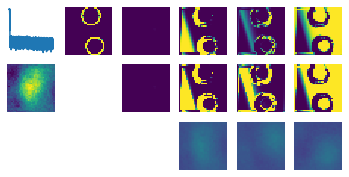

tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0209, device='cuda:1') >>><<


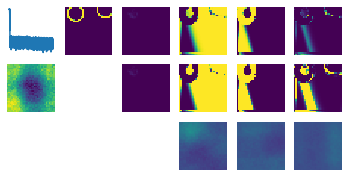

loss 40250 tensor(2.6183, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


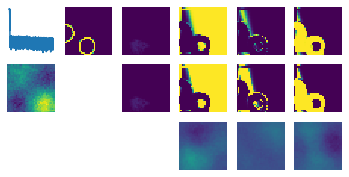

tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


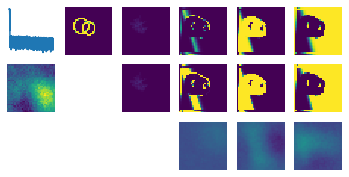

loss 40500 tensor(2.7349, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<


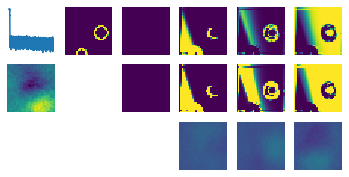

tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<


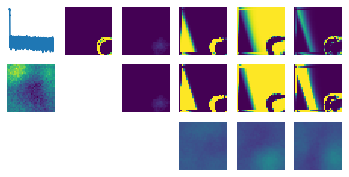

loss 40750 tensor(2.4977, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<


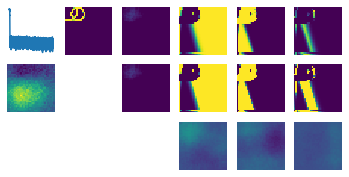

tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0121, device='cuda:1') >>><<


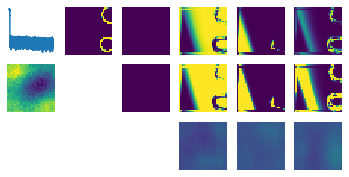

loss 41000 tensor(3.4465, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<


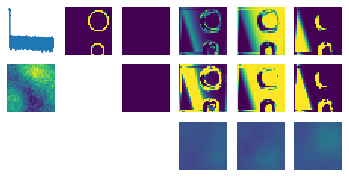

tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0119, device='cuda:1') >>><<


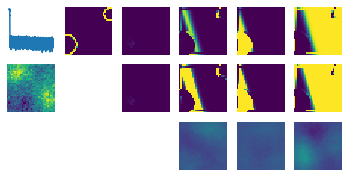

loss 41250 tensor(2.8027, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


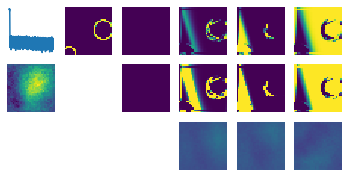

tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


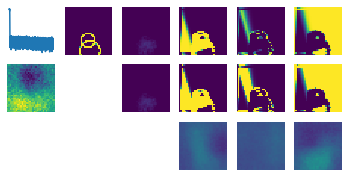

loss 41500 tensor(3.5674, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<


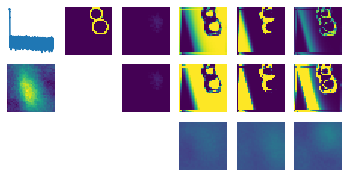

tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<


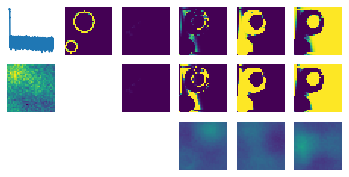

loss 41750 tensor(3.6001, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<


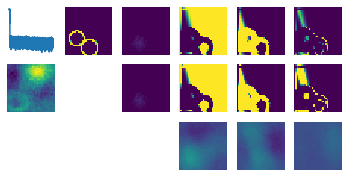

tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


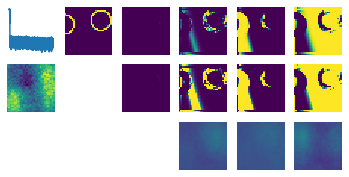

loss 42000 tensor(3.2914, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0163, device='cuda:1') >>><<


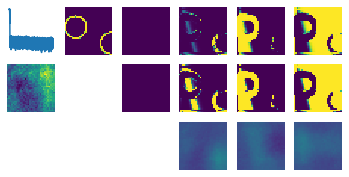

tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<


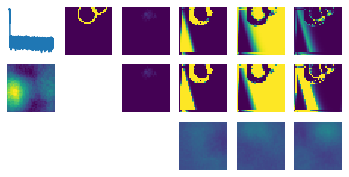

loss 42250 tensor(2.8271, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0157, device='cuda:1') >>><<


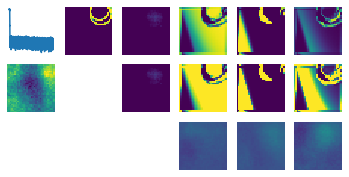

tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<


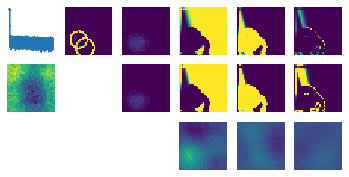

loss 42500 tensor(3.3458, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0341, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0341, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0341, device='cuda:1') >>><<


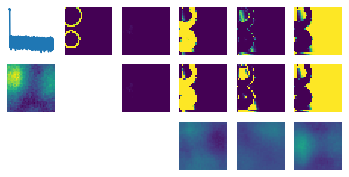

tensor(1.0000e-08, device='cuda:1') tensor(0.0320, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0320, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0320, device='cuda:1') >>><<


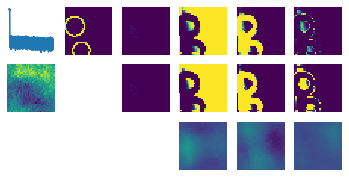

loss 42750 tensor(3.2132, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<


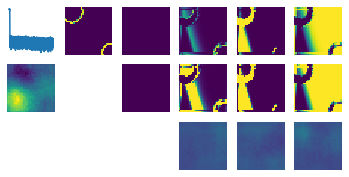

tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0098, device='cuda:1') >>><<


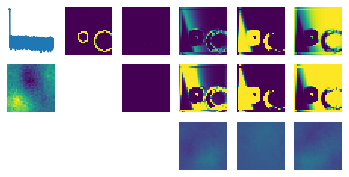

loss 43000 tensor(3.4971, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<


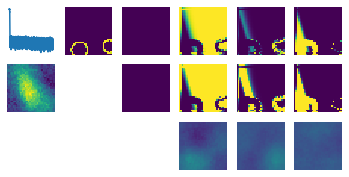

tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<


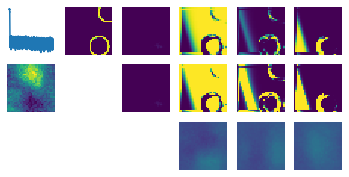

loss 43250 tensor(2.8950, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<


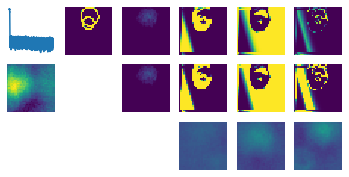

tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0245, device='cuda:1') >>><<


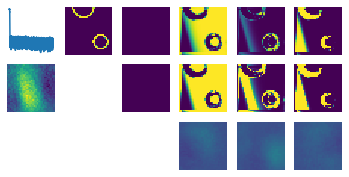

loss 43500 tensor(2.7803, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


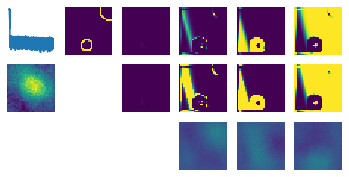

tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<


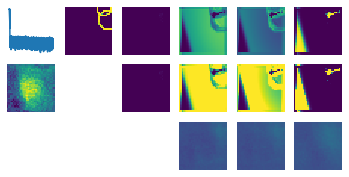

loss 43750 tensor(2.7829, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0111, device='cuda:1') >>><<


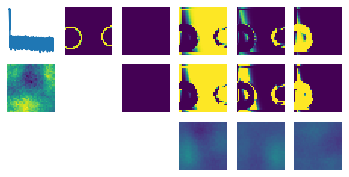

tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<


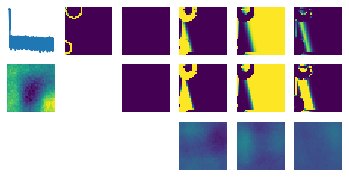

loss 44000 tensor(2.8838, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


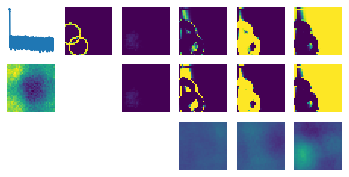

tensor(1.0000e-08, device='cuda:1') tensor(0.0232, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0232, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0232, device='cuda:1') >>><<


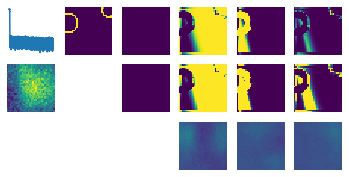

loss 44250 tensor(3.3004, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<


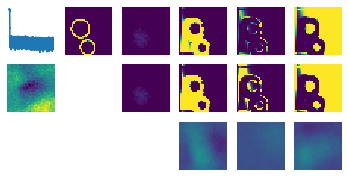

tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<


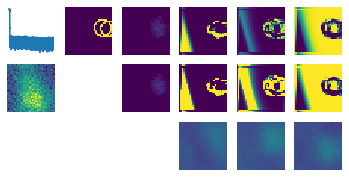

loss 44500 tensor(3.1871, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0129, device='cuda:1') >>><<


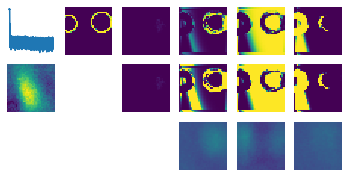

tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


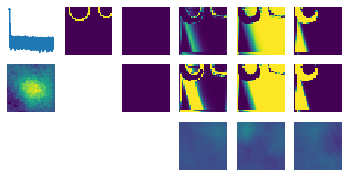

loss 44750 tensor(2.4023, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


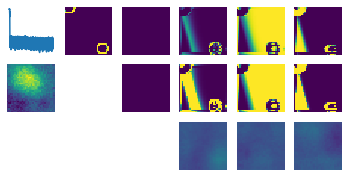

tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<


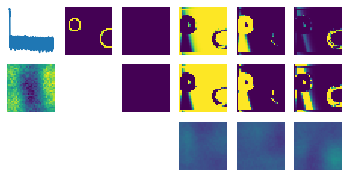

loss 45000 tensor(2.8249, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0166, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0166, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0166, device='cuda:1') >>><<


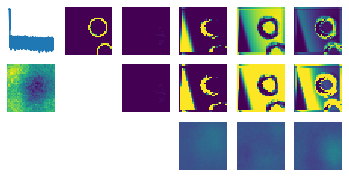

tensor(1.0000e-08, device='cuda:1') tensor(0.0376, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0376, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0376, device='cuda:1') >>><<


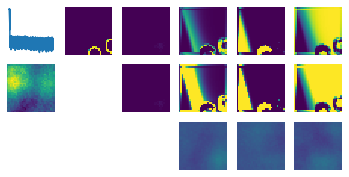

loss 45250 tensor(2.8815, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<


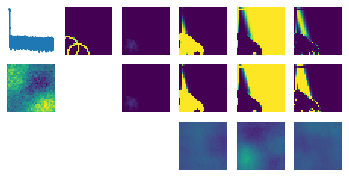

tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0135, device='cuda:1') >>><<


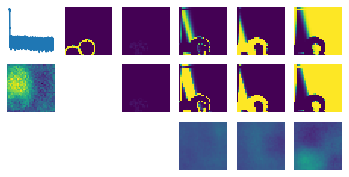

loss 45500 tensor(3.2681, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<


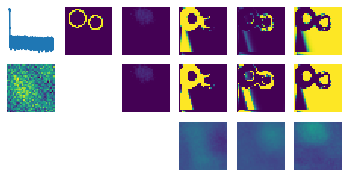

tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0184, device='cuda:1') >>><<


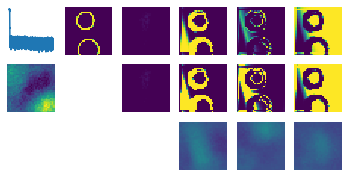

loss 45750 tensor(3.1000, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<


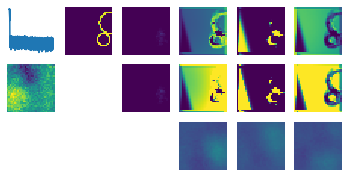

tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<


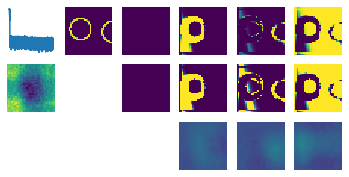

loss 46000 tensor(2.9534, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<


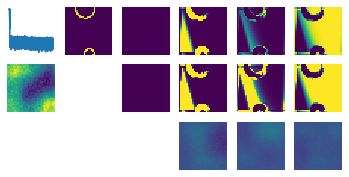

tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<


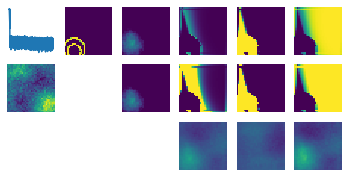

loss 46250 tensor(3.2378, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0173, device='cuda:1') >>><<


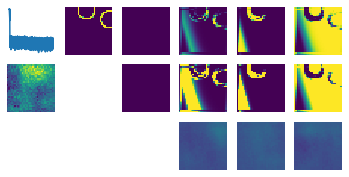

tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0149, device='cuda:1') >>><<


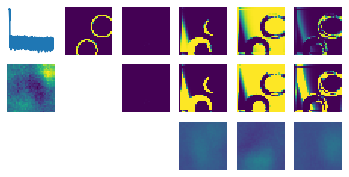

loss 46500 tensor(2.8175, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<


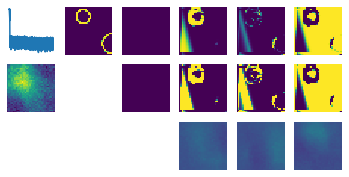

tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<


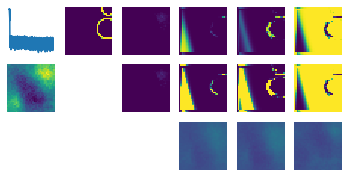

loss 46750 tensor(3.2654, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<


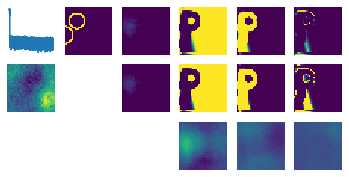

tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<


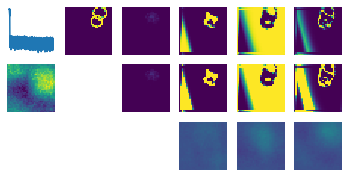

loss 47000 tensor(2.9832, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<


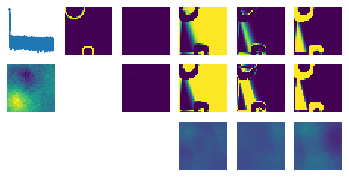

tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<


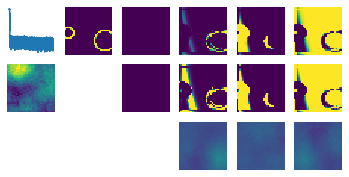

loss 47250 tensor(2.4317, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<


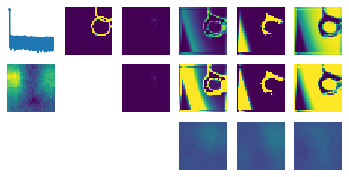

tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<


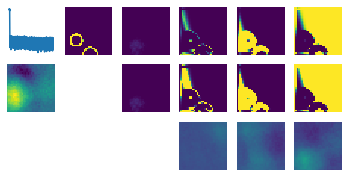

loss 47500 tensor(3.1674, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<


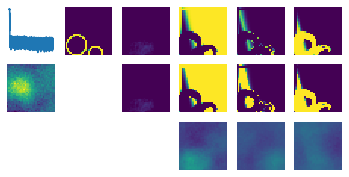

tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<


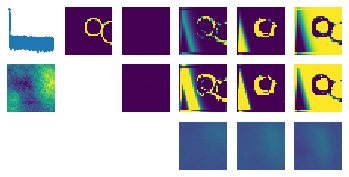

loss 47750 tensor(3.4713, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


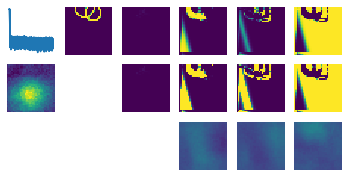

tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<


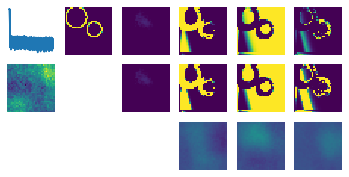

loss 48000 tensor(3.4632, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0152, device='cuda:1') >>><<


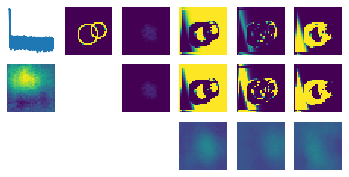

tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


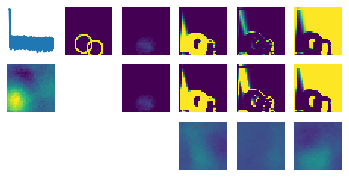

loss 48250 tensor(3.5375, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<


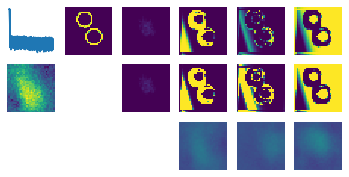

tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<


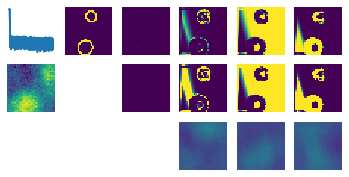

loss 48500 tensor(3.0881, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


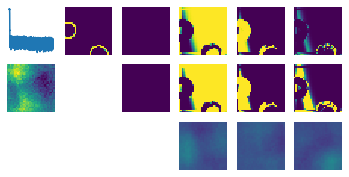

tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<


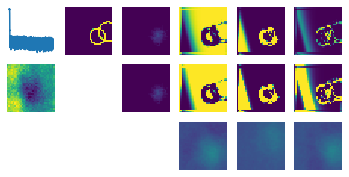

loss 48750 tensor(3.2829, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0145, device='cuda:1') >>><<


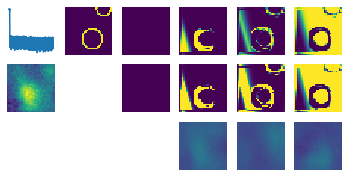

tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


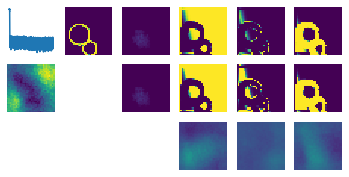

loss 49000 tensor(2.0352, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<


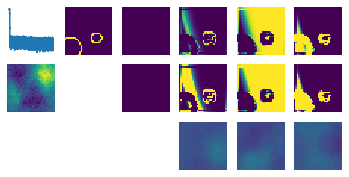

tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0212, device='cuda:1') >>><<


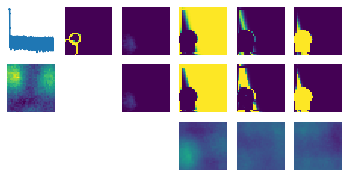

loss 49250 tensor(2.9520, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0193, device='cuda:1') >>><<


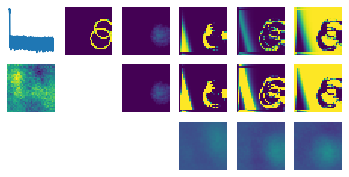

tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0136, device='cuda:1') >>><<


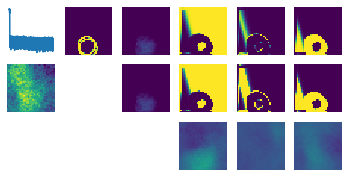

loss 49500 tensor(3.2852, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0134, device='cuda:1') >>><<


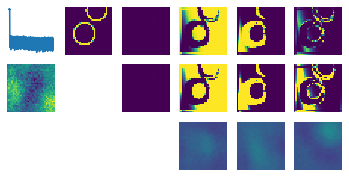

tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<


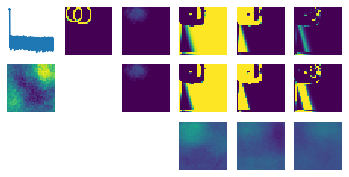

loss 49750 tensor(3.4504, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0146, device='cuda:1') >>><<


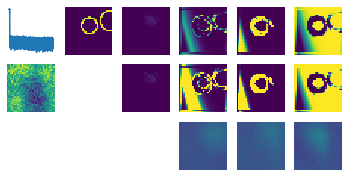

tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<


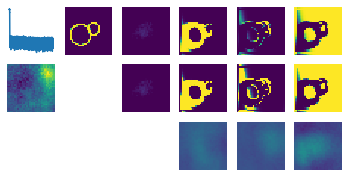

loss 50000 tensor(2.7908, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0115, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0115, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0115, device='cuda:1') >>><<


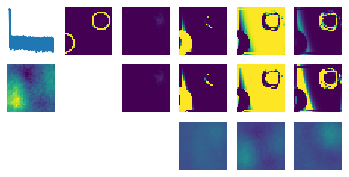

tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<


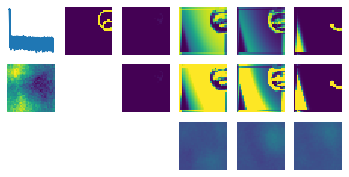

loss 50250 tensor(2.9843, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


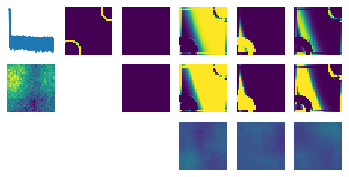

tensor(1.0000e-08, device='cuda:1') tensor(0.0103, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0103, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0103, device='cuda:1') >>><<


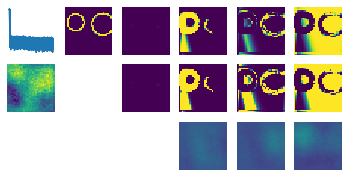

loss 50500 tensor(2.9390, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<


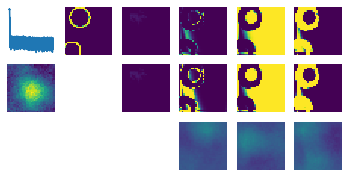

tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<


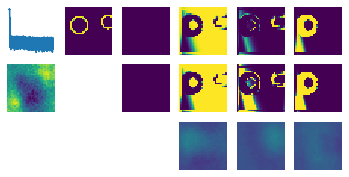

loss 50750 tensor(3.2819, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<


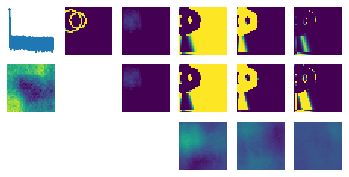

tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


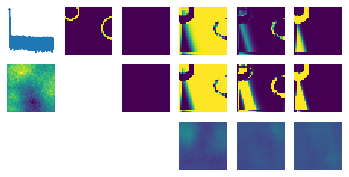

loss 51000 tensor(3.2794, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


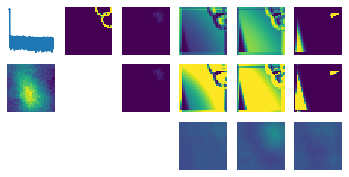

tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


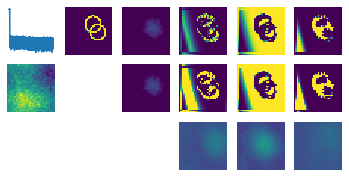

loss 51250 tensor(2.6452, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0241, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0241, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0241, device='cuda:1') >>><<


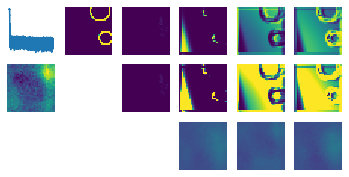

tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<


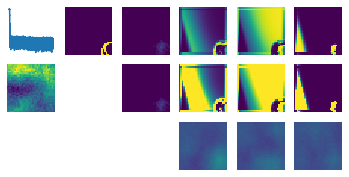

loss 51500 tensor(2.7173, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0089, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0089, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0089, device='cuda:1') >>><<


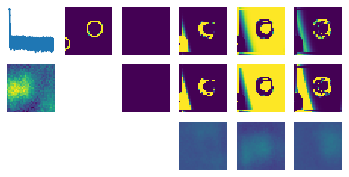

tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<


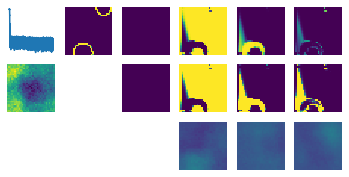

loss 51750 tensor(3.2525, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<


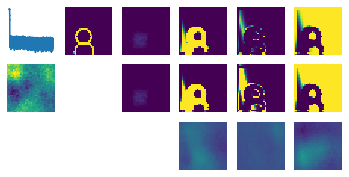

tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<


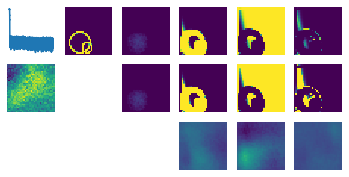

loss 52000 tensor(2.4644, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0189, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0189, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0189, device='cuda:1') >>><<


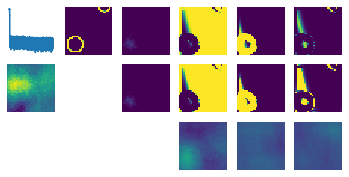

tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0158, device='cuda:1') >>><<


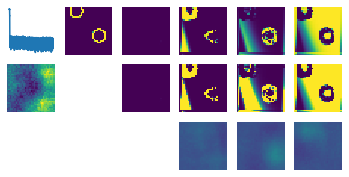

loss 52250 tensor(3.4347, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0100, device='cuda:1') >>><<


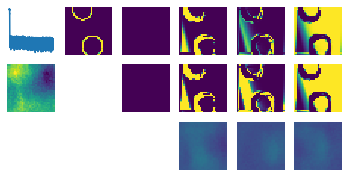

tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<


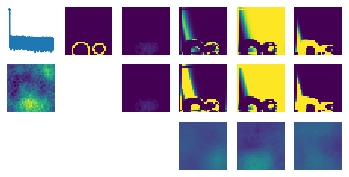

loss 52500 tensor(2.7519, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<


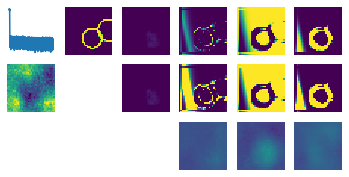

tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<


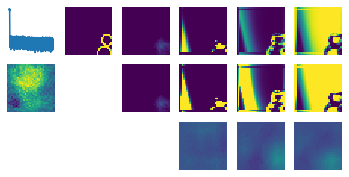

loss 52750 tensor(2.3807, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<


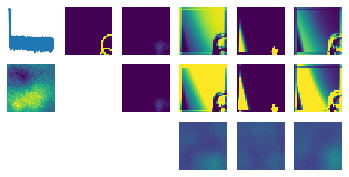

tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<


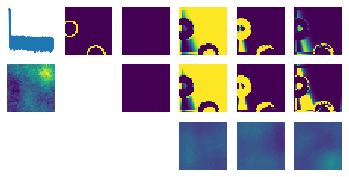

loss 53000 tensor(3.5449, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0219, device='cuda:1') >>><<


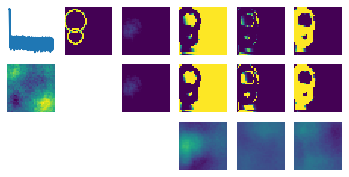

tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


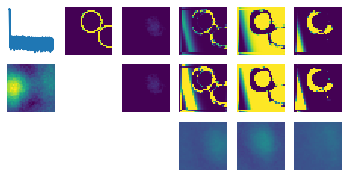

loss 53250 tensor(3.0548, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<


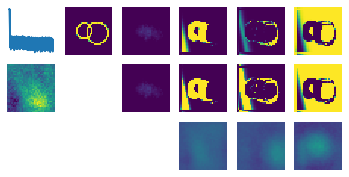

tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<


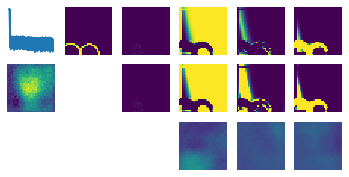

loss 53500 tensor(3.7830, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<


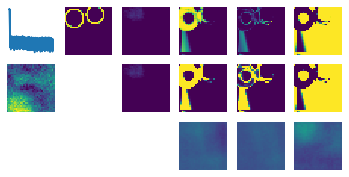

tensor(1.0000e-08, device='cuda:1') tensor(0.0238, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0238, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0238, device='cuda:1') >>><<


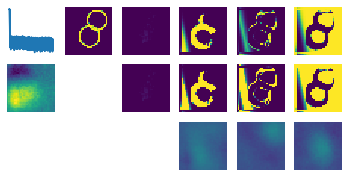

loss 53750 tensor(3.5927, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<


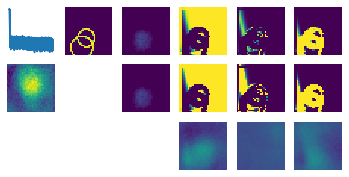

tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0174, device='cuda:1') >>><<


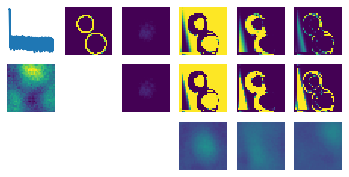

loss 54000 tensor(2.6076, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


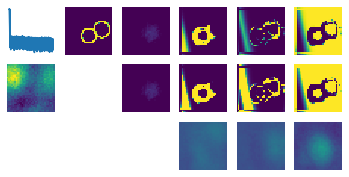

tensor(1.0000e-08, device='cuda:1') tensor(0.0267, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0267, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0267, device='cuda:1') >>><<


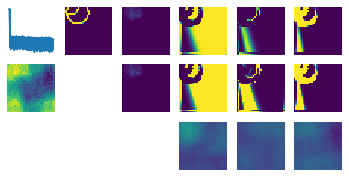

loss 54250 tensor(3.0329, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<


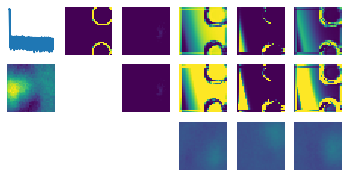

tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


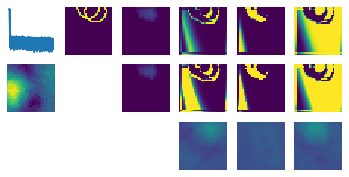

loss 54500 tensor(3.0478, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<


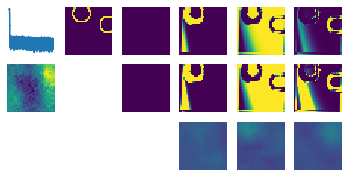

tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<


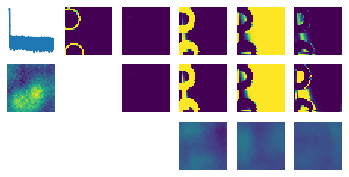

loss 54750 tensor(3.0926, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


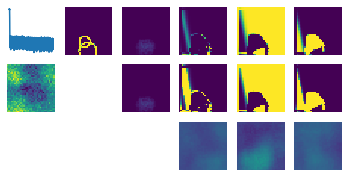

tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<


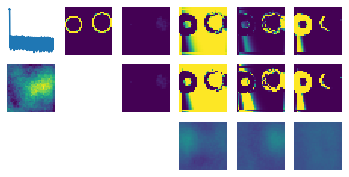

loss 55000 tensor(3.0844, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0311, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0311, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0311, device='cuda:1') >>><<


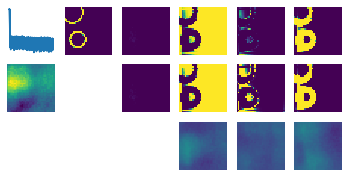

tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0257, device='cuda:1') >>><<


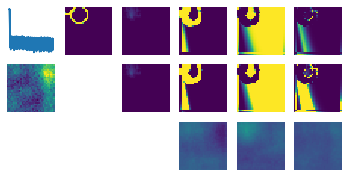

loss 55250 tensor(2.3619, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0472, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0472, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0472, device='cuda:1') >>><<


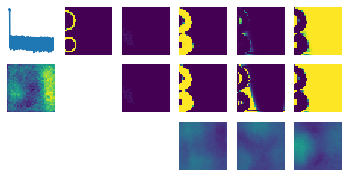

tensor(1.0000e-08, device='cuda:1') tensor(0.0518, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0518, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0518, device='cuda:1') >>><<


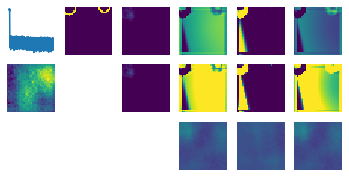

loss 55500 tensor(2.7035, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<


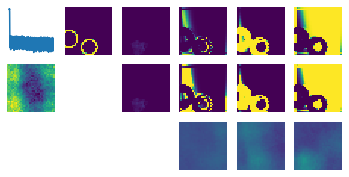

tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<


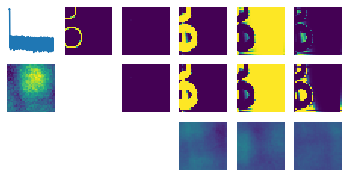

loss 55750 tensor(3.1129, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<


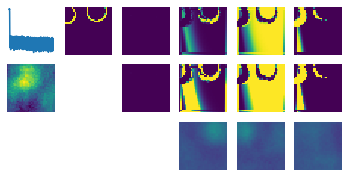

tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0190, device='cuda:1') >>><<


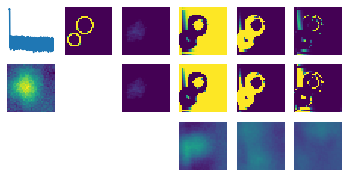

loss 56000 tensor(2.9220, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<


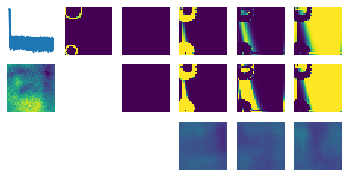

tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0132, device='cuda:1') >>><<


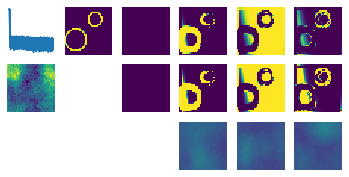

loss 56250 tensor(3.3301, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0150, device='cuda:1') >>><<


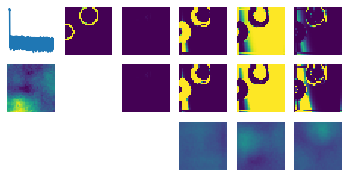

tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<


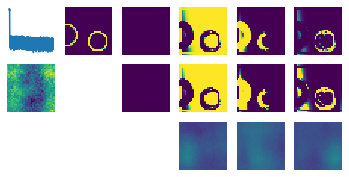

loss 56500 tensor(3.3956, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


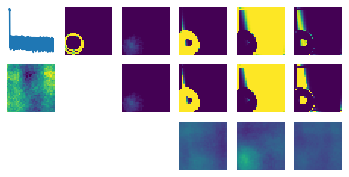

tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0175, device='cuda:1') >>><<


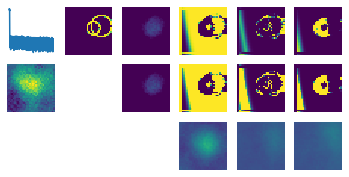

loss 56750 tensor(3.3768, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0101, device='cuda:1') >>><<


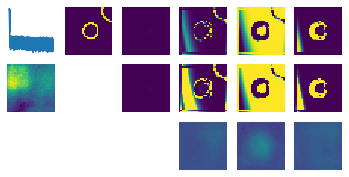

tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0114, device='cuda:1') >>><<


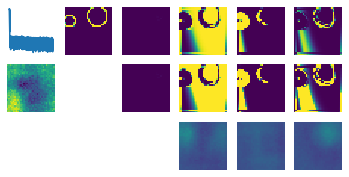

loss 57000 tensor(2.7496, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0168, device='cuda:1') >>><<


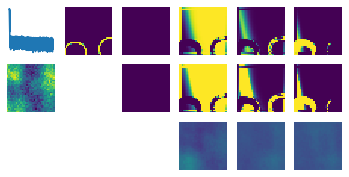

tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<


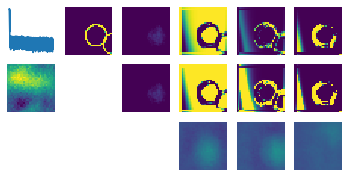

loss 57250 tensor(2.6940, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0295, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0295, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0295, device='cuda:1') >>><<


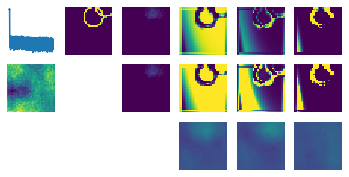

tensor(1.0000e-08, device='cuda:1') tensor(0.0223, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0223, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0223, device='cuda:1') >>><<


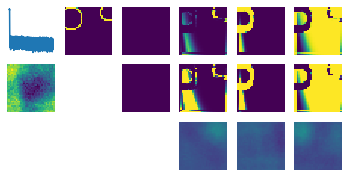

loss 57500 tensor(2.8477, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<


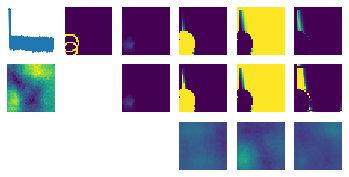

tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<


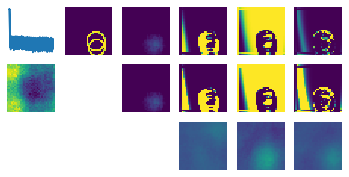

loss 57750 tensor(3.2165, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<


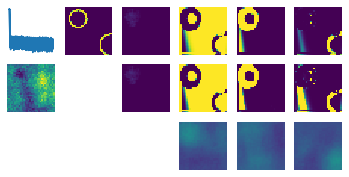

tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<


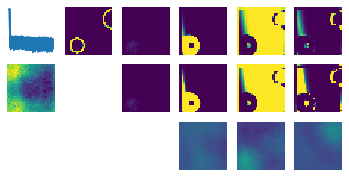

loss 58000 tensor(3.1891, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<


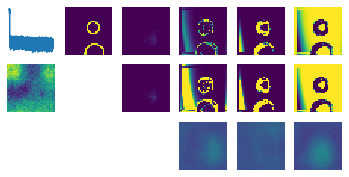

tensor(1.0000e-08, device='cuda:1') tensor(0.0151, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0151, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0151, device='cuda:1') >>><<


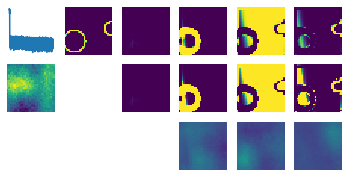

loss 58250 tensor(2.8431, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


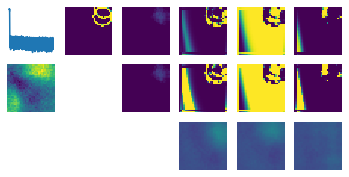

tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


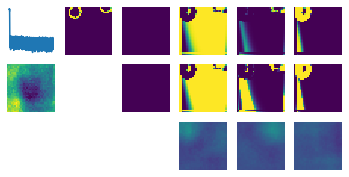

loss 58500 tensor(3.5218, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<


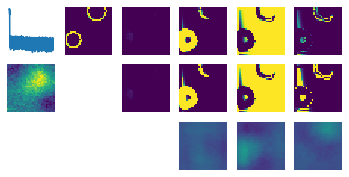

tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<


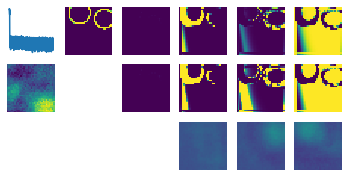

loss 58750 tensor(3.2703, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<


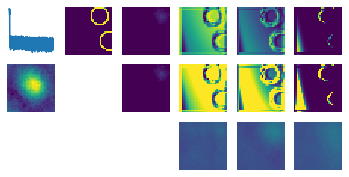

tensor(1.0000e-08, device='cuda:1') tensor(0.0362, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0362, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0362, device='cuda:1') >>><<


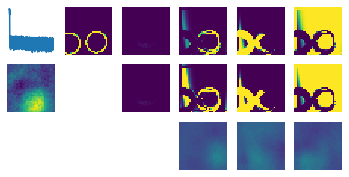

loss 59000 tensor(2.9021, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<


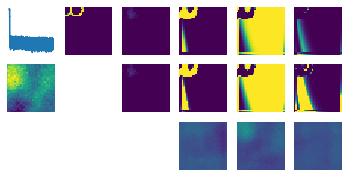

tensor(1.0000e-08, device='cuda:1') tensor(0.0227, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0227, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0227, device='cuda:1') >>><<


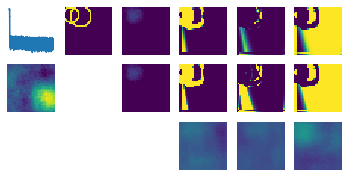

loss 59250 tensor(2.7366, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<


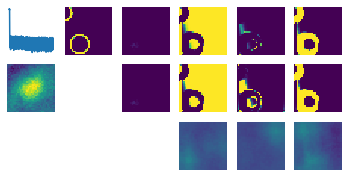

tensor(1.0000e-08, device='cuda:1') tensor(0.0484, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0484, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0484, device='cuda:1') >>><<


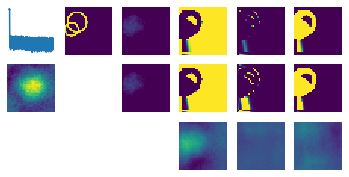

loss 59500 tensor(3.0471, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<


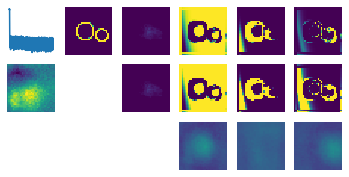

tensor(1.0000e-08, device='cuda:1') tensor(0.0198, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0198, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0198, device='cuda:1') >>><<


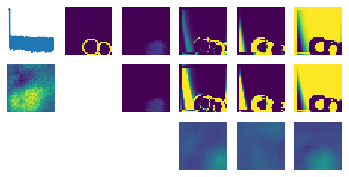

loss 59750 tensor(3.2639, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0218, device='cuda:1') >>><<


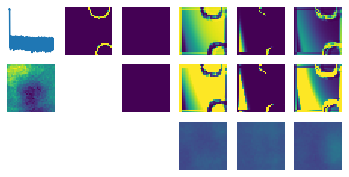

tensor(1.0000e-08, device='cuda:1') tensor(0.0244, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0244, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0244, device='cuda:1') >>><<


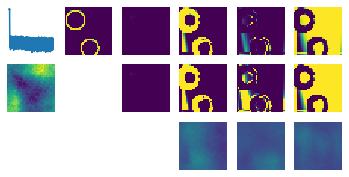

loss 60000 tensor(3.2048, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<


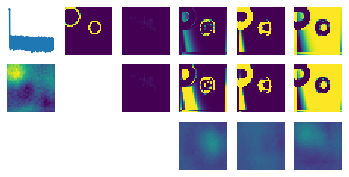

tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0261, device='cuda:1') >>><<


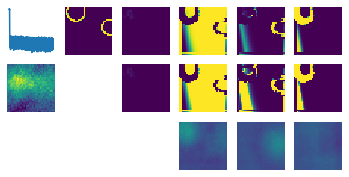

loss 60250 tensor(3.3740, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0108, device='cuda:1') >>><<


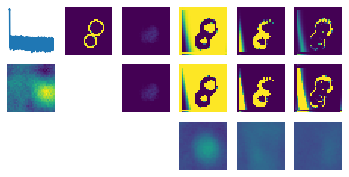

tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0118, device='cuda:1') >>><<


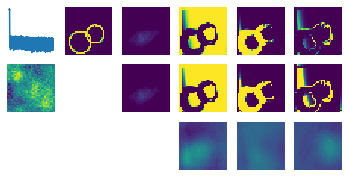

loss 60500 tensor(3.0603, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0291, device='cuda:1') >>><<


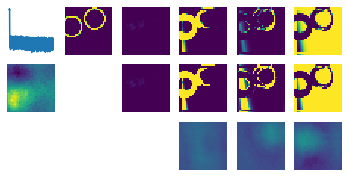

tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<


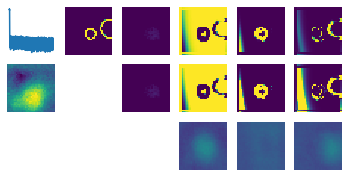

loss 60750 tensor(2.9932, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0676, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0676, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0676, device='cuda:1') >>><<


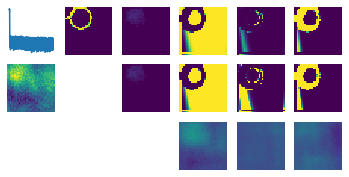

tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<


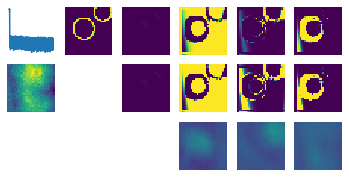

loss 61000 tensor(2.5559, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0468, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0468, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0468, device='cuda:1') >>><<


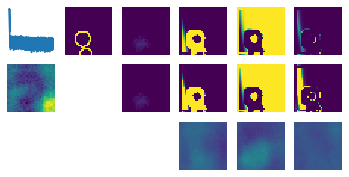

tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<


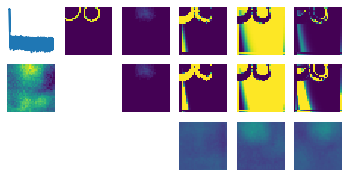

loss 61250 tensor(3.3682, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0391, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0391, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0391, device='cuda:1') >>><<


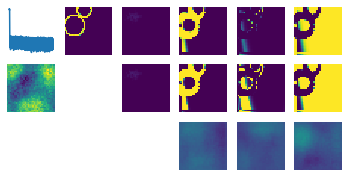

tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<


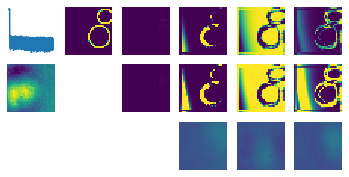

loss 61500 tensor(3.2771, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0455, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0455, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0455, device='cuda:1') >>><<


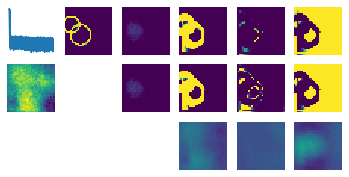

tensor(1.0000e-08, device='cuda:1') tensor(0.0480, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0480, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0480, device='cuda:1') >>><<


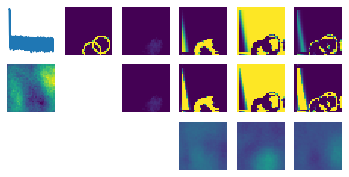

loss 61750 tensor(3.2639, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0705, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0705, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0705, device='cuda:1') >>><<


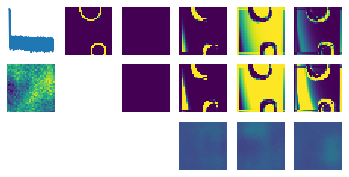

tensor(1.0000e-08, device='cuda:1') tensor(0.0653, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0653, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0653, device='cuda:1') >>><<


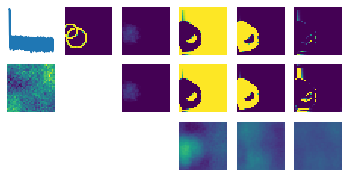

loss 62000 tensor(3.1810, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0327, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0327, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0327, device='cuda:1') >>><<


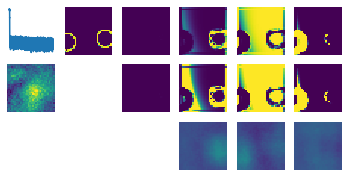

tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<


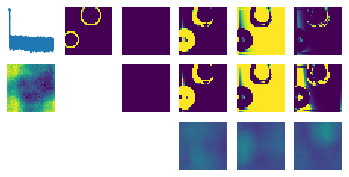

loss 62250 tensor(2.5870, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<


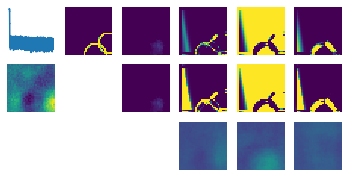

tensor(1.0000e-08, device='cuda:1') tensor(0.0211, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0211, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0211, device='cuda:1') >>><<


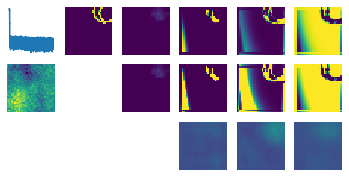

loss 62500 tensor(2.7106, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.2064, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.2064, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.2064, device='cuda:1') >>><<


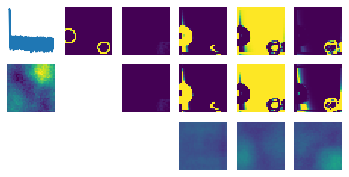

tensor(1.0000e-08, device='cuda:1') tensor(0.2113, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.2113, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.2113, device='cuda:1') >>><<


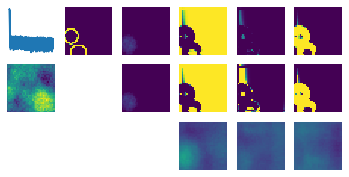

loss 62750 tensor(3.2690, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0260, device='cuda:1') >>><<


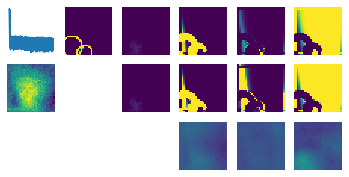

tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<


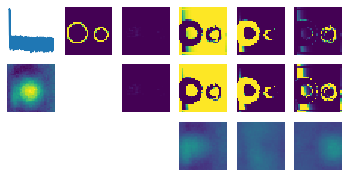

loss 63000 tensor(3.3730, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0492, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0492, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0492, device='cuda:1') >>><<


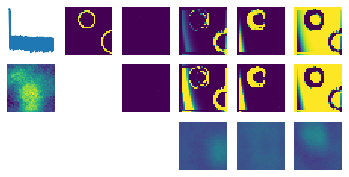

tensor(1.0000e-08, device='cuda:1') tensor(0.0519, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0519, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0519, device='cuda:1') >>><<


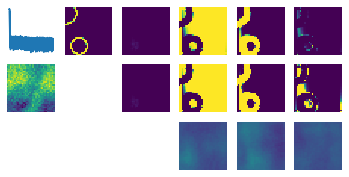

loss 63250 tensor(3.2049, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0404, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0404, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0404, device='cuda:1') >>><<


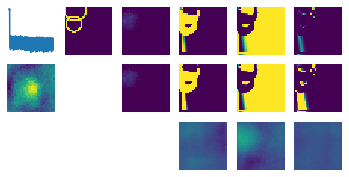

tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<


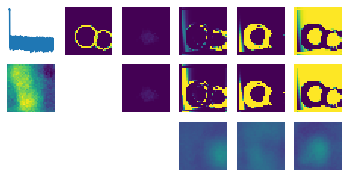

loss 63500 tensor(2.8440, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<


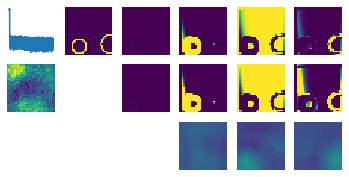

tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<


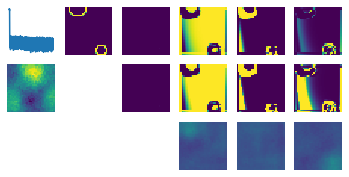

loss 63750 tensor(2.3198, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<


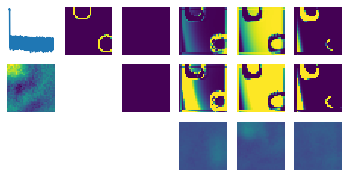

tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0194, device='cuda:1') >>><<


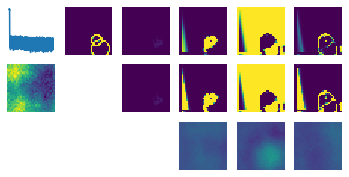

loss 64000 tensor(3.5759, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


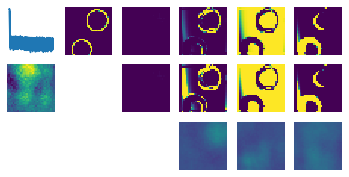

tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0125, device='cuda:1') >>><<


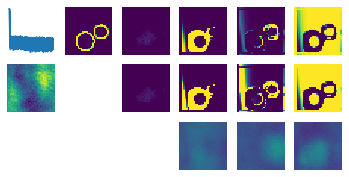

loss 64250 tensor(3.2529, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0460, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0460, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0460, device='cuda:1') >>><<


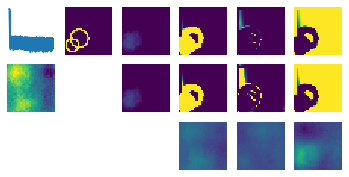

tensor(1.0000e-08, device='cuda:1') tensor(0.0523, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0523, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0523, device='cuda:1') >>><<


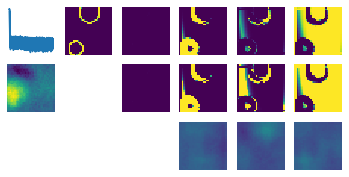

loss 64500 tensor(3.2903, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0394, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0394, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0394, device='cuda:1') >>><<


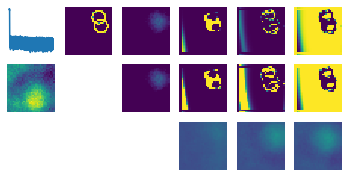

tensor(1.0000e-08, device='cuda:1') tensor(0.0401, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0401, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0401, device='cuda:1') >>><<


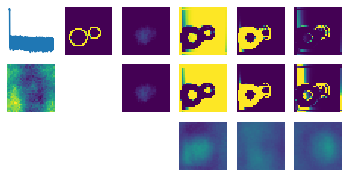

loss 64750 tensor(3.2568, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0405, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0405, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0405, device='cuda:1') >>><<


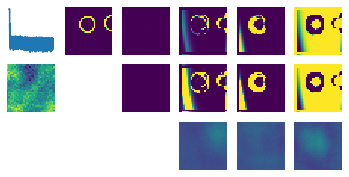

tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0419, device='cuda:1') >>><<


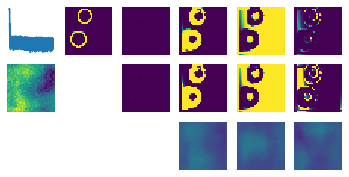

loss 65000 tensor(2.9970, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0388, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0388, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0388, device='cuda:1') >>><<


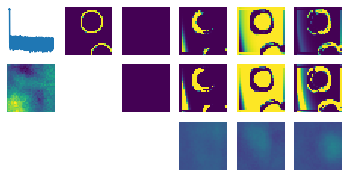

tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0412, device='cuda:1') >>><<


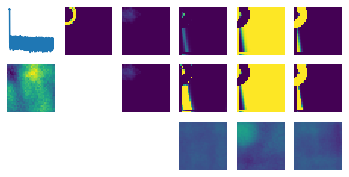

loss 65250 tensor(2.9013, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<


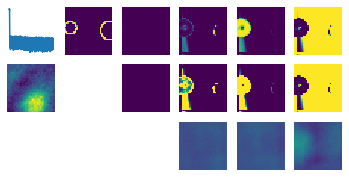

tensor(1.0000e-08, device='cuda:1') tensor(0.0475, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0475, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0475, device='cuda:1') >>><<


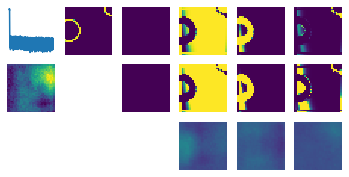

loss 65500 tensor(2.8466, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<


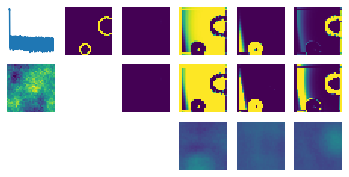

tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


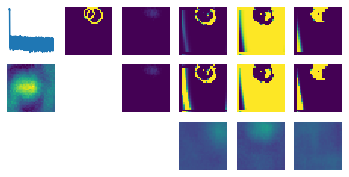

loss 65750 tensor(3.0233, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0544, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0544, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0544, device='cuda:1') >>><<


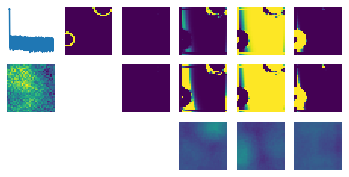

tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<


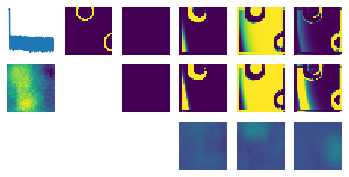

loss 66000 tensor(2.9753, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0301, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0301, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0301, device='cuda:1') >>><<


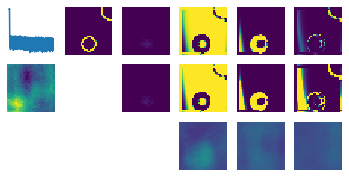

tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<


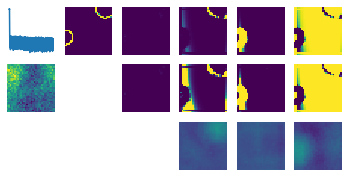

loss 66250 tensor(2.5366, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0323, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0323, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0323, device='cuda:1') >>><<


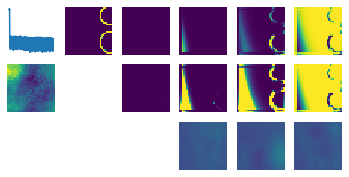

tensor(1.0000e-08, device='cuda:1') tensor(0.0343, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0343, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0343, device='cuda:1') >>><<


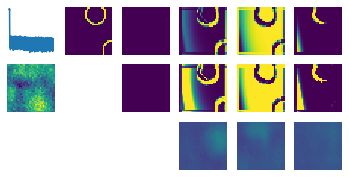

loss 66500 tensor(2.9107, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0495, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0495, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0495, device='cuda:1') >>><<


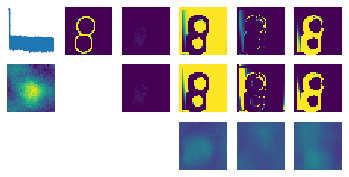

tensor(1.0000e-08, device='cuda:1') tensor(0.0553, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0553, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0553, device='cuda:1') >>><<


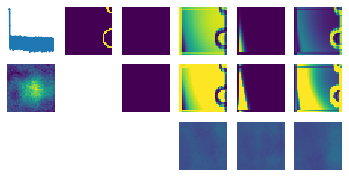

loss 66750 tensor(2.6035, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<


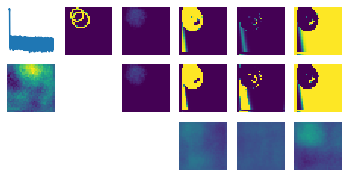

tensor(1.0000e-08, device='cuda:1') tensor(0.0364, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0364, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0364, device='cuda:1') >>><<


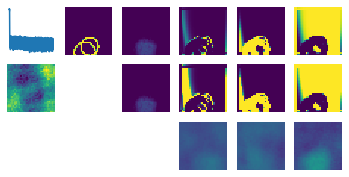

loss 67000 tensor(3.3070, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<


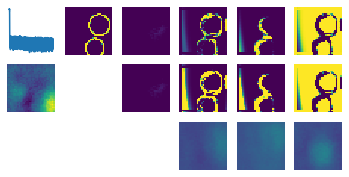

tensor(1.0000e-08, device='cuda:1') tensor(0.0431, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0431, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0431, device='cuda:1') >>><<


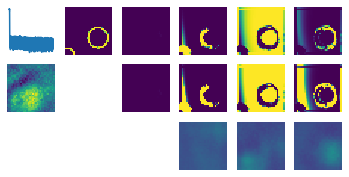

loss 67250 tensor(2.8987, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<


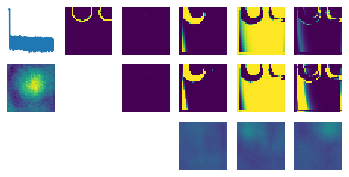

tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<


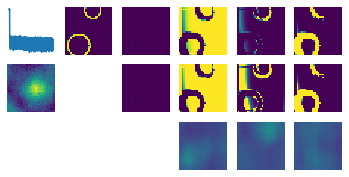

loss 67500 tensor(3.1142, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0602, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0602, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0602, device='cuda:1') >>><<


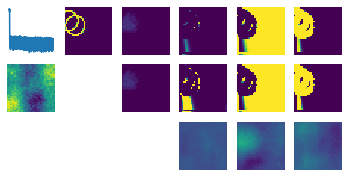

tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<


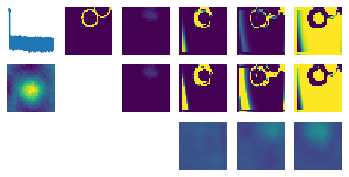

loss 67750 tensor(2.6850, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0474, device='cuda:1') >>><<


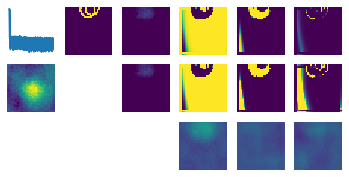

tensor(1.0000e-08, device='cuda:1') tensor(0.0436, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0436, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0436, device='cuda:1') >>><<


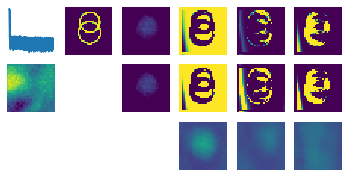

loss 68000 tensor(3.5768, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<


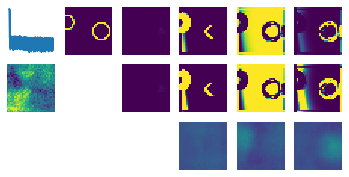

tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<


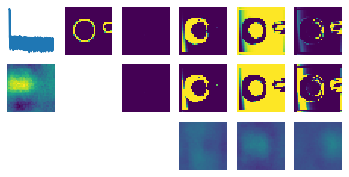

loss 68250 tensor(3.1496, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0148, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0148, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0148, device='cuda:1') >>><<


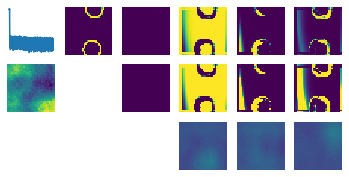

tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


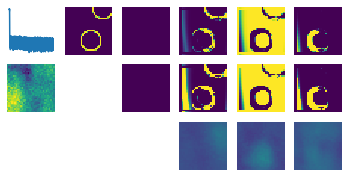

loss 68500 tensor(3.3372, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0334, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0334, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0334, device='cuda:1') >>><<


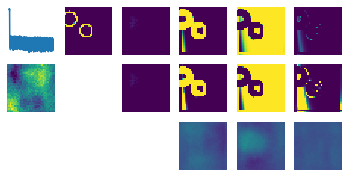

tensor(1.0000e-08, device='cuda:1') tensor(0.0396, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0396, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0396, device='cuda:1') >>><<


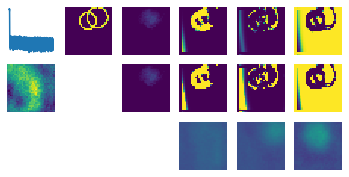

loss 68750 tensor(2.7100, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0368, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0368, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0368, device='cuda:1') >>><<


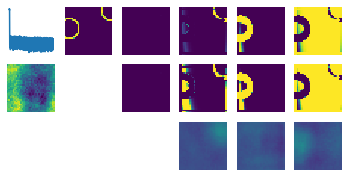

tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0466, device='cuda:1') >>><<


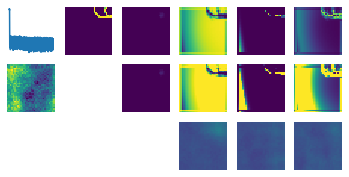

loss 69000 tensor(2.7167, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0371, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0371, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0371, device='cuda:1') >>><<


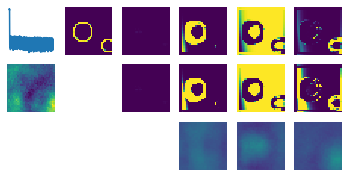

tensor(1.0000e-08, device='cuda:1') tensor(0.0393, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0393, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0393, device='cuda:1') >>><<


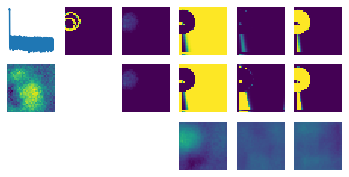

loss 69250 tensor(3.0460, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0439, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0439, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0439, device='cuda:1') >>><<


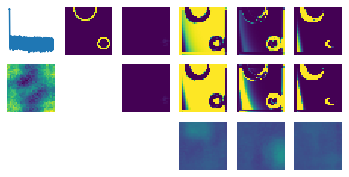

tensor(1.0000e-08, device='cuda:1') tensor(0.0504, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0504, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0504, device='cuda:1') >>><<


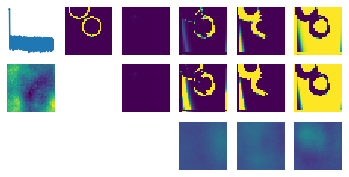

loss 69500 tensor(3.3154, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0568, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0568, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0568, device='cuda:1') >>><<


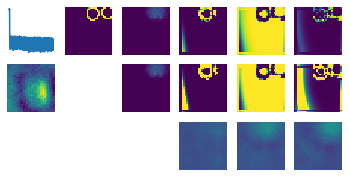

tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<


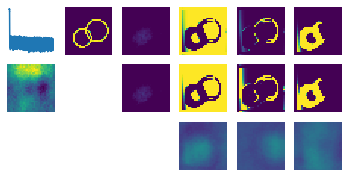

loss 69750 tensor(3.4333, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0141, device='cuda:1') >>><<


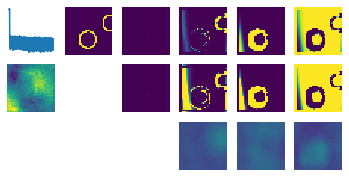

tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0139, device='cuda:1') >>><<


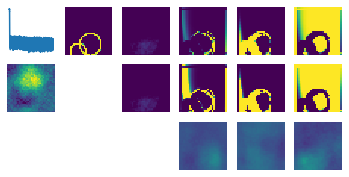

loss 70000 tensor(3.5068, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0258, device='cuda:1') >>><<


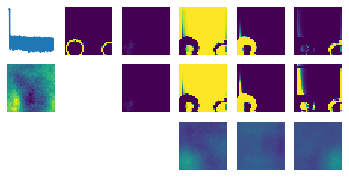

tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<


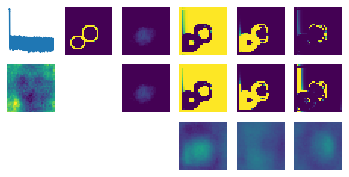

loss 70250 tensor(3.3990, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0931, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0931, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0931, device='cuda:1') >>><<


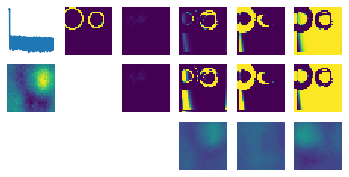

tensor(1.0000e-08, device='cuda:1') tensor(0.0938, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0938, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0938, device='cuda:1') >>><<


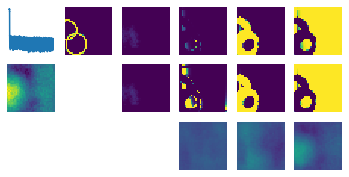

loss 70500 tensor(2.9722, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<


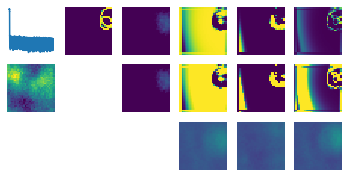

tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<


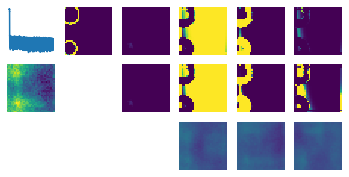

loss 70750 tensor(3.1907, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<


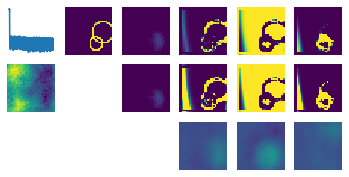

tensor(1.0000e-08, device='cuda:1') tensor(0.0522, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0522, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0522, device='cuda:1') >>><<


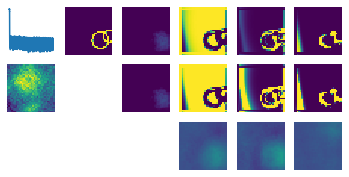

loss 71000 tensor(2.3308, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0278, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0278, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0278, device='cuda:1') >>><<


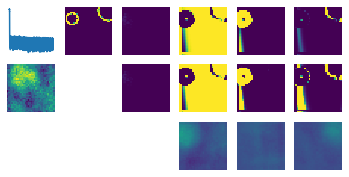

tensor(1.0000e-08, device='cuda:1') tensor(0.0276, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0276, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0276, device='cuda:1') >>><<


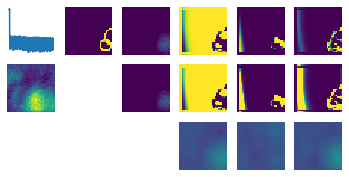

loss 71250 tensor(3.2896, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<


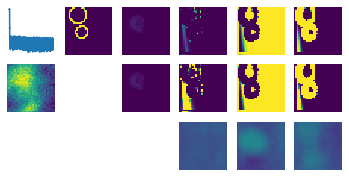

tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0418, device='cuda:1') >>><<


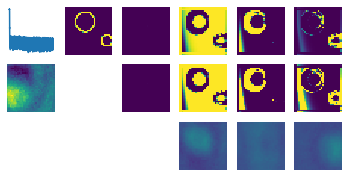

loss 71500 tensor(3.0954, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0704, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0704, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0704, device='cuda:1') >>><<


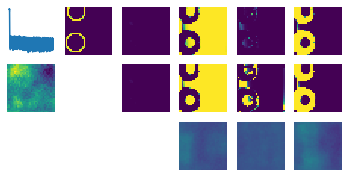

tensor(1.0000e-08, device='cuda:1') tensor(0.0668, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0668, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0668, device='cuda:1') >>><<


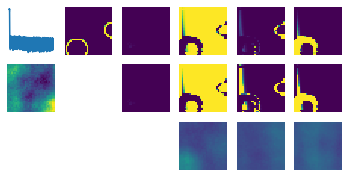

loss 71750 tensor(3.4976, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0370, device='cuda:1') >>><<


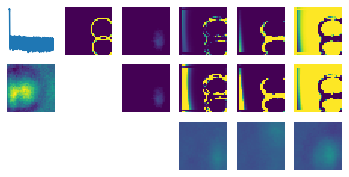

tensor(1.0000e-08, device='cuda:1') tensor(0.0350, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0350, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0350, device='cuda:1') >>><<


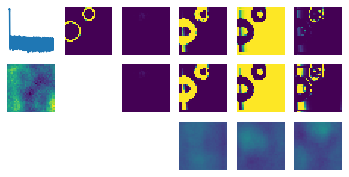

loss 72000 tensor(3.0554, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0435, device='cuda:1') >>><<


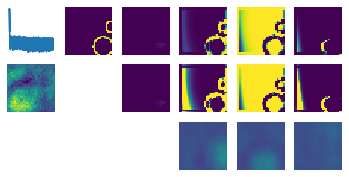

tensor(1.0000e-08, device='cuda:1') tensor(0.0247, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0247, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0247, device='cuda:1') >>><<


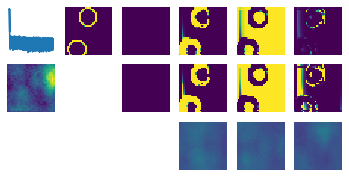

loss 72250 tensor(3.4386, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<


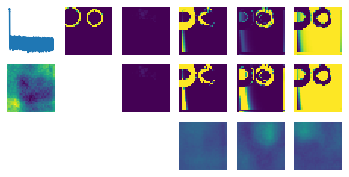

tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0195, device='cuda:1') >>><<


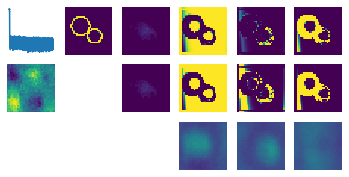

loss 72500 tensor(2.8005, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<


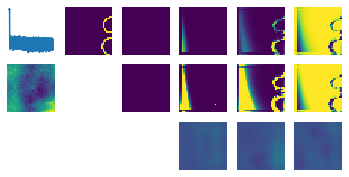

tensor(1.0000e-08, device='cuda:1') tensor(0.0347, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0347, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0347, device='cuda:1') >>><<


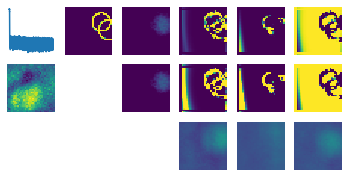

loss 72750 tensor(2.8126, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0560, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0560, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0560, device='cuda:1') >>><<


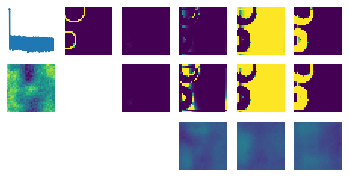

tensor(1.0000e-08, device='cuda:1') tensor(0.0515, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0515, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0515, device='cuda:1') >>><<


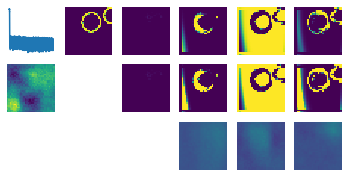

loss 73000 tensor(3.5512, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0451, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0451, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0451, device='cuda:1') >>><<


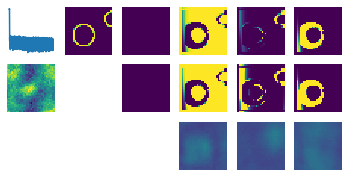

tensor(1.0000e-08, device='cuda:1') tensor(0.0437, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0437, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0437, device='cuda:1') >>><<


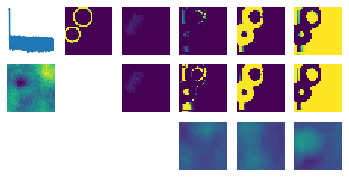

loss 73250 tensor(2.8867, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0349, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0349, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0349, device='cuda:1') >>><<


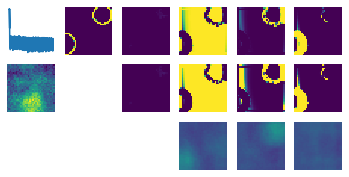

tensor(1.0000e-08, device='cuda:1') tensor(0.0358, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0358, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0358, device='cuda:1') >>><<


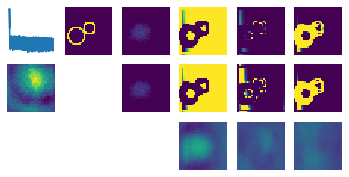

loss 73500 tensor(3.1877, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<


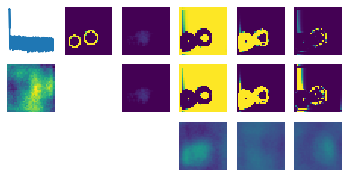

tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<


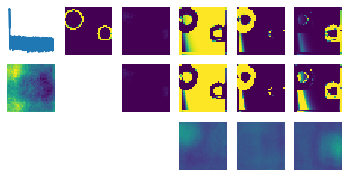

loss 73750 tensor(3.1785, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0421, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0421, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0421, device='cuda:1') >>><<


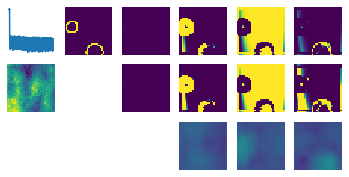

tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<


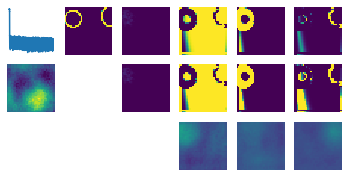

loss 74000 tensor(3.5469, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0133, device='cuda:1') >>><<


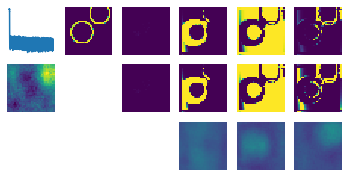

tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<


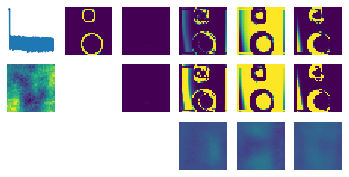

loss 74250 tensor(3.2605, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0408, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0408, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0408, device='cuda:1') >>><<


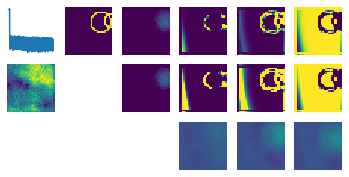

tensor(1.0000e-08, device='cuda:1') tensor(0.0316, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0316, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0316, device='cuda:1') >>><<


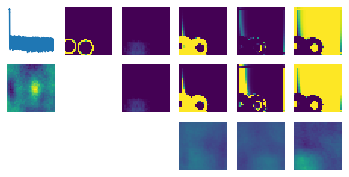

loss 74500 tensor(2.3295, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


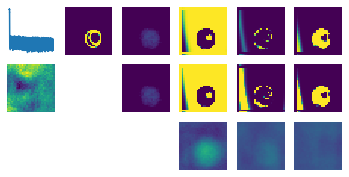

tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<


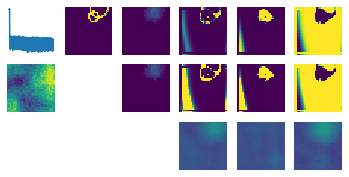

loss 74750 tensor(2.5497, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0229, device='cuda:1') >>><<


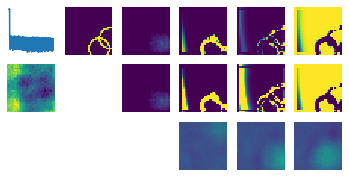

tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<


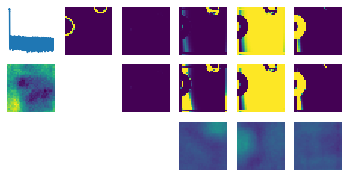

loss 75000 tensor(3.1625, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0321, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0321, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0321, device='cuda:1') >>><<


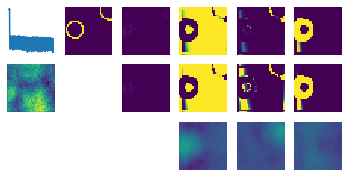

tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0326, device='cuda:1') >>><<


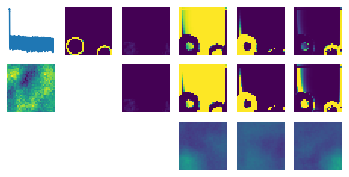

loss 75250 tensor(2.7657, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0635, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0635, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0635, device='cuda:1') >>><<


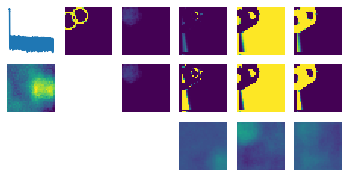

tensor(1.0000e-08, device='cuda:1') tensor(0.0407, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0407, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0407, device='cuda:1') >>><<


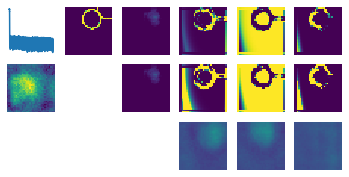

loss 75500 tensor(3.5627, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0674, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0674, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0674, device='cuda:1') >>><<


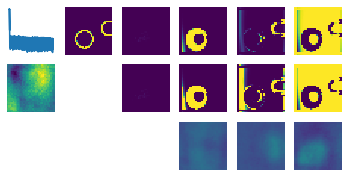

tensor(1.0000e-08, device='cuda:1') tensor(0.0493, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0493, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0493, device='cuda:1') >>><<


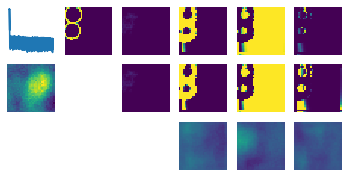

loss 75750 tensor(3.4233, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0442, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0442, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0442, device='cuda:1') >>><<


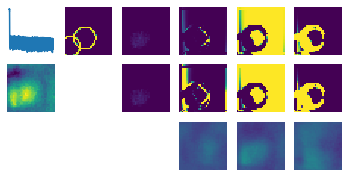

tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<


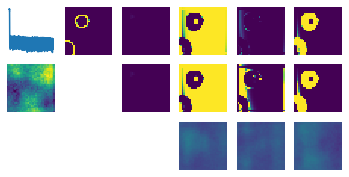

loss 76000 tensor(2.6851, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<


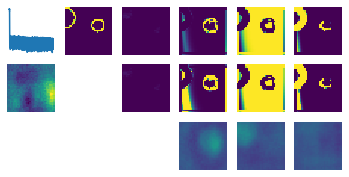

tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0256, device='cuda:1') >>><<


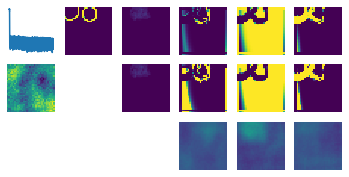

loss 76250 tensor(2.8441, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<


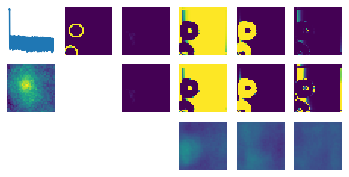

tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0215, device='cuda:1') >>><<


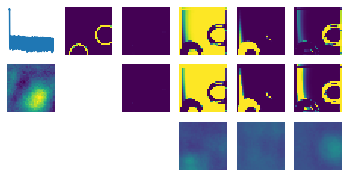

loss 76500 tensor(2.7618, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0304, device='cuda:1') >>><<


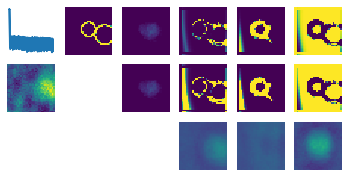

tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<


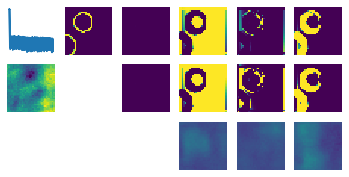

loss 76750 tensor(3.4611, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<


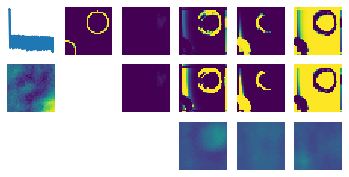

tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0153, device='cuda:1') >>><<


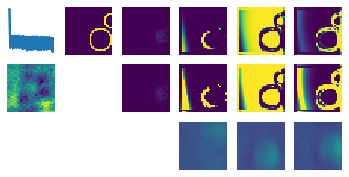

loss 77000 tensor(3.6943, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0181, device='cuda:1') >>><<


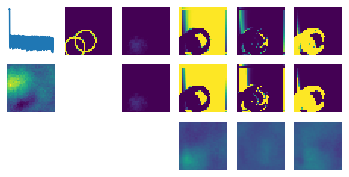

tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<


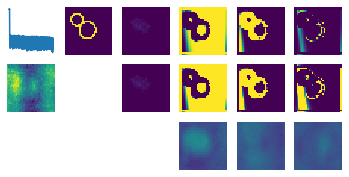

loss 77250 tensor(3.0993, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


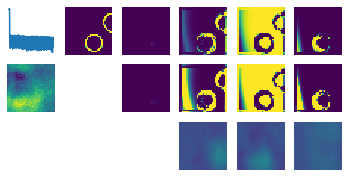

tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<


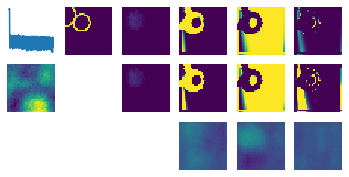

loss 77500 tensor(2.9462, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<


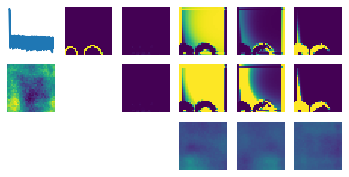

tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0169, device='cuda:1') >>><<


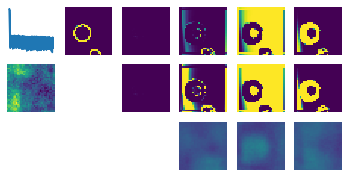

loss 77750 tensor(3.0445, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<


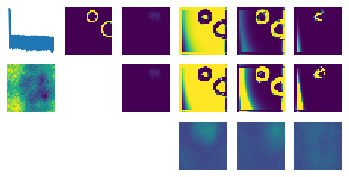

tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<


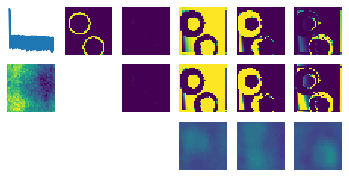

loss 78000 tensor(3.2211, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0233, device='cuda:1') >>><<


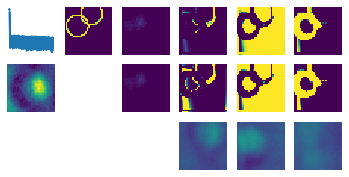

tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0239, device='cuda:1') >>><<


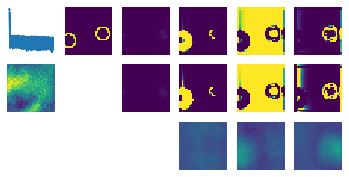

loss 78250 tensor(3.0690, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0279, device='cuda:1') >>><<


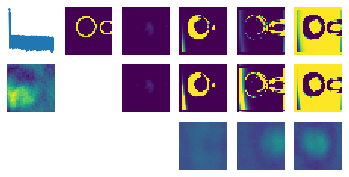

tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


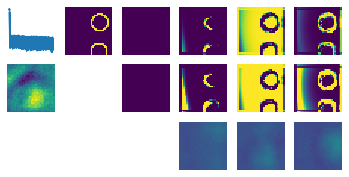

loss 78500 tensor(3.1119, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0162, device='cuda:1') >>><<


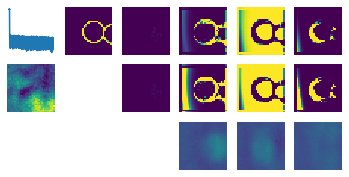

tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<


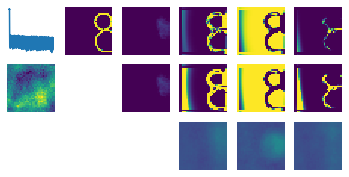

loss 78750 tensor(3.0851, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0231, device='cuda:1') >>><<


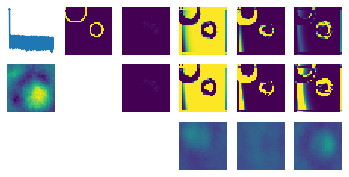

tensor(1.0000e-08, device='cuda:1') tensor(0.0202, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0202, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0202, device='cuda:1') >>><<


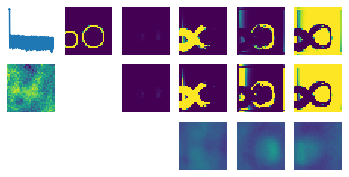

loss 79000 tensor(2.9903, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


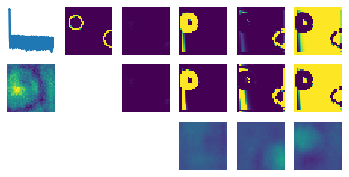

tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<


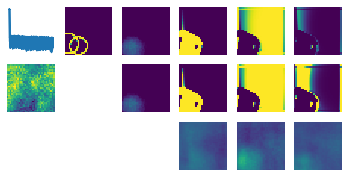

loss 79250 tensor(3.3759, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0183, device='cuda:1') >>><<


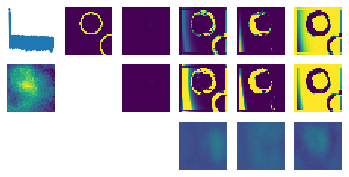

tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0187, device='cuda:1') >>><<


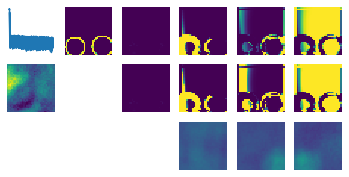

loss 79500 tensor(2.8946, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<


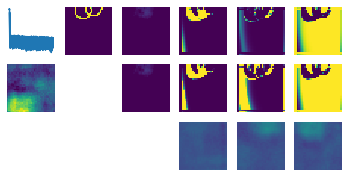

tensor(1.0000e-08, device='cuda:1') tensor(0.0373, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0373, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0373, device='cuda:1') >>><<


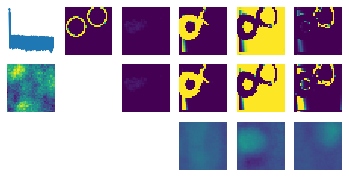

loss 79750 tensor(2.7093, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<


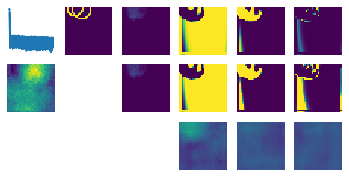

tensor(1.0000e-08, device='cuda:1') tensor(0.0285, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0285, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0285, device='cuda:1') >>><<


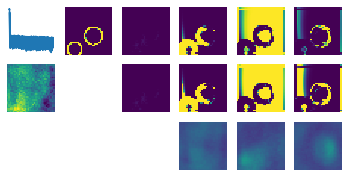

loss 80000 tensor(2.9479, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0422, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0422, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0422, device='cuda:1') >>><<


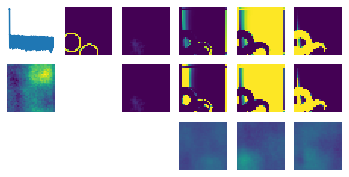

tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0427, device='cuda:1') >>><<


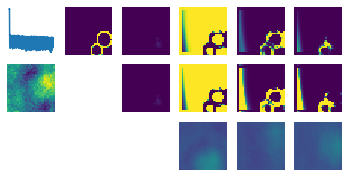

loss 80250 tensor(3.4888, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0432, device='cuda:1') >>><<


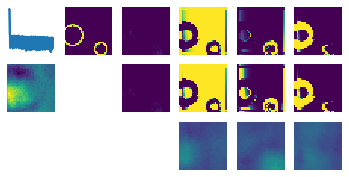

tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0434, device='cuda:1') >>><<


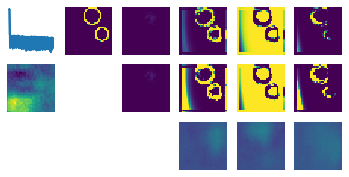

loss 80500 tensor(3.4913, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0438, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0438, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0438, device='cuda:1') >>><<


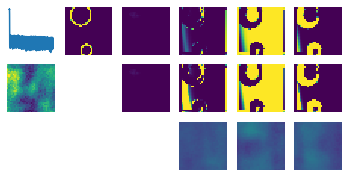

tensor(1.0000e-08, device='cuda:1') tensor(0.0458, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0458, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0458, device='cuda:1') >>><<


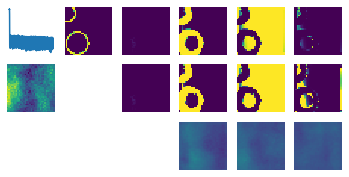

loss 80750 tensor(3.1091, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0289, device='cuda:1') >>><<


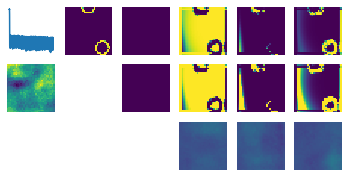

tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0206, device='cuda:1') >>><<


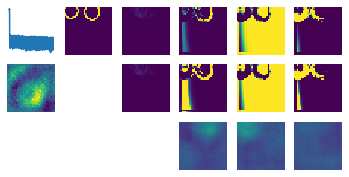

loss 81000 tensor(2.8937, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<


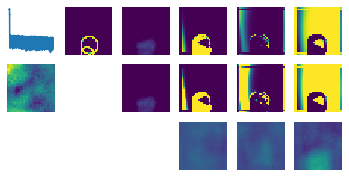

tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0213, device='cuda:1') >>><<


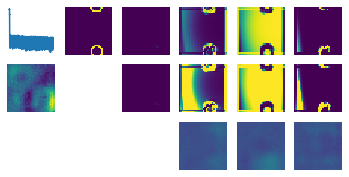

loss 81250 tensor(3.0799, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<


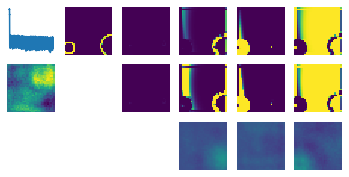

tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0199, device='cuda:1') >>><<


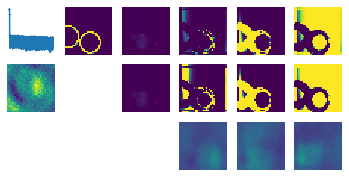

loss 81500 tensor(3.2509, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<


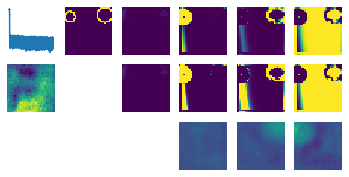

tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0171, device='cuda:1') >>><<


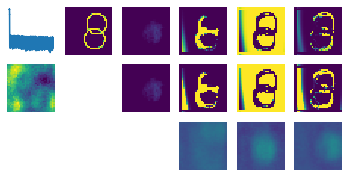

loss 81750 tensor(2.6568, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0191, device='cuda:1') >>><<


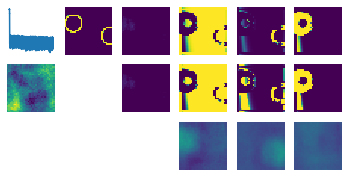

tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0192, device='cuda:1') >>><<


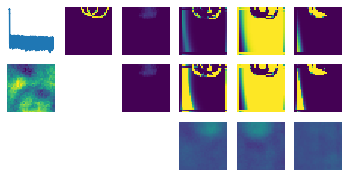

loss 82000 tensor(3.4413, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0179, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0179, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0179, device='cuda:1') >>><<


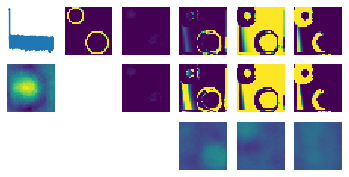

tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0177, device='cuda:1') >>><<


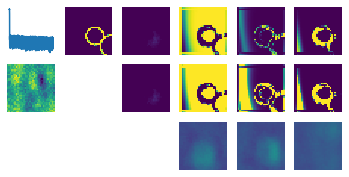

loss 82250 tensor(2.4351, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0479, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0479, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0479, device='cuda:1') >>><<


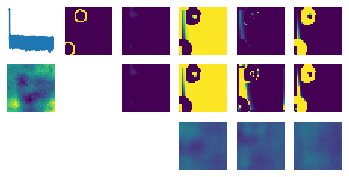

tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0467, device='cuda:1') >>><<


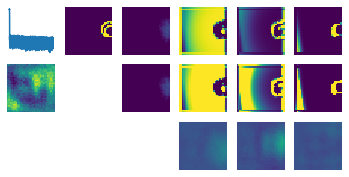

loss 82500 tensor(2.7988, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0508, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0508, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0508, device='cuda:1') >>><<


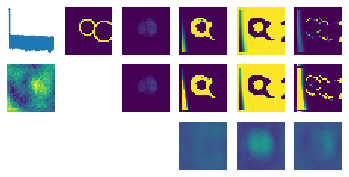

tensor(1.0000e-08, device='cuda:1') tensor(0.0506, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0506, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0506, device='cuda:1') >>><<


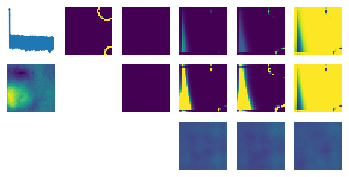

loss 82750 tensor(3.0716, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<


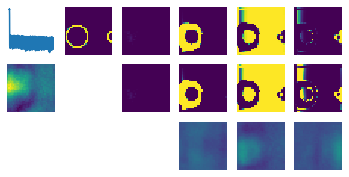

tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0203, device='cuda:1') >>><<


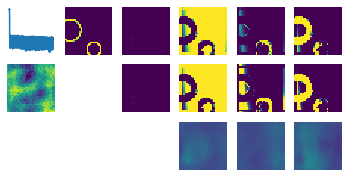

loss 83000 tensor(2.3603, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0576, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0576, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0576, device='cuda:1') >>><<


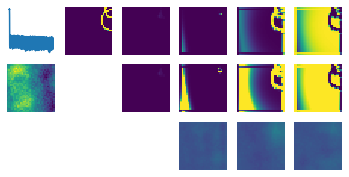

tensor(1.0000e-08, device='cuda:1') tensor(0.0558, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0558, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0558, device='cuda:1') >>><<


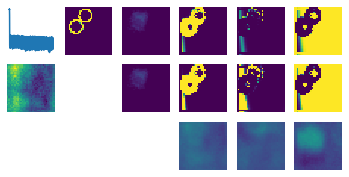

loss 83250 tensor(2.8886, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<


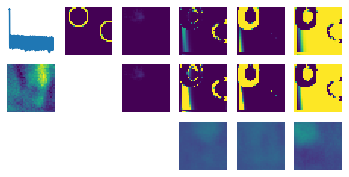

tensor(1.0000e-08, device='cuda:1') tensor(0.0345, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0345, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0345, device='cuda:1') >>><<


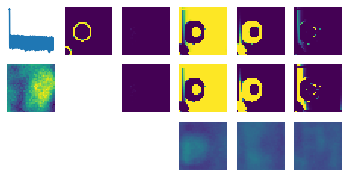

loss 83500 tensor(3.3627, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<


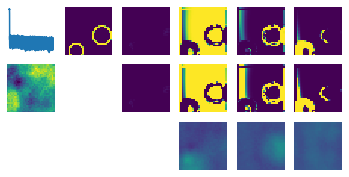

tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<


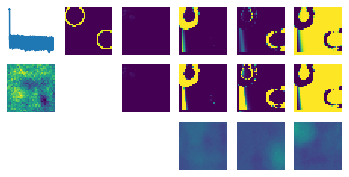

loss 83750 tensor(3.5099, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0332, device='cuda:1') >>><<


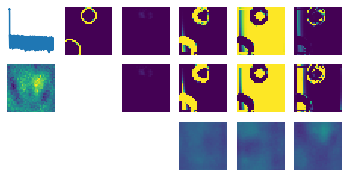

tensor(1.0000e-08, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0331, device='cuda:1') >>><<


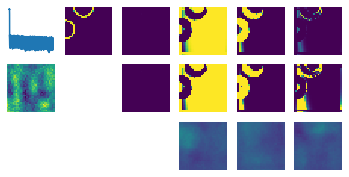

loss 84000 tensor(2.6865, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0446, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0446, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0446, device='cuda:1') >>><<


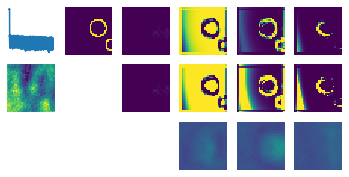

tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<


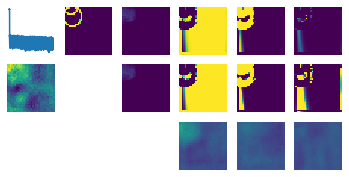

loss 84250 tensor(2.7352, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<


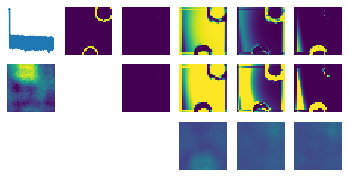

tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<


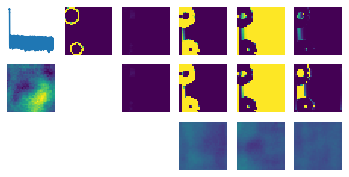

loss 84500 tensor(3.5809, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<


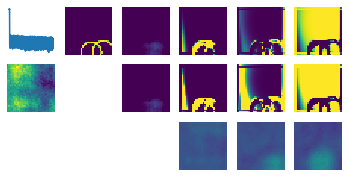

tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0197, device='cuda:1') >>><<


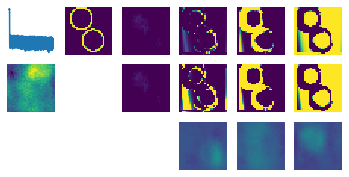

loss 84750 tensor(3.0631, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0377, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0377, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0377, device='cuda:1') >>><<


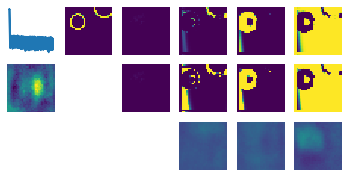

tensor(1.0000e-08, device='cuda:1') tensor(0.0457, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0457, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0457, device='cuda:1') >>><<


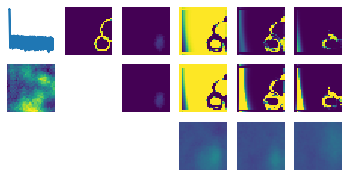

loss 85000 tensor(3.1945, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0270, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0270, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0270, device='cuda:1') >>><<


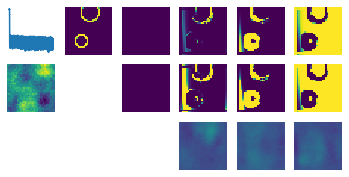

tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0275, device='cuda:1') >>><<


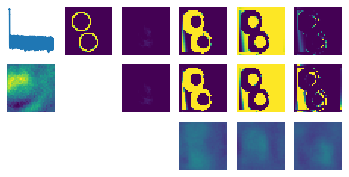

loss 85250 tensor(3.0783, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0524, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0524, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0524, device='cuda:1') >>><<


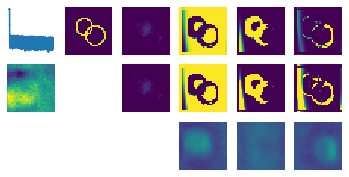

tensor(1.0000e-08, device='cuda:1') tensor(0.0516, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0516, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0516, device='cuda:1') >>><<


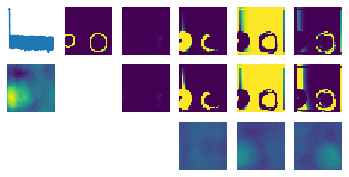

loss 85500 tensor(2.6626, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0399, device='cuda:1') >>><<


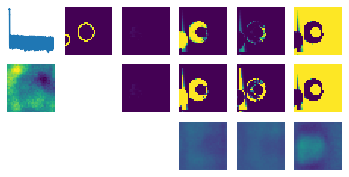

tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0497, device='cuda:1') >>><<


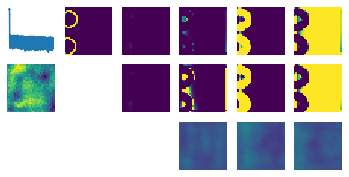

loss 85750 tensor(3.2643, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0242, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0242, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0242, device='cuda:1') >>><<


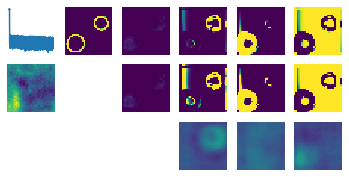

tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0263, device='cuda:1') >>><<


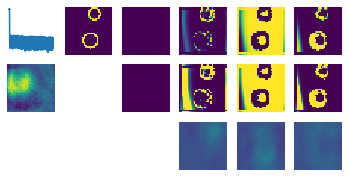

loss 86000 tensor(3.3888, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0781, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0781, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0781, device='cuda:1') >>><<


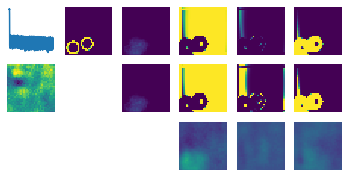

tensor(1.0000e-08, device='cuda:1') tensor(0.0666, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0666, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0666, device='cuda:1') >>><<


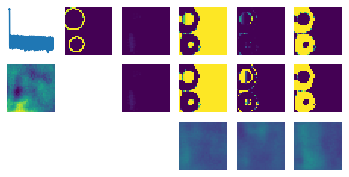

loss 86250 tensor(2.9713, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0180, device='cuda:1') >>><<


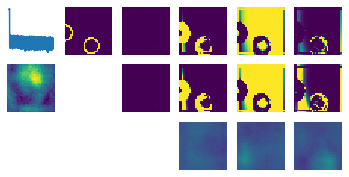

tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0154, device='cuda:1') >>><<


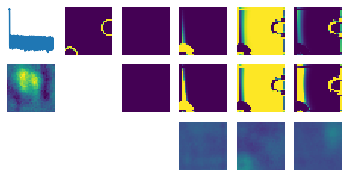

loss 86500 tensor(2.9649, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0156, device='cuda:1') >>><<


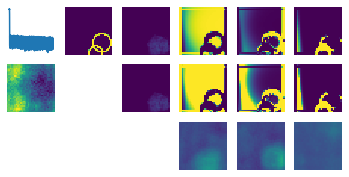

tensor(1.0000e-08, device='cuda:1') tensor(0.0200, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0200, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0200, device='cuda:1') >>><<


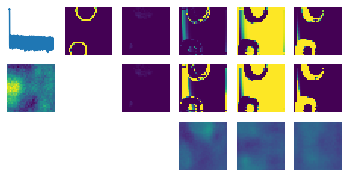

loss 86750 tensor(2.7451, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0591, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0591, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0591, device='cuda:1') >>><<


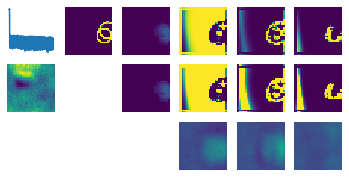

tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0606, device='cuda:1') >>><<


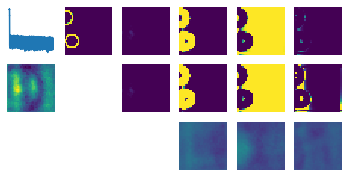

loss 87000 tensor(3.1243, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0269, device='cuda:1') >>><<


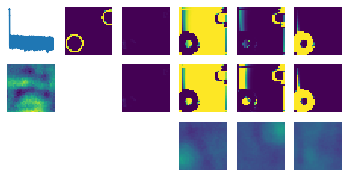

tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0274, device='cuda:1') >>><<


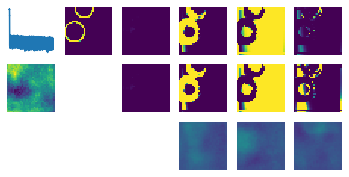

loss 87250 tensor(2.6273, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0413, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0413, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0413, device='cuda:1') >>><<


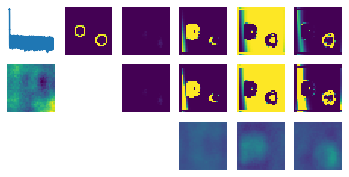

tensor(1.0000e-08, device='cuda:1') tensor(0.0297, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0297, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0297, device='cuda:1') >>><<


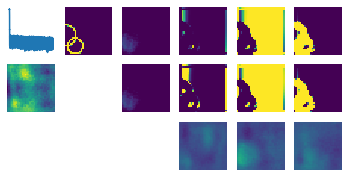

loss 87500 tensor(2.9802, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


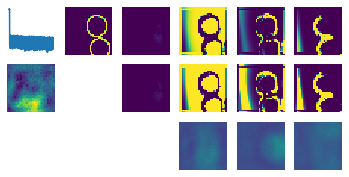

tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0283, device='cuda:1') >>><<


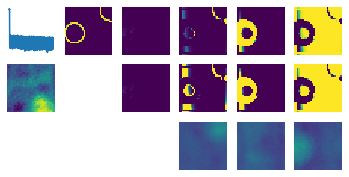

loss 87750 tensor(3.1358, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0599, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0599, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0599, device='cuda:1') >>><<


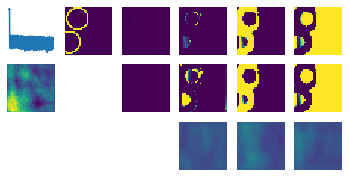

tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0588, device='cuda:1') >>><<


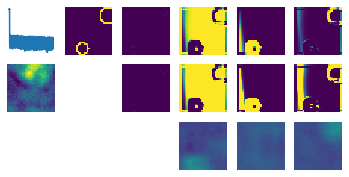

loss 88000 tensor(2.7511, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0255, device='cuda:1') >>><<


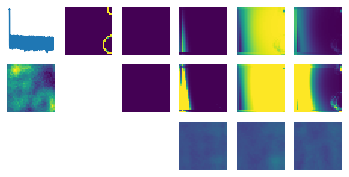

tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<


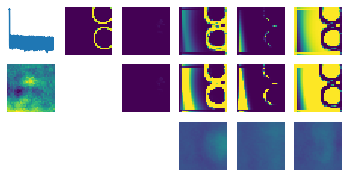

loss 88250 tensor(2.9701, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<


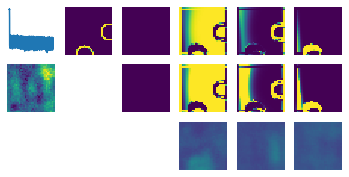

tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0225, device='cuda:1') >>><<


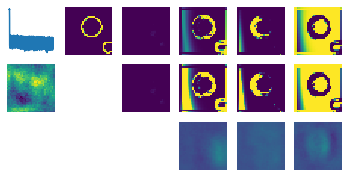

loss 88500 tensor(2.6050, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0384, device='cuda:1') >>><<


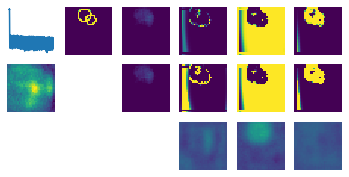

tensor(1.0000e-08, device='cuda:1') tensor(0.0337, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0337, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0337, device='cuda:1') >>><<


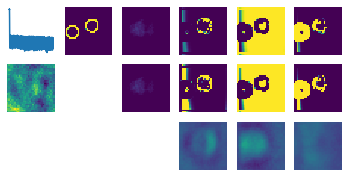

loss 88750 tensor(2.7787, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0265, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0265, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0265, device='cuda:1') >>><<


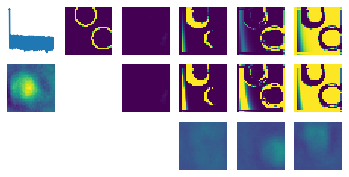

tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<


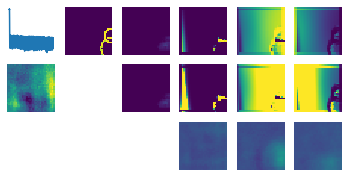

loss 89000 tensor(2.8717, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0703, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0703, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0703, device='cuda:1') >>><<


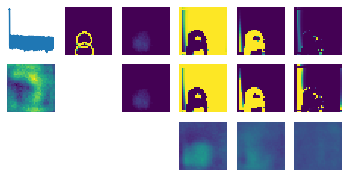

tensor(1.0000e-08, device='cuda:1') tensor(0.0715, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0715, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0715, device='cuda:1') >>><<


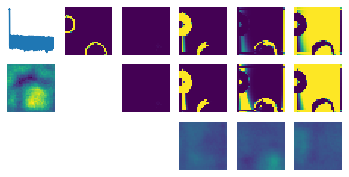

loss 89250 tensor(3.4239, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<


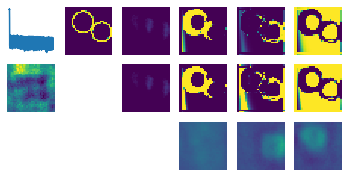

tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0250, device='cuda:1') >>><<


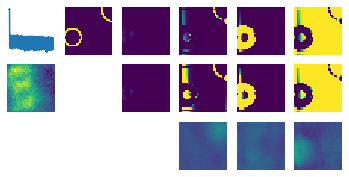

loss 89500 tensor(3.5032, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0849, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0849, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0849, device='cuda:1') >>><<


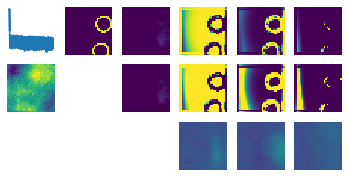

tensor(1.0000e-08, device='cuda:1') tensor(0.0383, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0383, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0383, device='cuda:1') >>><<


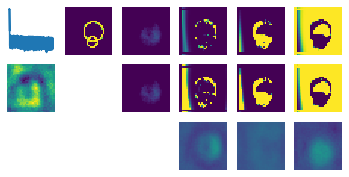

loss 89750 tensor(2.9828, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0210, device='cuda:1') >>><<


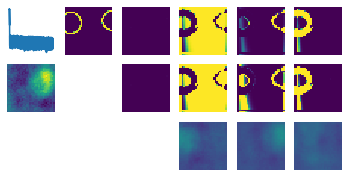

tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0196, device='cuda:1') >>><<


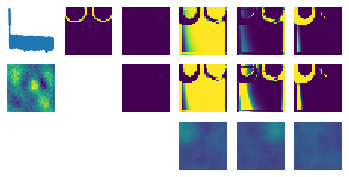

loss 90000 tensor(3.1939, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0161, device='cuda:1') >>><<


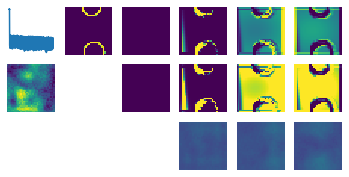

tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0167, device='cuda:1') >>><<


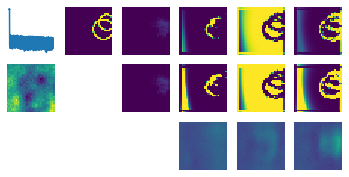

loss 90250 tensor(2.9464, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<


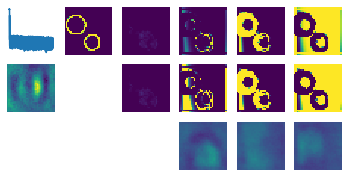

tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0159, device='cuda:1') >>><<


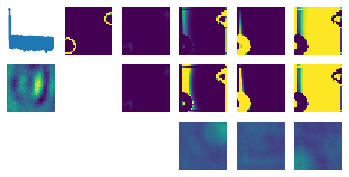

loss 90500 tensor(2.3685, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0573, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0573, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0573, device='cuda:1') >>><<


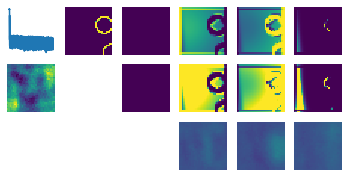

tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0510, device='cuda:1') >>><<


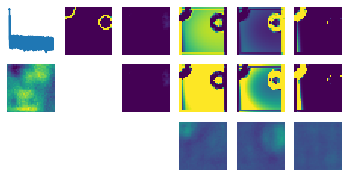

loss 90750 tensor(3.1664, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0266, device='cuda:1') >>><<


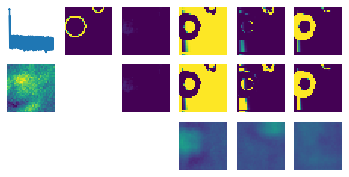

tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0268, device='cuda:1') >>><<


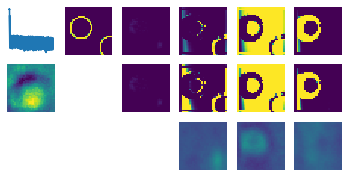

loss 91000 tensor(2.8922, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.1006, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.1006, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.1006, device='cuda:1') >>><<


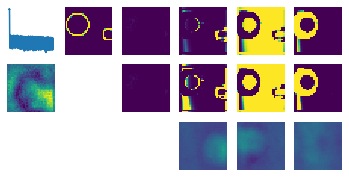

tensor(1.0000e-08, device='cuda:1') tensor(0.1019, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.1019, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.1019, device='cuda:1') >>><<


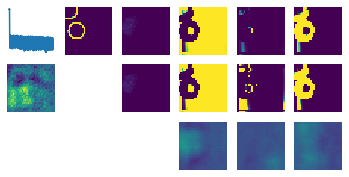

loss 91250 tensor(2.9926, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0164, device='cuda:1') >>><<


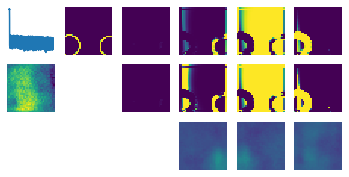

tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0172, device='cuda:1') >>><<


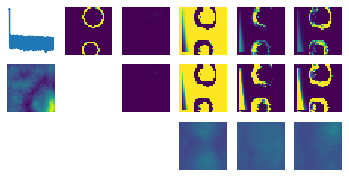

loss 91500 tensor(2.8329, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0280, device='cuda:1') >>><<


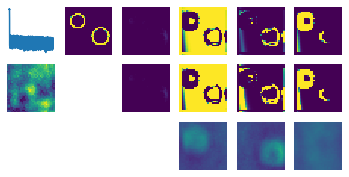

tensor(1.0000e-08, device='cuda:1') tensor(0.0272, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0272, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0272, device='cuda:1') >>><<


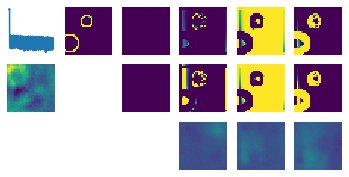

loss 91750 tensor(2.5060, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0216, device='cuda:1') >>><<


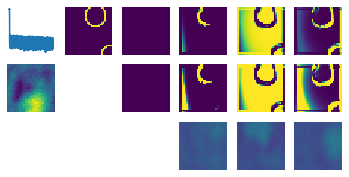

tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0221, device='cuda:1') >>><<


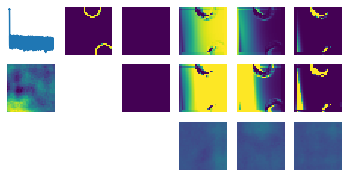

loss 92000 tensor(3.1720, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0137, device='cuda:1') >>><<


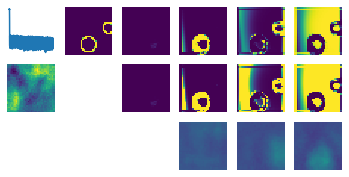

tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<


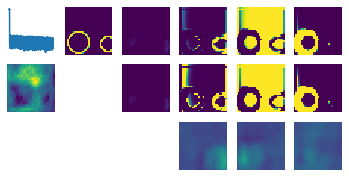

loss 92250 tensor(3.0670, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0240, device='cuda:1') >>><<


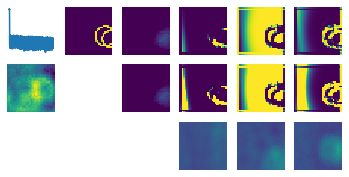

tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0243, device='cuda:1') >>><<


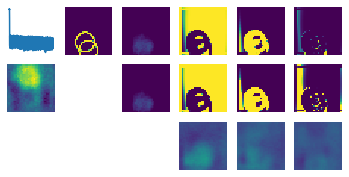

loss 92500 tensor(2.3914, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<


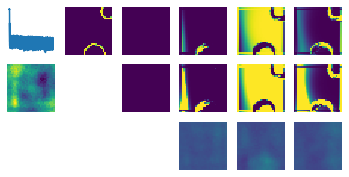

tensor(1.0000e-08, device='cuda:1') tensor(0.0344, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0344, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0344, device='cuda:1') >>><<


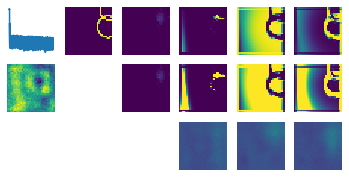

loss 92750 tensor(3.4224, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0182, device='cuda:1') >>><<


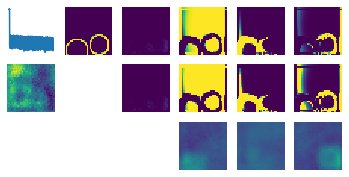

tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<


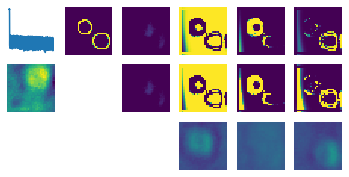

loss 93000 tensor(2.9474, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


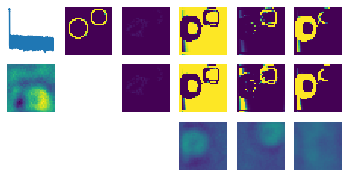

tensor(1.0000e-08, device='cuda:1') tensor(0.0424, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0424, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0424, device='cuda:1') >>><<


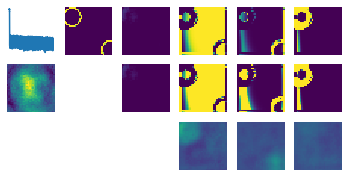

loss 93250 tensor(2.6677, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0237, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0237, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0237, device='cuda:1') >>><<


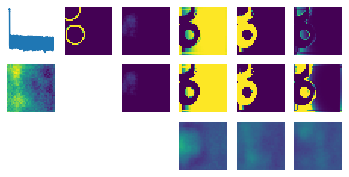

tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0535, device='cuda:1') >>><<


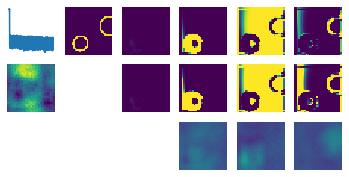

loss 93500 tensor(2.8374, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0117, device='cuda:1') >>><<


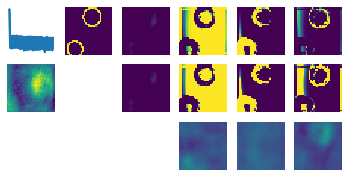

tensor(1.0000e-08, device='cuda:1') tensor(0.0204, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0204, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0204, device='cuda:1') >>><<


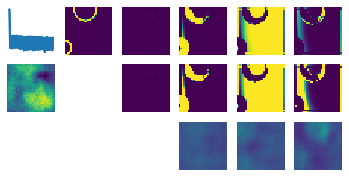

loss 93750 tensor(3.1646, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<


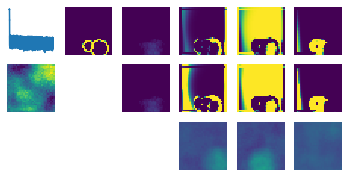

tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0392, device='cuda:1') >>><<


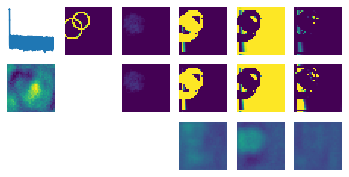

loss 94000 tensor(3.0207, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0252, device='cuda:1') >>><<


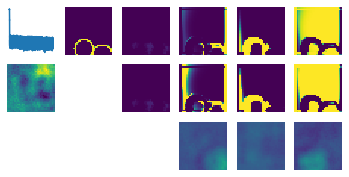

tensor(1.0000e-08, device='cuda:1') tensor(0.0248, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0248, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0248, device='cuda:1') >>><<


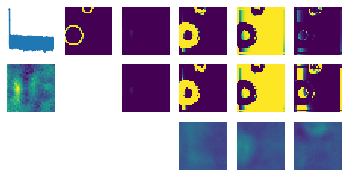

loss 94250 tensor(2.6871, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


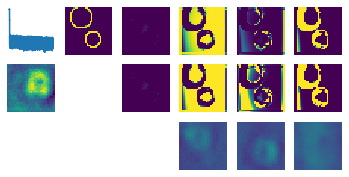

tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0127, device='cuda:1') >>><<


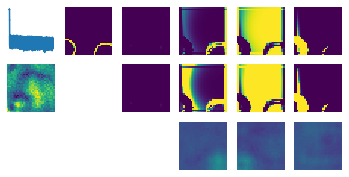

loss 94500 tensor(2.5680, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0355, device='cuda:1') >>><<


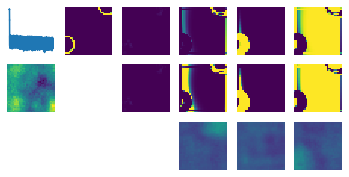

tensor(1.0000e-08, device='cuda:1') tensor(0.0354, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0354, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0354, device='cuda:1') >>><<


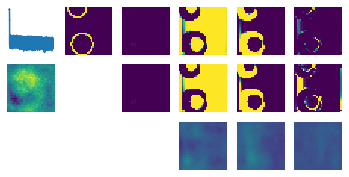

loss 94750 tensor(3.3760, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0441, device='cuda:1') >>><<


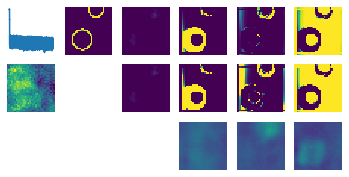

tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0447, device='cuda:1') >>><<


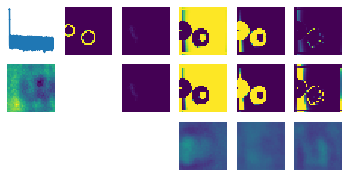

loss 95000 tensor(3.3314, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0165, device='cuda:1') >>><<


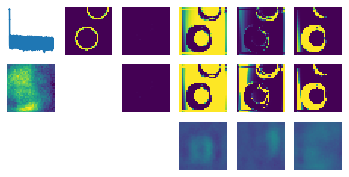

tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0105, device='cuda:1') >>><<


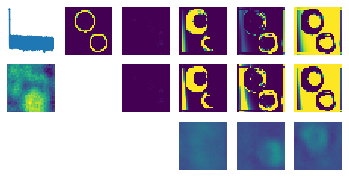

loss 95250 tensor(2.6563, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0234, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0234, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0234, device='cuda:1') >>><<


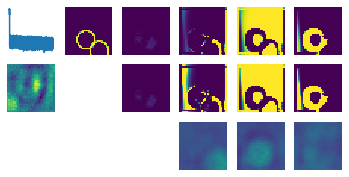

tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0122, device='cuda:1') >>><<


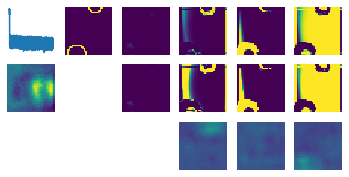

loss 95500 tensor(2.6024, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0186, device='cuda:1') >>><<


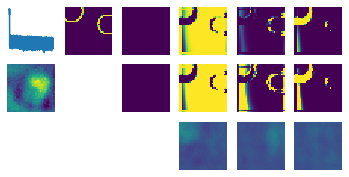

tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0188, device='cuda:1') >>><<


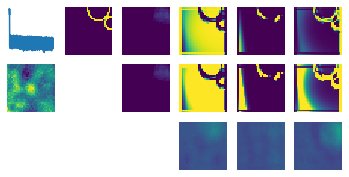

loss 95750 tensor(3.1784, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0500, device='cuda:1') >>><<


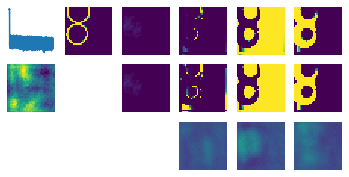

tensor(1.0000e-08, device='cuda:1') tensor(0.0749, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0749, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0749, device='cuda:1') >>><<


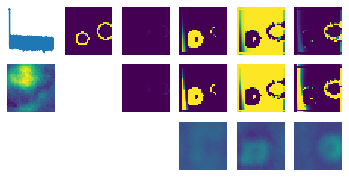

loss 96000 tensor(3.1071, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0144, device='cuda:1') >>><<


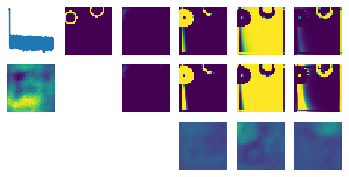

tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0185, device='cuda:1') >>><<


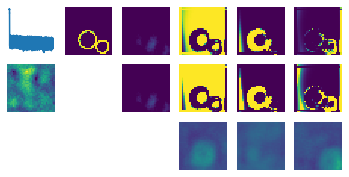

loss 96250 tensor(3.0965, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0235, device='cuda:1') >>><<


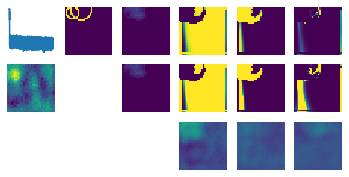

tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0387, device='cuda:1') >>><<


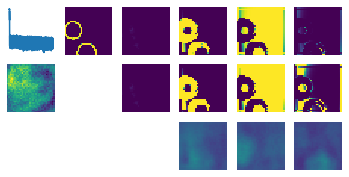

loss 96500 tensor(2.9973, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0201, device='cuda:1') >>><<


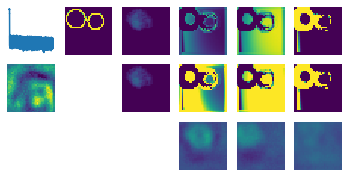

tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0176, device='cuda:1') >>><<


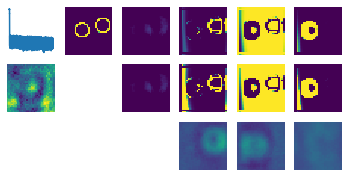

loss 96750 tensor(3.1314, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0178, device='cuda:1') >>><<


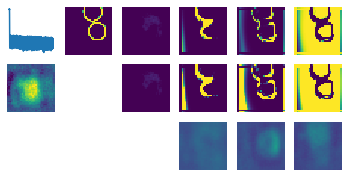

tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0140, device='cuda:1') >>><<


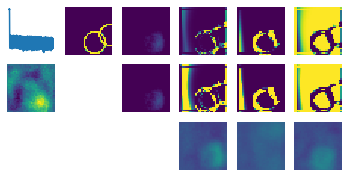

loss 97000 tensor(2.6285, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<


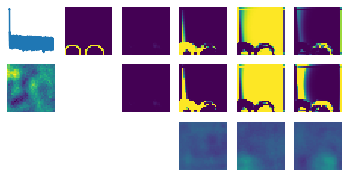

tensor(1.0000e-08, device='cuda:1') tensor(0.0305, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0305, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0305, device='cuda:1') >>><<


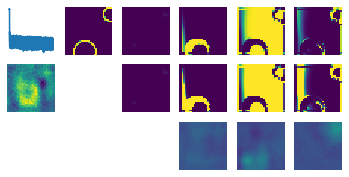

loss 97250 tensor(2.4739, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0476, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0476, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0476, device='cuda:1') >>><<


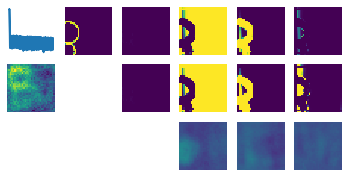

tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0426, device='cuda:1') >>><<


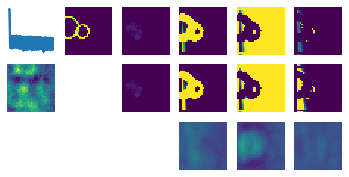

loss 97500 tensor(2.9952, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0205, device='cuda:1') >>><<


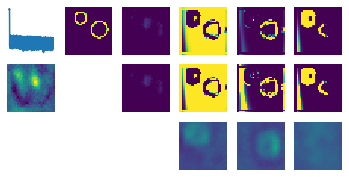

tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<


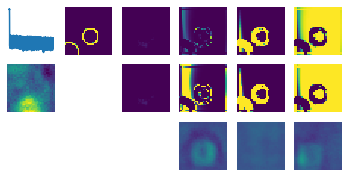

loss 97750 tensor(2.8392, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0273, device='cuda:1') >>><<


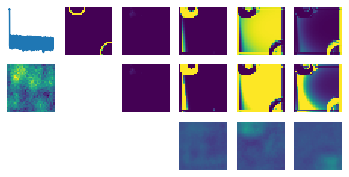

tensor(1.0000e-08, device='cuda:1') tensor(0.0315, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0315, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0315, device='cuda:1') >>><<


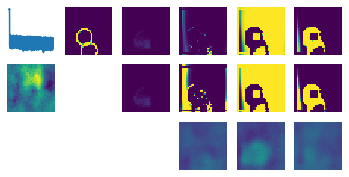

loss 98000 tensor(3.4554, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0214, device='cuda:1') >>><<


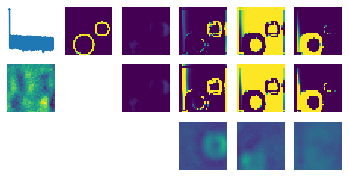

tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0208, device='cuda:1') >>><<


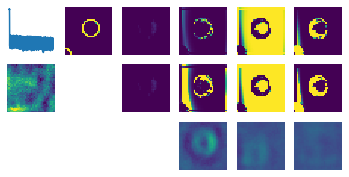

loss 98250 tensor(3.4143, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0618, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0618, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0618, device='cuda:1') >>><<


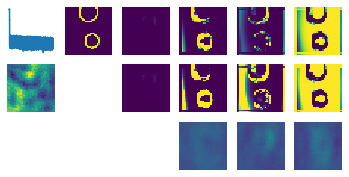

tensor(1.0000e-08, device='cuda:1') tensor(0.0842, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0842, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0842, device='cuda:1') >>><<


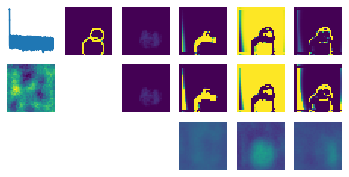

loss 98500 tensor(3.1852, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0138, device='cuda:1') >>><<


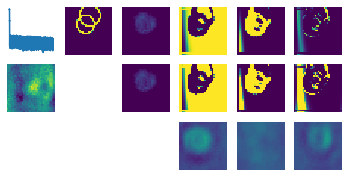

tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0143, device='cuda:1') >>><<


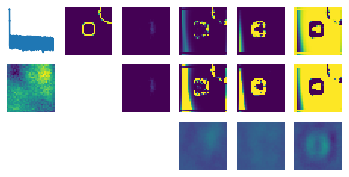

loss 98750 tensor(3.1684, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0124, device='cuda:1') >>><<


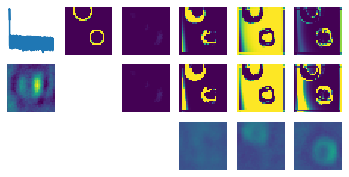

tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0155, device='cuda:1') >>><<


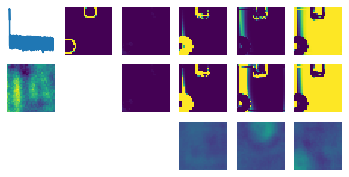

loss 99000 tensor(3.1287, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0220, device='cuda:1') >>><<


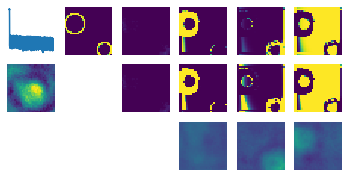

tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0207, device='cuda:1') >>><<


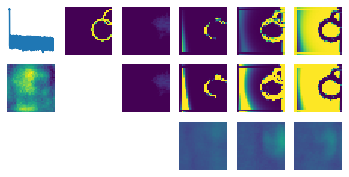

loss 99250 tensor(2.8814, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0292, device='cuda:1') >>><<


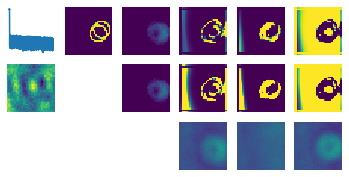

tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0251, device='cuda:1') >>><<


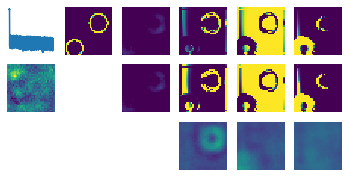

loss 99500 tensor(3.5915, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0287, device='cuda:1') >>><<


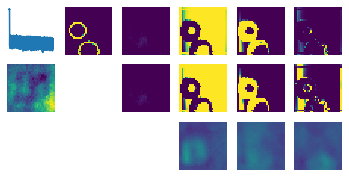

tensor(1.0000e-08, device='cuda:1') tensor(0.0271, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0271, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0271, device='cuda:1') >>><<


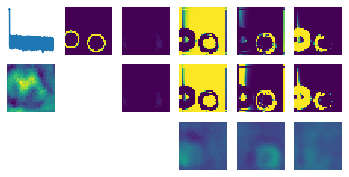

loss 99750 tensor(2.4405, device='cuda:1', grad_fn=<MseLossBackward0>) 0.0003
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0246, device='cuda:1') >>><<


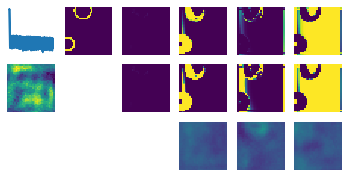

tensor(1.0000e-08, device='cuda:1') tensor(0.0249, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0249, device='cuda:1') >>><<
tensor(1.0000e-08, device='cuda:1') tensor(0.0249, device='cuda:1') >>><<


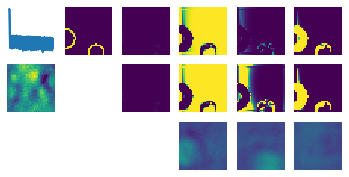

In [16]:
model = AttModel().to(device)
model,*_rest = train(model,100_000)

In [ ]:
# all-track fit :  is it a compromise just to make 

In [ ]:
!